## Mount the google drive

In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

## Import the libraries

In [2]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.metrics import mean_squared_error

import statsmodels.api as sm
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.vector_ar.vecm import coint_johansen

from statsmodels.tsa.stattools  import grangercausalitytests

from pylab import rcParams
import statsmodels.api as sm

from scipy.stats import boxcox
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

## Read the dataset

In [3]:
data_train = pd.read_csv('/content/drive/MyDrive/Rossman Dataset/train.csv')
data_store = pd.read_csv('/content/drive/MyDrive/Rossman Dataset/store.csv')

In [4]:
data_store.head()

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


## Parse the Date column

In [5]:
data_train['Date'] = pd.to_datetime(data_train.Date)
data_train.head(3)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1


In [6]:
data_train.tail(3)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
1017206,1113,2,2013-01-01,0,0,0,0,a,1
1017207,1114,2,2013-01-01,0,0,0,0,a,1
1017208,1115,2,2013-01-01,0,0,0,0,a,1


## We will create a dataframe copy of the data_train and data_store

In [7]:
df_train = data_train

In [8]:
df_store = data_store

## Now we will sort the train dataframe based on the date as we can see that the latest date is in the head and the oldest is in the tail

In [9]:
df_train.sort_values(['Date','Store'],inplace=True)

In [10]:
df_train.head(2)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
1016095,1,2,2013-01-01,0,0,0,0,a,1
1016096,2,2,2013-01-01,0,0,0,0,a,1


In [11]:
df_train.tail(2)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
1113,1114,5,2015-07-31,27508,3745,1,1,0,1
1114,1115,5,2015-07-31,8680,538,1,1,0,1


In [12]:
df_train.reset_index(drop=True, inplace=True)

## Get the information of the train data set

In [13]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1017209 entries, 0 to 1017208
Data columns (total 9 columns):
 #   Column         Non-Null Count    Dtype         
---  ------         --------------    -----         
 0   Store          1017209 non-null  int64         
 1   DayOfWeek      1017209 non-null  int64         
 2   Date           1017209 non-null  datetime64[ns]
 3   Sales          1017209 non-null  int64         
 4   Customers      1017209 non-null  int64         
 5   Open           1017209 non-null  int64         
 6   Promo          1017209 non-null  int64         
 7   StateHoliday   1017209 non-null  object        
 8   SchoolHoliday  1017209 non-null  int64         
dtypes: datetime64[ns](1), int64(7), object(1)
memory usage: 69.8+ MB


## Since we need to do analysis on stores 1,3,8,9,13,25,29,31 and 46. So we would be filtering out data of these stores

In [14]:
stores_in_scope = [1,3,8,9,13,25,29,31,46]

In [15]:
df_train = df_train[df_train['Store'].isin(stores_in_scope)]

## Now we see the distribution of each stores

In [16]:
df_train['Store'].value_counts()

31    942
3     942
29    942
25    942
9     942
1     942
8     942
46    758
13    758
Name: Store, dtype: int64

### Apart from store 46 and store 13 we could see that all other stores are having count as 942 and we could see that the dataset is almost balanced or not that much skewed

# Let us now analyse the data with respect to the store one by one



1.   Store 1


In [17]:
df_train[np.where(df_train['Store']==1,True,False)][0:20]

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,2,2013-01-01,0,0,0,0,a,1
1114,1,3,2013-01-02,5530,668,1,0,0,1
2229,1,4,2013-01-03,4327,578,1,0,0,1
3344,1,5,2013-01-04,4486,619,1,0,0,1
4459,1,6,2013-01-05,4997,635,1,0,0,1
5574,1,7,2013-01-06,0,0,0,0,0,1
6689,1,1,2013-01-07,7176,785,1,1,0,1
7804,1,2,2013-01-08,5580,654,1,1,0,1
8919,1,3,2013-01-09,5471,626,1,1,0,1
10034,1,4,2013-01-10,4892,615,1,1,0,1


## We could observe the following by filtering the Store 1:
1. Every 7th day of the week the sales is 0, which could imply that the shop might be close on that day. Also other date are also having 0 sales which give us an indication of the fact that could be some holiday. We could move ahead and drop the records where there are no Sales

In [18]:
df_train = df_train[np.where(df_train['Sales']==0,False,True)]

In [19]:
## Now let us check if there is any record is left where there was no Sales in a day
df_train[df_train['Sales']==0]

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday


## Also we will se the distribution after we remove the recods with no Sales

In [20]:
df_train.value_counts('Store').sort_index()

Store
1     781
3     779
8     784
9     779
13    621
25    750
29    779
31    784
46    622
dtype: int64

## Now let us see the description of the train dataset as well as we will check if there is any null value in the dataset

In [21]:
df_train.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
count,6679.000000,6679.000000,6679.000000,6679.000000,6679.0,6679.000000,6679.000000
mean,17.776763,3.506064,6549.722414,716.810600,1.0,0.447971,0.193292
std,13.999680,1.712728,2632.977121,353.300394,0.0,0.497323,0.394910
min,1.000000,1.000000,1410.000000,194.000000,1.0,0.000000,0.000000
25%,8.000000,2.000000,4740.500000,517.000000,1.0,0.000000,0.000000
50%,13.000000,3.000000,5921.000000,619.000000,1.0,0.000000,0.000000
75%,29.000000,5.000000,7829.500000,765.500000,1.0,1.000000,0.000000
max,46.000000,6.000000,24882.000000,2835.000000,1.0,1.000000,1.000000


In [22]:
df_train.isna().sum()

Store            0
DayOfWeek        0
Date             0
Sales            0
Customers        0
Open             0
Promo            0
StateHoliday     0
SchoolHoliday    0
dtype: int64

We could see that there is no missing values in the train dataset for the stores that we want to analyse

# Now we do the grouping of the data storewise 

In [23]:
##Initialise an empty list
store_df = []

## Create a dataframe each for the stores that we need to analyse and analyse it to the above created list
for i in stores_in_scope:
  store_df.append(df_train[np.where(df_train['Store']==i,True,False)])

## Now we will resequence the date column
for store_df_1 in store_df:
  store_df_1['Date'] = pd.date_range(start='2013-01-01', periods=len(store_df_1), freq='D')
  ## Also we will drop the Open column as it will only having value as 1
  store_df_1.drop(columns=['Open'], inplace=True)

for df in store_df:
  print(df.head(5))
  print(df.columns)

      Store  DayOfWeek       Date  ...  Promo  StateHoliday  SchoolHoliday
1114      1          3 2013-01-01  ...      0             0              1
2229      1          4 2013-01-02  ...      0             0              1
3344      1          5 2013-01-03  ...      0             0              1
4459      1          6 2013-01-04  ...      0             0              1
6689      1          1 2013-01-05  ...      1             0              1

[5 rows x 8 columns]
Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Promo',
       'StateHoliday', 'SchoolHoliday'],
      dtype='object')
      Store  DayOfWeek       Date  ...  Promo  StateHoliday  SchoolHoliday
1116      3          3 2013-01-01  ...      0             0              1
2231      3          4 2013-01-02  ...      0             0              1
3346      3          5 2013-01-03  ...      0             0              1
4461      3          6 2013-01-04  ...      0             0              0
6691      3          1

In [24]:
store_df[0]

,Store,DayOfWeek,Date,Sales,Customers,Promo,StateHoliday,SchoolHoliday
1114,1,3,2013-01-01,5530,668,0,0,1
2229,1,4,2013-01-02,4327,578,0,0,1
3344,1,5,2013-01-03,4486,619,0,0,1
4459,1,6,2013-01-04,4997,635,0,0,1
6689,1,1,2013-01-05,7176,785,1,0,1
...,...,...,...,...,...,...,...,...
1011634,1,1,2015-02-16,6102,612,1,0,1
1012749,1,2,2015-02-17,5011,560,1,0,1
1013864,1,3,2015-02-18,4782,523,1,0,1
1014979,1,4,2015-02-19,5020,546,1,0,1


## Now we will create a new time series dataframe for the stores

In [25]:
store_time_df = []
for i in range(len(store_df)):
    store_df[i]['Date'] = pd.to_datetime(store_df[i]['Date'],format = "%Y-%m-%d")
    store_time_df.append(pd.DataFrame(store_df[i][['Date','Store','Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']]).set_index('Date'))

store_time_df[0].head()

,Store,Sales,Customers,DayOfWeek,Promo,SchoolHoliday,StateHoliday
Date,,,,,,,
2013-01-01,1,5530,668,3,0,1,0
2013-01-02,1,4327,578,4,0,1,0
2013-01-03,1,4486,619,5,0,1,0
2013-01-04,1,4997,635,6,0,1,0
2013-01-05,1,7176,785,1,1,1,0


# Exploratory Data Analysis

### 1. Store Comparison

In [26]:
## Lets us first start merge the store and the train data using the Store column as the the common column
merged_data = data_train.merge(data_store, how='inner', on='Store')

In [27]:
merged_data.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,2,2013-01-01,0,0,0,0,a,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,1,3,2013-01-02,5530,668,1,0,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
2,1,4,2013-01-03,4327,578,1,0,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
3,1,5,2013-01-04,4486,619,1,0,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
4,1,6,2013-01-05,4997,635,1,0,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN


## Scatter plot for Sales vs Competition Distance

In [28]:
group_merged_data = merged_data.groupby('Store').mean()[['Sales','CompetitionDistance', 'Promo2']]

In [29]:
group_merged_data.head()

,Sales,CompetitionDistance,Promo2
Store,,,
1,3945.704883,1270.0,0.0
2,4122.991507,570.0,1.0
3,5741.253715,14130.0,1.0
4,8021.769639,620.0,0.0
5,3867.110403,29910.0,0.0


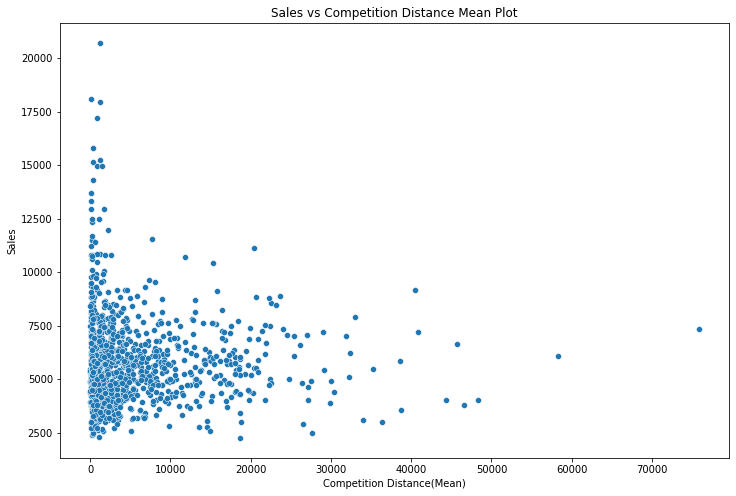

In [30]:
plt.figure(figsize=(12,8))
sns.scatterplot(data=group_merged_data, y='Sales', x='CompetitionDistance')
plt.xlabel('Competition Distance(Mean)')
plt.ylabel('Sales')
plt.title('Sales vs Competition Distance Mean Plot')
plt.show()

##### From the above scatter plot we could see that as the competitor distance are low the sales are high for some of the data point.
##### However overall we could not find any strong trend on Competitor Distance vs Sales

## Scatter Plot for Promo2 vs Sales

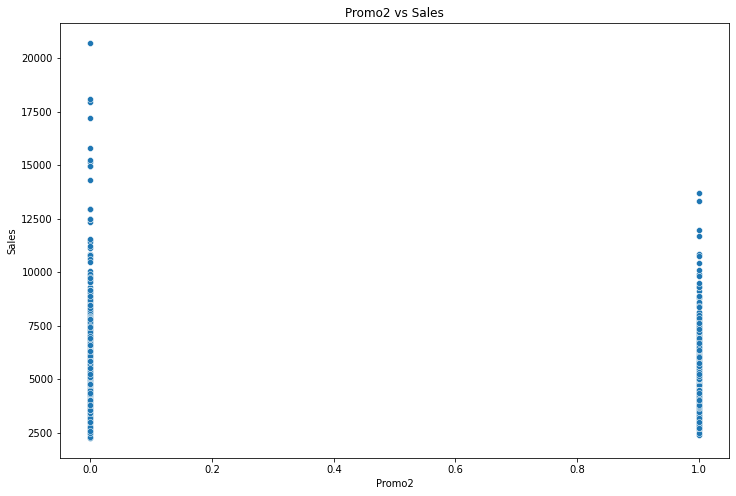

In [31]:
plt.figure(figsize=(12,8))
sns.scatterplot(data=group_merged_data, x='Promo2', y='Sales')
plt.xlabel('Promo2')
plt.ylabel('Sales')
plt.title('Promo2 vs Sales')
plt.show()

### We could see from the above plot that even without the Promo2 the sales is higher

## Now we will take the time series data and check the spread of Sales on all store

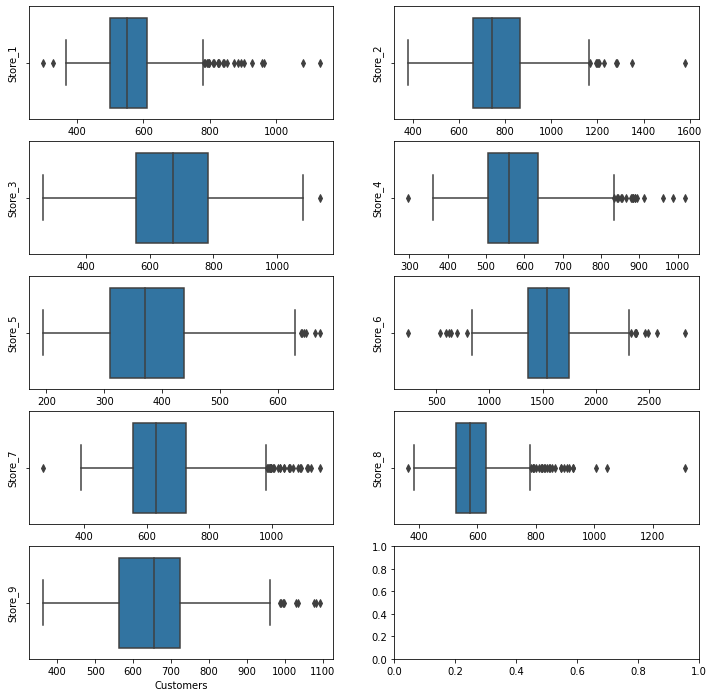

In [32]:
fig, axs = plt.subplots(figsize=(12, 12),nrows=5,ncols=2)
for i in range(9):
  axs[np.floor(i/2).astype('int')][i%2].set_ylabel("Store_"+str(i+1))
  sns.boxplot(x=store_time_df[i]['Customers'],whis=1.5, ax= axs[np.floor(i/2).astype('int')][i%2] )
plt.show()

## Now we will find the data that have Sales value above 99% and then replace them with the 99%ile value.

In [33]:
for i in range(9):
  store_time_df[i].loc[store_time_df[i]['Sales'] > store_time_df[i]['Sales'].quantile(0.99),'Sales']= store_time_df[i]['Sales'].quantile(0.99)

## Now we will plot the series of all the stores

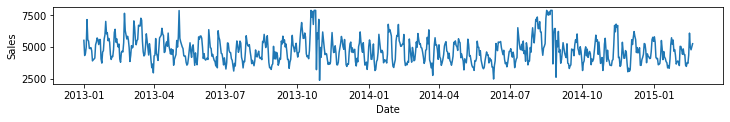

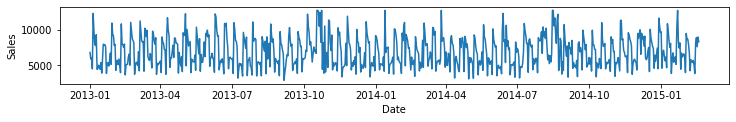

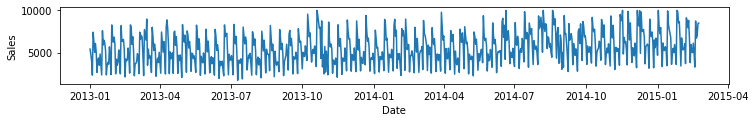

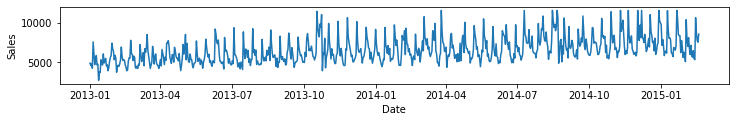

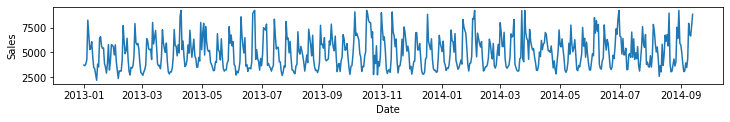

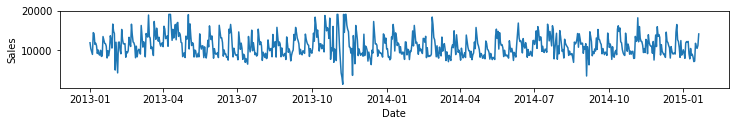

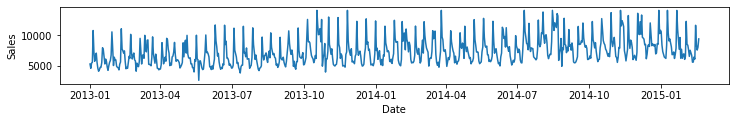

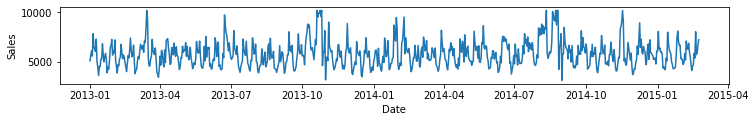

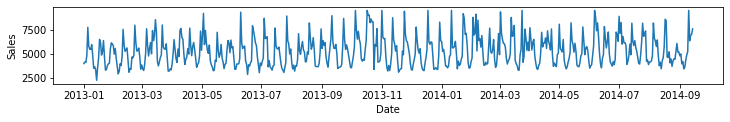

In [34]:
for i in range(9):
  plt.figure(figsize=(12,15))
  plt.subplot(9,1,i+1)
  plt.plot(store_time_df[i]['Sales'])
  plt.xlabel("Date")
  plt.ylabel("Sales")
  plt.show()

### From the above plots we could not find any kind of trend in any of the stores

# Now we will define utility function for train-test plot and grangers_casuality_matrix

In [35]:
def train_test_plot(y_hat, plot_name):
    plt.figure(figsize=(20,4))
    plt.plot(train['Sales'], label = 'train')
    plt.plot(test['Sales'], label = 'test')
    plt.plot(y_hat, label = 'forecast')
    plt.legend(loc = 'best')
    plt.title(plot_name)
    plt.show()

In [36]:
def grangers_causality_matrix(X_train, variables,maxlag = 12, test = 'ssr_chi2test', verbose=False):
  dataset = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
  for c in dataset.columns:
    for r in dataset.index:
      test_result = grangercausalitytests(X_train[[r,c]], maxlag=maxlag, verbose=False)
      p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
      if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
      min_p_value = np.min(p_values)
      dataset.loc[r,c] = min_p_value
  dataset.columns = [var + '_x' for var in variables]
  dataset.index = [var + '_y' for var in variables]
  return dataset

## Next we will initialise result dataframe which will store the results of all the models and will help us to compare different models

In [37]:
results = pd.DataFrame({'Method':[], 'MAPE': [], 'RMSE': []})
results

,Method,MAPE,RMSE


# Now we will move ahead and start doing Exploratory Data Analysis, Model Building and Forecasting of the Stores one by one as we have our data for each and every stores stored in store_df list

In [38]:
## First of all we will create a dictionary from the store df such that when we get the store dataframe from the dictionary
store_df_dictionary={}
for i in range(1,len(store_df)+1):
  store_df_dictionary['Store '+str(i)]=store_df[i-1]

store_time_df_dictionary={}
for i in range(1,len(store_time_df)+1):
  store_time_df_dictionary['Store '+str(i)]=store_time_df[i-1]

## Forecasting of Store 1

### EDA: Store 1

In [39]:
df_store_1 = store_df_dictionary.get('Store 1')
df_time_series_store_1 = store_time_df_dictionary.get('Store 1')

<Figure size 1440x288 with 0 Axes>

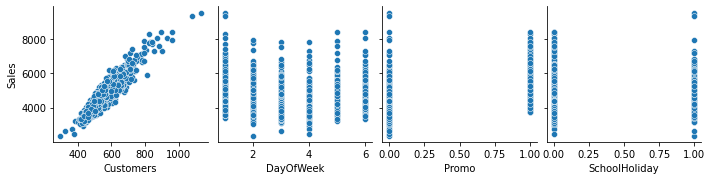

In [40]:
### Analysing the relations between sales and other numerical variables
plt.figure(figsize= [20,4])
sns.pairplot(data = df_store_1, x_vars= ['Customers','DayOfWeek', 'Promo', 'SchoolHoliday'],y_vars = ["Sales"])
plt.show()

We could observe the following from the above plots:<br>
a) Customers and Sales are highly correlated <br>
b) Sales are higher on weekend that that on wekdays

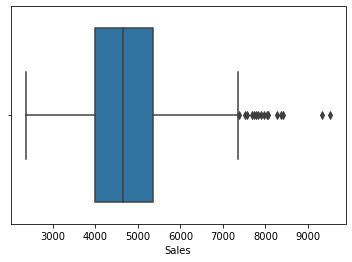

In [41]:
## Spread of Sales using box plot
sns.boxplot(df_store_1['Sales'])
plt.show()

#### From the above boxplot we could see that there are some outliers for Sales greater than 7200. And the IQR lies between 4000-5500

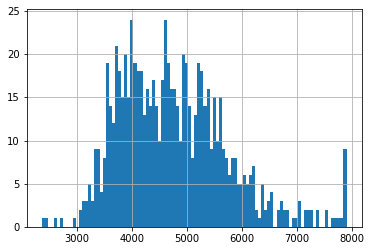

In [42]:
## Dstribution of the Sales
df_time_series_store_1['Sales'].hist(bins= 100)
plt.show()

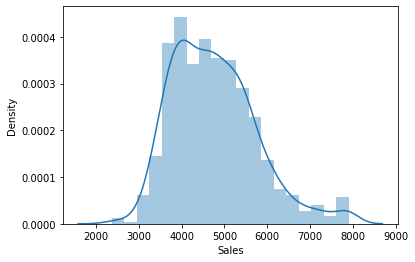

In [43]:
sns.distplot(df_time_series_store_1['Sales'])
plt.show()

#### From the above distribution plot we could see that most of the Sales value for Store 1 lies between 3000-6000 and are peaked at 4000-4500

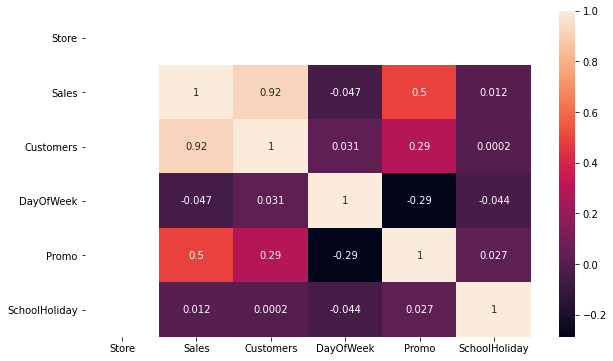

In [44]:
## Analyse correlation using heatmap
plt.figure(figsize=(10,6))
sns.heatmap(df_time_series_store_1.corr(),annot=True)
plt.show()

Using the heatmap to find out the correlation between the features we were able to find out that:<br>
a) Customers and Sales have a very high correlation.<br>
b) The next higher correlation was found between Promo and Sales

#### Decomposition of Time Series: Now our next step in the analysis is decomposition of time series for Store 1

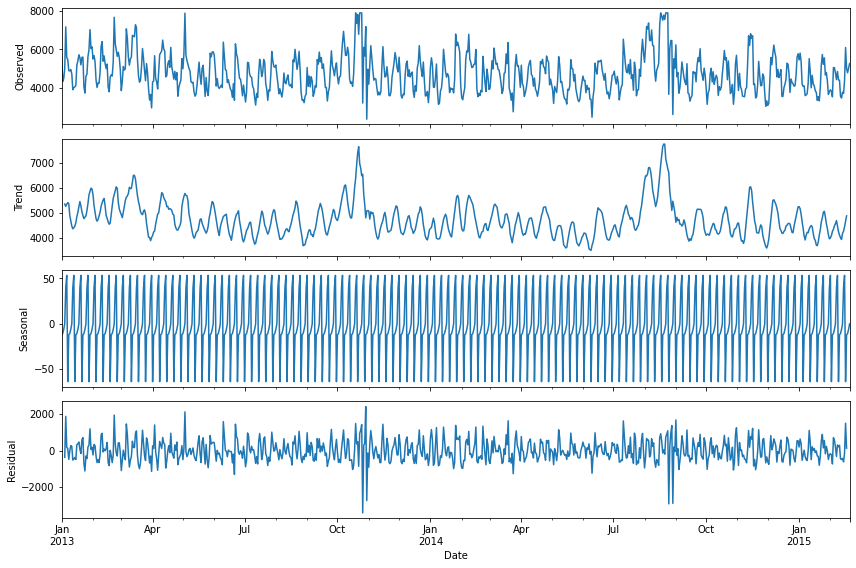

In [45]:
rcParams['figure.figsize']  =12,8
decomposition = sm.tsa.seasonal_decompose(df_time_series_store_1['Sales'],model = 'additive')
fig = decomposition.plot()
plt.show()

### Data Preparation and Train Test Split

In [46]:
print('The data available is for',round(len(df_time_series_store_1)/7,3),'weeks')

The data available is for 111.571 weeks


### Since the data is available for around 111.571 weeks. We would be taking around 6 weeks data that is last 42 days of data as test data and the rest as train data

In [47]:
train = df_time_series_store_1[['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42]
test = df_time_series_store_1[['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:]

In [48]:
print('The length of the train data for Store 1 is',len(train),'and the lenght of the test data for Store 1 is', len(test))

The length of the train data for Store 1 is 739 and the lenght of the test data for Store 1 is 42


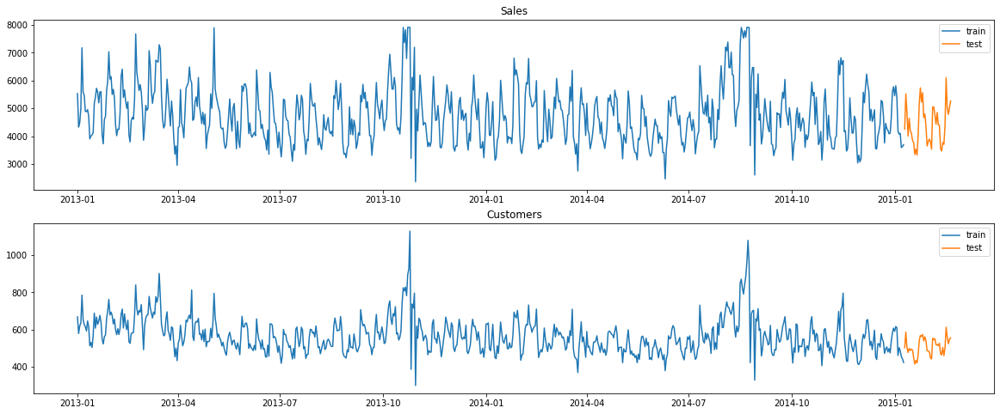

In [49]:
plt.figure(figsize = (20,8))
plt.subplot(211)
plt.plot(train['Sales'],label = 'train')
plt.plot(test['Sales'], label = 'test')
plt.title('Sales')
plt.legend(loc = 'best')

plt.subplot(212)
plt.plot(train['Customers'],label = 'train')
plt.plot(test['Customers'],label = 'test')
plt.title('Customers')
plt.legend(loc = 'best')
plt.show()

### Standardize the data using box cox transformation: Now we will standardize the training data using boxcox transformation

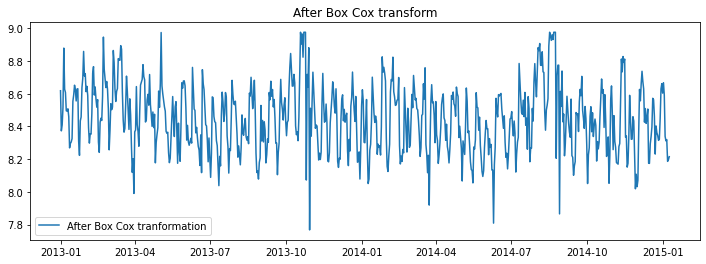

In [50]:
train_boxcox = pd.DataFrame(boxcox(train['Sales'], lmbda=0), index = train.index, columns=['Sales'])
train_boxcox['Customers'] =  pd.Series(boxcox(train['Customers'], lmbda=0), index = train.index)

# plotting Sales after boxcox transformation
plt.figure(figsize=(12,4))
plt.plot(train_boxcox['Sales'], label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

### Check for Stationarity using AD Fuller Test and KPSS test: 
Now we will check the stationarity of the data using Augmented Dicky Fuller test(AD Fuller Test) and Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [51]:
adf_test = adfuller(train['Sales'])

#Sales
print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])


ADF Test for SALES
ADF Statistics: -5.323
Critical value @ 0.05: -2.87
p-value: 0.000005


ADF Test for CUSTOMERS
ADF Statistics: -4.239
Critical value @ 0.05: -2.87
p-value: 0.000566


In [52]:
kpss_test = kpss(train['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 0.197588
Critical Values @ 0.05: 0.46
p-value: 0.100000


KPSS test for Customers
KPSS Statistic: 0.441874
Critical Values @ 0.05: 0.46
p-value: 0.059106


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1711: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)


* From the ADF Test and KPSS Test results we could see that the training data set is stationary



### Modeling for Store 1

>  AutoCorrelation function

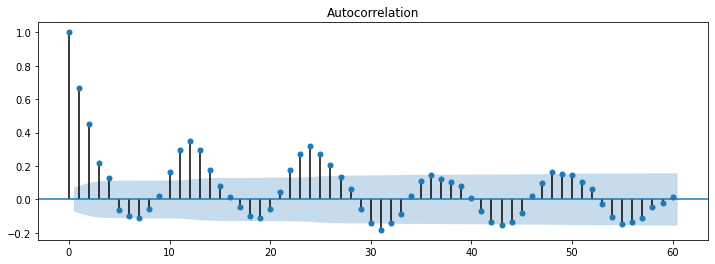

In [53]:
plt.figure(figsize=(12,4))
plot_acf(train_boxcox['Sales'], ax=plt.gca(), lags = 60)
plt.show()

>  Partial AutoCorrelation function

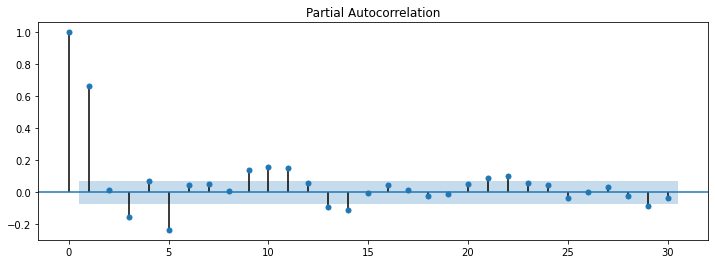

In [54]:
plt.figure(figsize=(12,4))
plot_pacf(train_boxcox['Sales'], ax=plt.gca(), lags = 30)
plt.show()

> **1. ARIMA MODEL**

In [55]:
model = ARIMA(train_boxcox['Sales'], order=(5, 0, 4))
model_fit = model.fit()
print(model_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  739
Model:                     ARMA(5, 4)   Log Likelihood                 392.157
Method:                       css-mle   S.D. of innovations              0.142
Date:                Mon, 19 Jul 2021   AIC                           -762.314
Time:                        06:45:31   BIC                           -711.656
Sample:                    01-01-2013   HQIC                          -742.781
                         - 01-09-2015                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           8.4498      0.013    643.656      0.000       8.424       8.476
ar.L1.Sales     1.0561      0.114      9.302      0.000       0.834       1.279
ar.L2.Sales     0.4142      0.198      2.088    

###### Recover the original time series

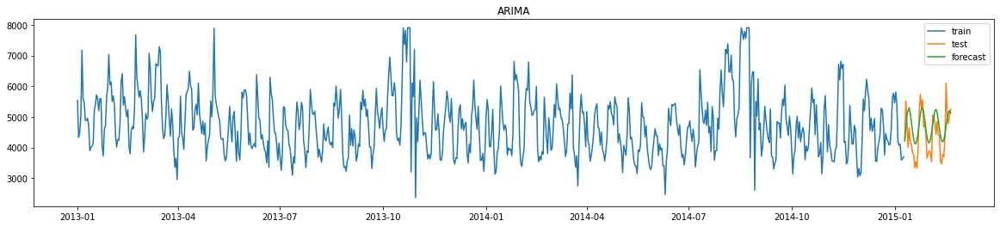

In [56]:
y_hat_ar = df_time_series_store_1['Sales'].copy()
y_hat_ar['ar_forecast_boxcox'] = model_fit.predict(start = test.index.min(), end = test.index.max())
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

train_test_plot(y_hat_ar['ar_forecast'],"ARIMA")

> Calculate RMSE and MAPE for ARIMA

In [57]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_ar['ar_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_ar['ar_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_1_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71




> Check for Granger Casuality Test



In [58]:
grangers_causality_matrix(train,variables = train.columns)

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints d

,Sales_x,Customers_x,DayOfWeek_x,Promo_x,SchoolHoliday_x,StateHoliday_x
Sales_y,1.0000,0.0000,0.0000,0.00,0.0005,1.0
Customers_y,0.0000,1.0000,0.0000,0.00,0.0001,1.0
DayOfWeek_y,0.0000,0.0000,1.0000,0.00,0.0000,1.0
Promo_y,0.0000,0.0000,0.0000,1.00,0.0011,1.0
SchoolHoliday_y,0.0043,0.0036,0.0001,0.02,1.0000,1.0
StateHoliday_y,NaN,NaN,NaN,NaN,NaN,NaN


> **2. VAR MODEL**

In [59]:
mod = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']], order=(1,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  739
Model:                             VAR(1)   Log Likelihood                1400.071
Date:                    Mon, 19 Jul 2021   AIC                          -2786.142
Time:                            06:45:36   BIC                          -2753.905
Sample:                        01-01-2013   HQIC                         -2773.712
                             - 01-09-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              243.84, 177.13   Jarque-Bera (JB):       1403.15, 73.67
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.36, 1.17   Skew:                      -0.46, 0.07
Prob(H) (two-sided):            0.02, 0.21   Kurtosis:                   9.69, 4.54


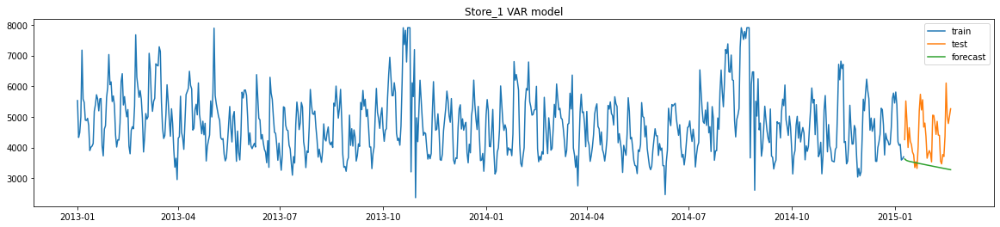

In [60]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_var = mod.fit().predict(start=start_index, end=end_index)
y_hat_var = np.exp(y_hat_var)
train_test_plot(y_hat_var['Sales'],"Store_1 VAR model")

> Calculate RMSE and MAPE for VAR

In [61]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'])).round(2)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_var['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_1_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40


#### Johansen Cointegration Test: Now we will perform Johansen Cointegration Test to check the Cointegration between the variables

In [62]:
coint=coint_johansen(np.asarray(train_boxcox[['Sales','Customers']]),0,1)
traces = coint.lr1
maxeig=coint.lr2
cvts = coint.cvt  ## 0: 90%  1:95% 2: 99%
cvms = coint.cvm   ## 0: 90%  1:95% 2: 99%

N, l = np.asarray(train[['Sales','Customers']]).shape

for i in range(l):
    if traces[i] > cvts[i, 1]:
        rank= i + 1
print(rank)

2


Since the rank is 2 we could say that there is no cointegration between the variables and the series are stationary

> **3. VARMAX MODEL**

#### While modeling using the VARMAX Model we would be using School Holiday as the exegenous variable

In [63]:
exog = train['SchoolHoliday']
mod_varmax = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']],exog= exog, order=(4,0), trend='c')
resmax = mod_varmax.fit(maxiter=1000, disp=False)
print(resmax.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  739
Model:                            VARX(4)   Log Likelihood                1543.082
                              + intercept   AIC                          -3040.164
Date:                    Mon, 19 Jul 2021   BIC                          -2934.242
Time:                            06:45:44   HQIC                         -2999.322
Sample:                        01-01-2013                                         
                             - 01-09-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               170.92, 57.77   Jarque-Bera (JB):       313.54, 149.69
Prob(Q):                        0.00, 0.03   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.26, 1.35   Skew:                      -0.32, 0.05
P

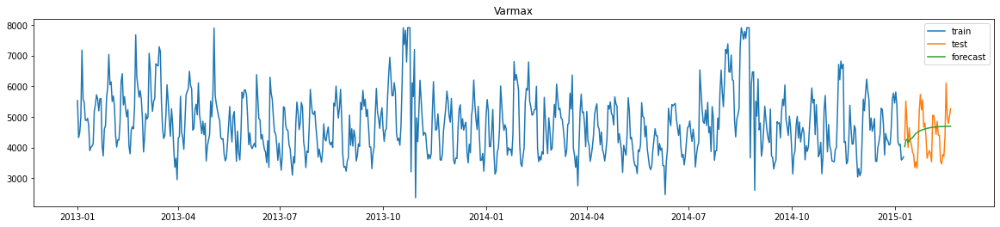

In [64]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)
train_test_plot(y_hat_varmax['Sales'],"Varmax")

> Calculate RMSE and MAPE for VARMAX

In [65]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'])).round(2)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_varmax['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_1_VARMAX_SchoolHoliday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53


#### Now we will plot the inverse function

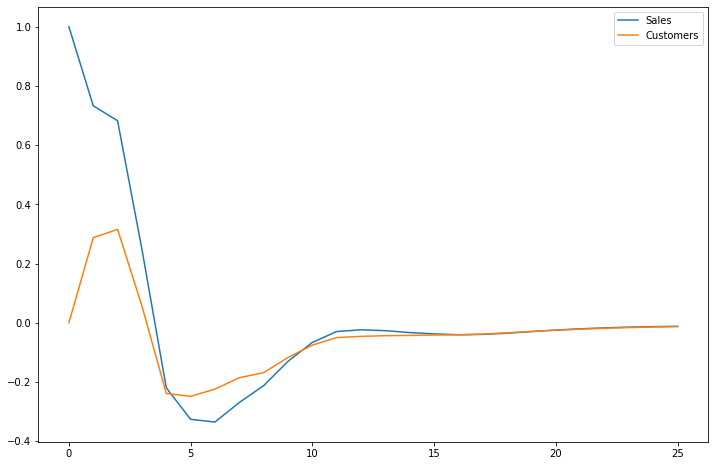

In [66]:
irf = resmax.impulse_responses(steps = 25, orthogonalized= False)
irf.plot()

## Forecasting of Store 3

### EDA: Store 3

In [67]:
df_store_3 = store_df_dictionary.get('Store 2')
df_time_series_store_3 = store_time_df_dictionary.get('Store 2')

<Figure size 1440x288 with 0 Axes>

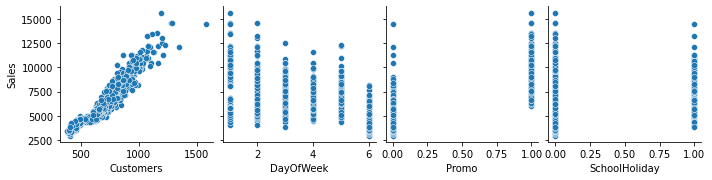

In [68]:
### Analysing the relations between sales and other numerical variables
plt.figure(figsize= (20,4))
sns.pairplot(data = df_store_3, x_vars= ['Customers','DayOfWeek', 'Promo', 'SchoolHoliday'],y_vars = ["Sales"])
plt.show()

We could observe the following from the above plots:<br>
a) Customers and Sales are highly correlated <br>
b) Sales are higher on weekdays than that on weekends<br>
c) Sales are higher when promo is applied

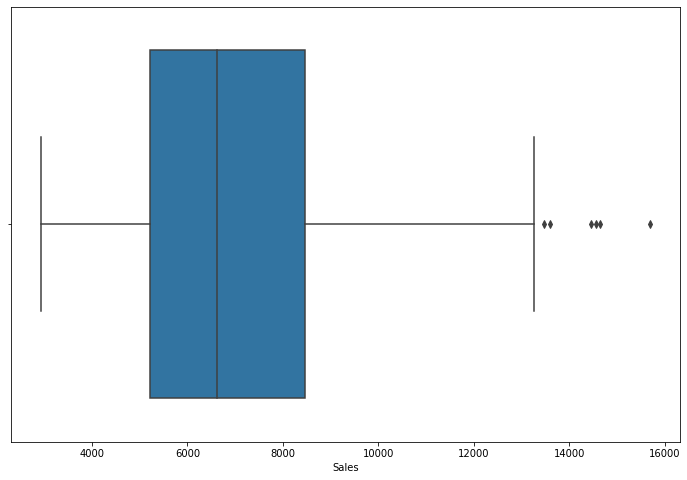

In [69]:
## Spread of Sales using box plot
sns.boxplot(df_store_3['Sales'])
plt.show()

#### From the above boxplot we could see that there are some outliers for Sales greater than 13000. And the IQR lies between 5000-8500

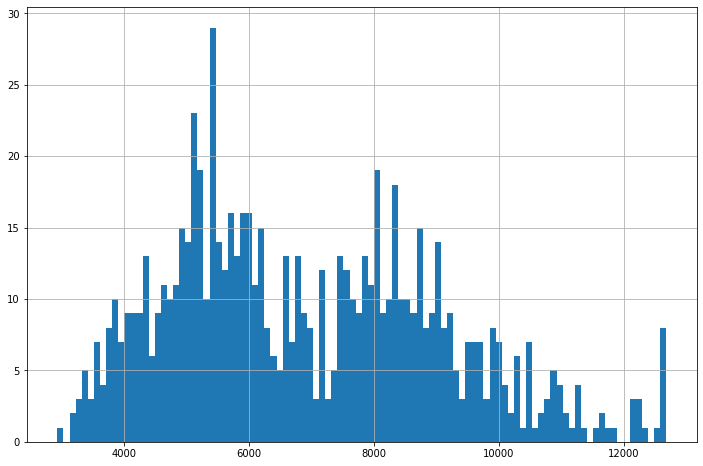

In [70]:
## Dstribution of the Sales
df_time_series_store_3['Sales'].hist(bins= 100)
plt.show()

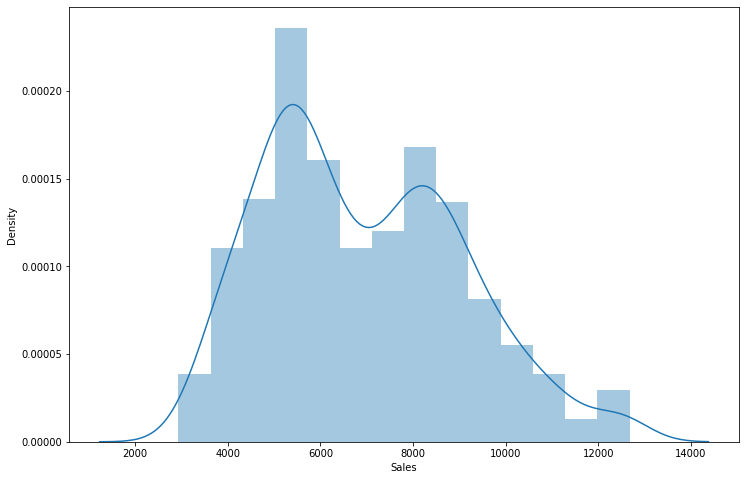

In [71]:
sns.distplot(df_time_series_store_3['Sales'])
plt.show()

#### From the above distribution plot we could see that most of the Sales value for Store 1 lies between 4000-10000 and are peaked at 5000 and 8000

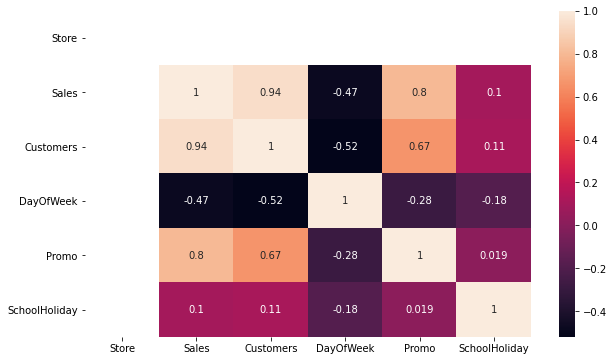

In [72]:
## Analyse correlation using heatmap
plt.figure(figsize=(10,6))
sns.heatmap(df_time_series_store_3.corr(),annot=True)
plt.show()

Using the heatmap to find out the correlation between the features we were able to find out that:<br>
a) Customers and Sales have a very high correlation.<br>
b) Promo and Sales also have a very high correlation

#### Decomposition of Time Series: Now our next step in the analysis is decomposition of time series for Store 3

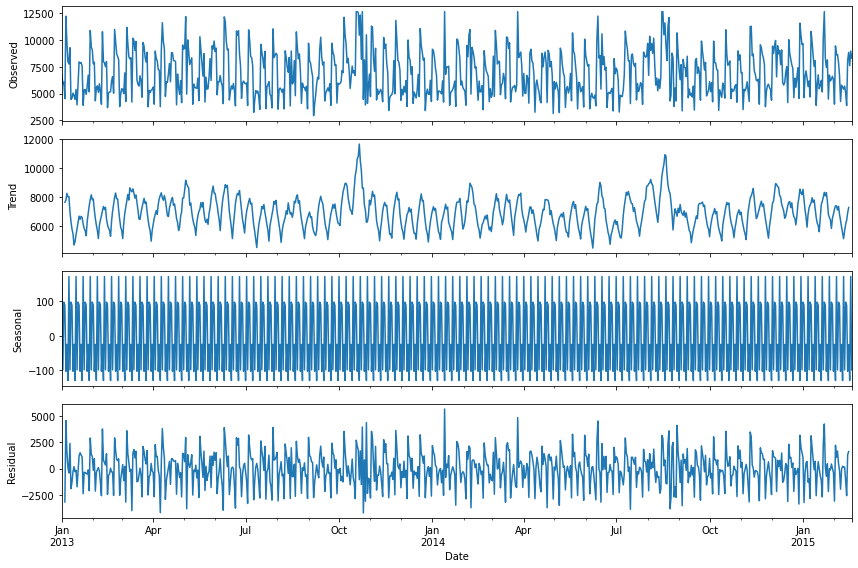

In [73]:
rcParams['figure.figsize']  =12,8
decomposition = sm.tsa.seasonal_decompose(df_time_series_store_3['Sales'],model = 'additive')
fig = decomposition.plot()
plt.show()

### Data Preparation and Train Test Split

In [74]:
print('The data available is for',round(len(df_time_series_store_3)/7,3),'weeks')

The data available is for 111.286 weeks


### Since the data is available for around 111.286 weeks. We would be taking around 6 weeks data that is last 42 days of data as test data and the rest as train data

In [75]:
train = df_time_series_store_3[['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42]
test = df_time_series_store_3[['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:]

In [76]:
print('The length of the train data for Store 3 is',len(train),'and the lenght of the test data for Store 3 is', len(test))

The length of the train data for Store 3 is 737 and the lenght of the test data for Store 3 is 42


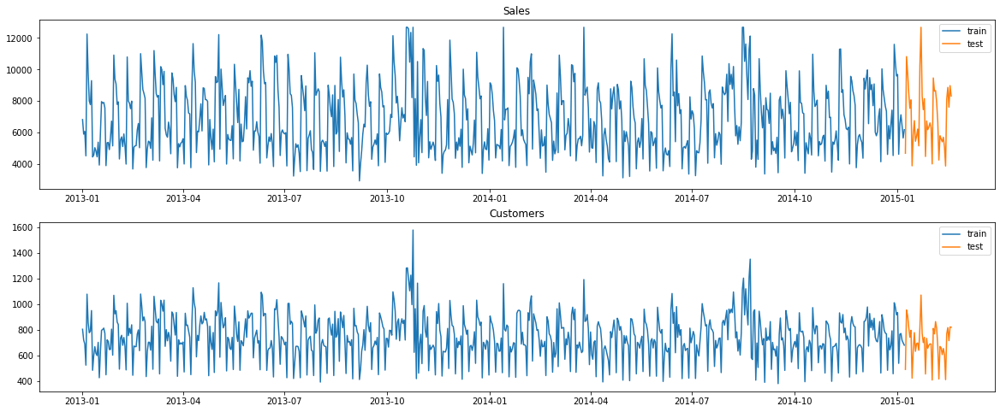

In [77]:
plt.figure(figsize = (20,8))
plt.subplot(211)
plt.plot(train['Sales'],label = 'train')
plt.plot(test['Sales'], label = 'test')
plt.title('Sales')
plt.legend(loc = 'best')

plt.subplot(212)
plt.plot(train['Customers'],label = 'train')
plt.plot(test['Customers'],label = 'test')
plt.title('Customers')
plt.legend(loc = 'best')
plt.show()

### Standardize the data using box cox transformation: Now we will standardize the training data using boxcox transformation

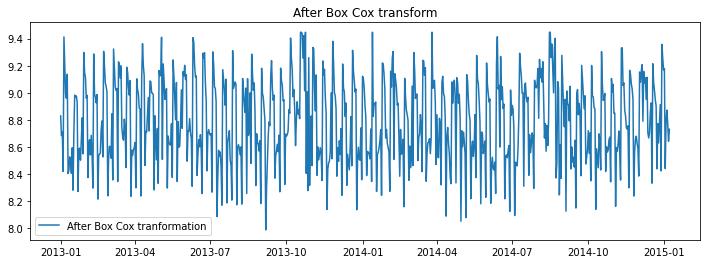

In [78]:
train_boxcox = pd.DataFrame(boxcox(train['Sales'], lmbda=0), index = train.index, columns=['Sales'])
train_boxcox['Customers'] =  pd.Series(boxcox(train['Customers'], lmbda=0), index = train.index)

# plotting Sales after boxcox transformation
plt.figure(figsize=(12,4))
plt.plot(train_boxcox['Sales'], label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

### Check for Stationarity using AD Fuller Test and KPSS test: 
Now we will check the stationarity of the data using Augmented Dicky Fuller test(AD Fuller Test) and Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [79]:
adf_test = adfuller(train['Sales'])

#Sales
print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Test for SALES
ADF Statistics: -6.382
Critical value @ 0.05: -2.87
p-value: 0.000000


ADF Test for CUSTOMERS
ADF Statistics: -5.651
Critical value @ 0.05: -2.87
p-value: 0.000001


In [80]:
kpss_test = kpss(train['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 0.049617
Critical Values @ 0.05: 0.46
p-value: 0.100000


KPSS test for Customers
KPSS Statistic: 0.148557
Critical Values @ 0.05: 0.46
p-value: 0.100000


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1711: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1711: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)


* From the ADF Test and KPSS Test results we could see that the training data set is stationary



### Modeling for Store 3

>  AutoCorrelation function

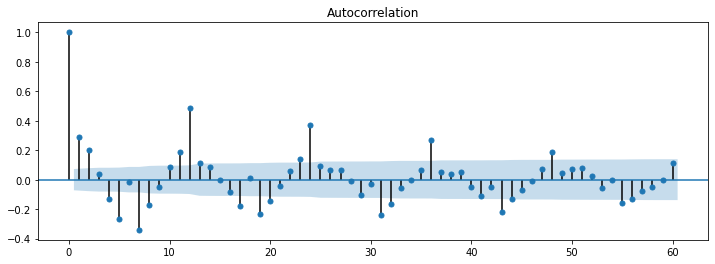

In [81]:
plt.figure(figsize=(12,4))
plot_acf(train_boxcox['Sales'], ax=plt.gca(), lags = 60)
plt.show()

>  Partial AutoCorrelation function

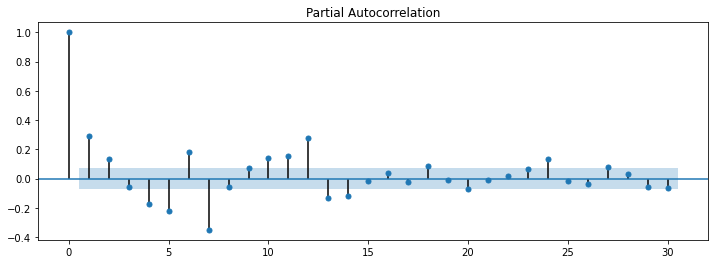

In [82]:
plt.figure(figsize=(12,4))
plot_pacf(train_boxcox['Sales'], ax=plt.gca(), lags = 30)
plt.show()

> **1. ARIMA MODEL**

In [83]:
model = ARIMA(train_boxcox['Sales'], order=(5, 0, 4))
model_fit = model.fit()
print(model_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  737
Model:                     ARMA(5, 4)   Log Likelihood                 -61.402
Method:                       css-mle   S.D. of innovations              0.263
Date:                Mon, 19 Jul 2021   AIC                            144.803
Time:                        06:45:51   BIC                            195.432
Sample:                    01-01-2013   HQIC                           164.327
                         - 01-07-2015                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           8.7935      0.011    799.757      0.000       8.772       8.815
ar.L1.Sales    -0.6044      0.058    -10.421      0.000      -0.718      -0.491
ar.L2.Sales     0.1482      0.078      1.891    

###### Recover the original time series

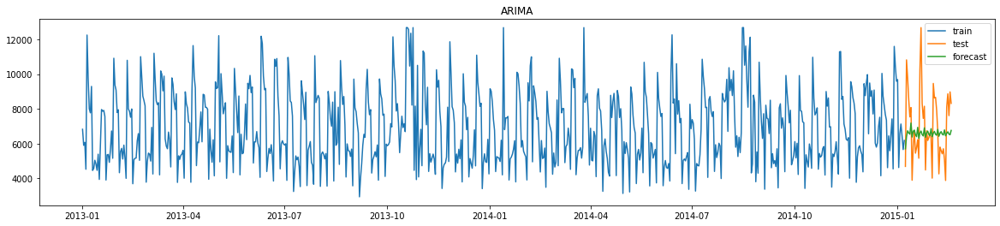

In [84]:
y_hat_ar = df_time_series_store_3['Sales'].copy()
y_hat_ar['ar_forecast_boxcox'] = model_fit.predict(start = test.index.min(), end = test.index.max())
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

train_test_plot(y_hat_ar['ar_forecast'],"ARIMA")

> Calculate RMSE and MAPE for ARIMA

In [85]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_ar['ar_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_ar['ar_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_3_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32




> Check for Granger Casuality Test



In [86]:
grangers_causality_matrix(train,variables = train.columns)

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints d

,Sales_x,Customers_x,DayOfWeek_x,Promo_x,SchoolHoliday_x,StateHoliday_x
Sales_y,1.0,0.0,0.0,0.0,0.0,1.0
Customers_y,0.0,1.0,0.0,0.0,0.0,1.0
DayOfWeek_y,0.0,0.0,1.0,0.0,0.0,1.0
Promo_y,0.0,0.0,0.0,1.0,0.0,1.0
SchoolHoliday_y,0.0,0.0,0.0,0.0,1.0,1.0
StateHoliday_y,NaN,NaN,NaN,NaN,NaN,NaN


> **2. VAR MODEL**

In [87]:
mod = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']], order=(3,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  737
Model:                             VAR(3)   Log Likelihood                 791.789
Date:                    Mon, 19 Jul 2021   AIC                          -1553.579
Time:                            06:45:59   BIC                          -1484.540
Sample:                        01-01-2013   HQIC                         -1526.955
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              647.09, 153.07   Jarque-Bera (JB):          32.43, 1.86
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.39
Heteroskedasticity (H):         0.86, 1.14   Skew:                     -0.46, -0.09
Prob(H) (two-sided):            0.25, 0.30   Kurtosis:                   3.47, 3.16


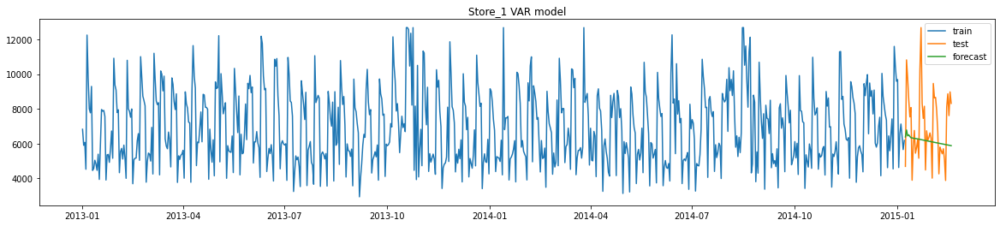

In [88]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_var = mod.fit().predict(start=start_index, end=end_index)
y_hat_var = np.exp(y_hat_var)
train_test_plot(y_hat_var['Sales'],"Store_1 VAR model")

> Calculate RMSE and MAPE for VAR

In [89]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'])).round(2)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_var['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_3_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31


#### Johansen Cointegration Test: Now we will perform Johansen Cointegration Test to check the Cointegration between the variables

In [90]:
coint=coint_johansen(np.asarray(train_boxcox[['Sales','Customers']]),0,1)
traces = coint.lr1
maxeig=coint.lr2
cvts = coint.cvt  ## 0: 90%  1:95% 2: 99%
cvms = coint.cvm   ## 0: 90%  1:95% 2: 99%

N, l = np.asarray(train[['Sales','Customers']]).shape

for i in range(l):
    if traces[i] > cvts[i, 1]:
        rank= i + 1
print(rank)

2


Since the rank is 2 we could say that there is no cointegration between the variables and the series are stationary

> **3. VARMAX MODEL**

#### While modeling using the VARMAX Model we would be using School Holiday as the exegenous variable

In [91]:
exog = train['SchoolHoliday']
mod_varmax = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']],exog= exog, order=(5,3), trend='c')
resmax = mod_varmax.fit(maxiter=1000, disp=False)
print(resmax.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  737
Model:                        VARMAX(5,3)   Log Likelihood                1019.162
                              + intercept   AIC                          -1960.324
Date:                    Mon, 19 Jul 2021   BIC                          -1780.823
Time:                            06:47:41   HQIC                         -1891.102
Sample:                        01-01-2013                                         
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              365.20, 100.83   Jarque-Bera (JB):         10.83, 21.62
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.91, 1.24   Skew:                     -0.29, -0.24
P

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


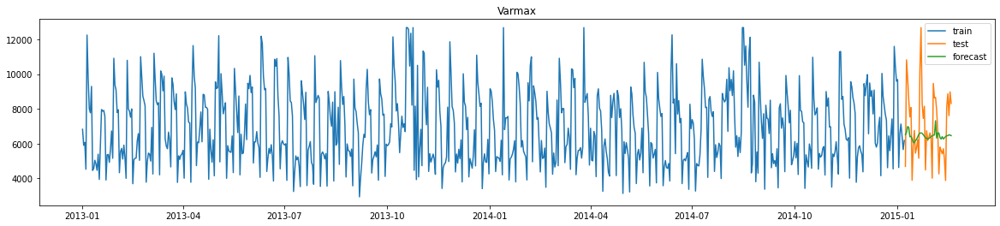

In [92]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)
train_test_plot(y_hat_varmax['Sales'],"Varmax")

> Calculate RMSE and MAPE for VARMAX

In [93]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'])).round(2)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_varmax['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_3_VARMAX_SchoolHoliday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16


#### Now we will plot the Inverse Response Function

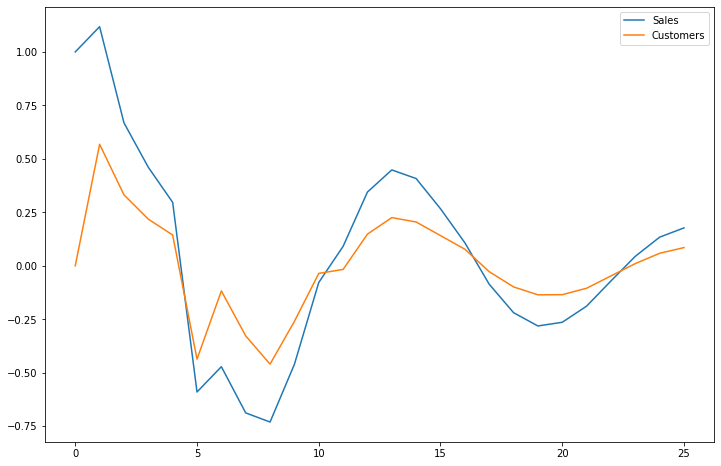

In [94]:
irf = resmax.impulse_responses(steps = 25, orthogonalized= False)
irf.plot()

## Forecasting of Store 8

### EDA: Store 8

In [95]:
df_store_8 = store_df_dictionary.get('Store 3')
df_time_series_store_8 = store_time_df_dictionary.get('Store 3')

<Figure size 1440x288 with 0 Axes>

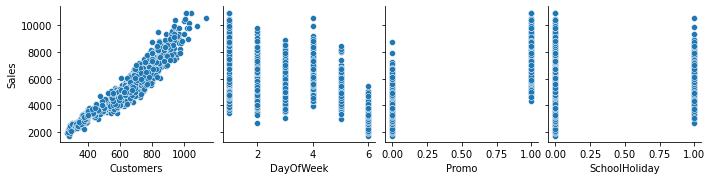

In [96]:
### Analysing the relations between sales and other numerical variables
plt.figure(figsize= (20,4))
sns.pairplot(data = df_store_8, x_vars= ['Customers','DayOfWeek', 'Promo', 'SchoolHoliday'],y_vars = ["Sales"])
plt.show()

We could observe the following from the above plots:<br>
a) Customers and Sales are highly correlated <br>
b) Sales are higher when promo is applied

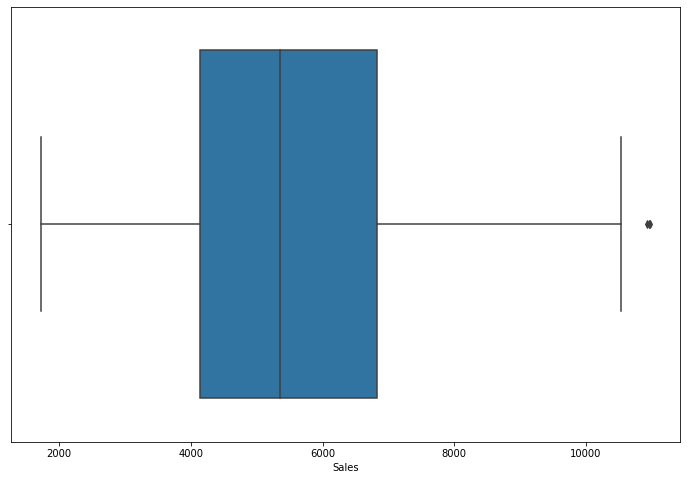

In [97]:
## Spread of Sales using box plot
sns.boxplot(df_store_8['Sales'])
plt.show()

#### From the above boxplot we could see that there are very few outliers for Sales greater than 10000. And the IQR lies between 4100-6900

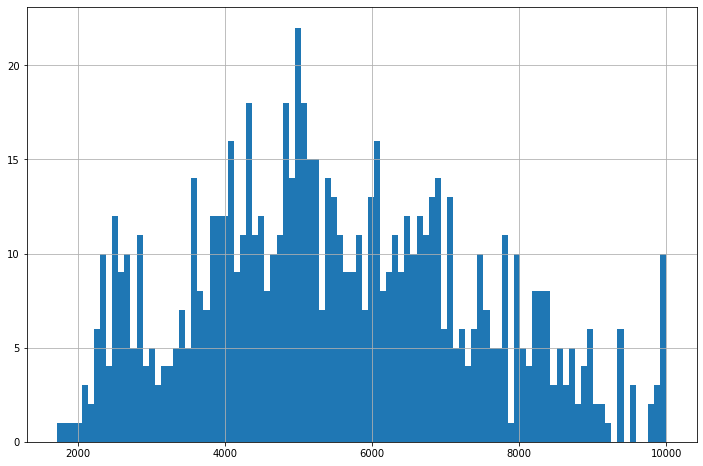

In [98]:
## Dstribution of the Sales
df_time_series_store_8['Sales'].hist(bins= 100)
plt.show()

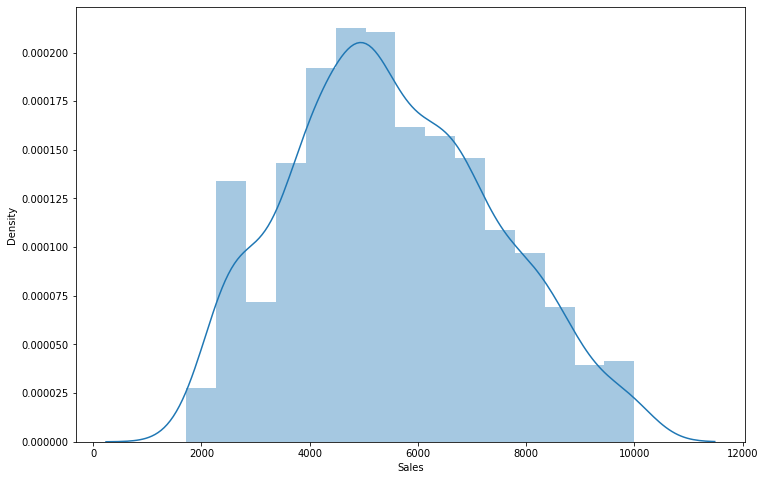

In [99]:
sns.distplot(df_time_series_store_8['Sales'])
plt.show()

#### From the above distribution plot we could see that most of the Sales value for Store 1 lies between 4000-10000 and are peaked at around 5000.<br>Also we could observe a almost Gaussian Distribution of the Sales

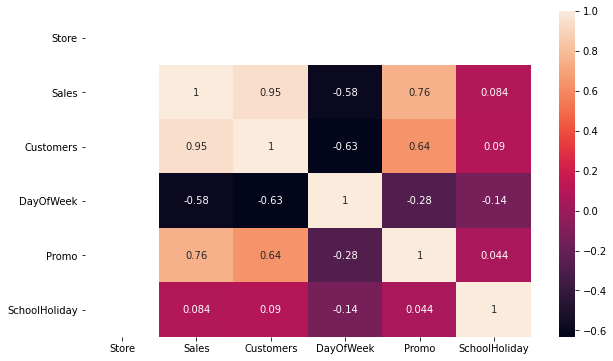

In [100]:
## Analyse correlation using heatmap
plt.figure(figsize=(10,6))
sns.heatmap(df_time_series_store_8.corr(),annot=True)
plt.show()

Using the heatmap to find out the correlation between the features we were able to find out that:<br>
a) Customers and Sales have a very high correlation.<br>
b) Promo and Sales also have a very high correlation

#### Decomposition of Time Series: Now our next step in the analysis is decomposition of time series for Store 3

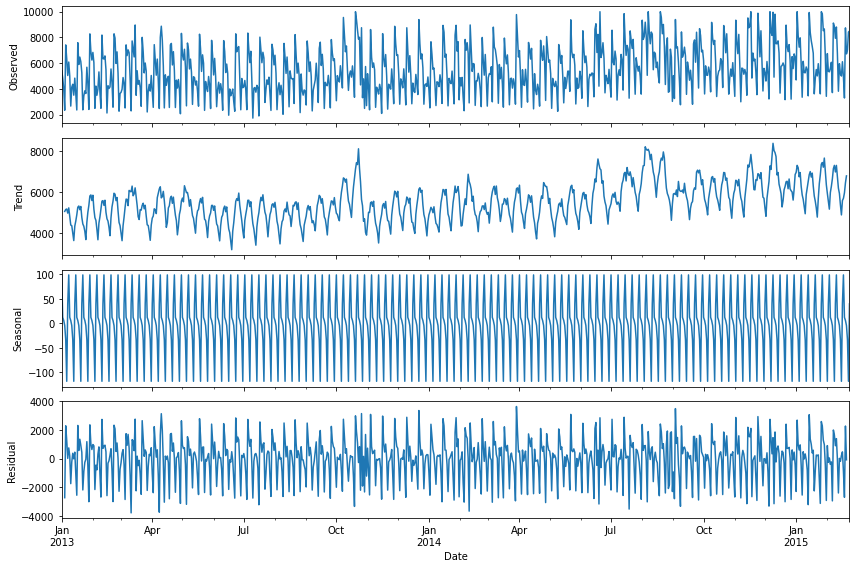

In [101]:
rcParams['figure.figsize']  =12,8
decomposition = sm.tsa.seasonal_decompose(df_time_series_store_8['Sales'],model = 'additive')
fig = decomposition.plot()
plt.show()

### Data Preparation and Train Test Split

In [102]:
print('The data available is for',round(len(df_time_series_store_8)/7,3),'weeks')

The data available is for 112.0 weeks


### Since the data is available for around 112 weeks. We would be taking around 6 weeks data that is last 42 days of data as test data and the rest as train data

In [103]:
train = df_time_series_store_8[['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42]
test = df_time_series_store_8[['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:]

In [104]:
print('The length of the train data for Store 8 is',len(train),'and the lenght of the test data for Store 8 is', len(test))

The length of the train data for Store 8 is 742 and the lenght of the test data for Store 8 is 42


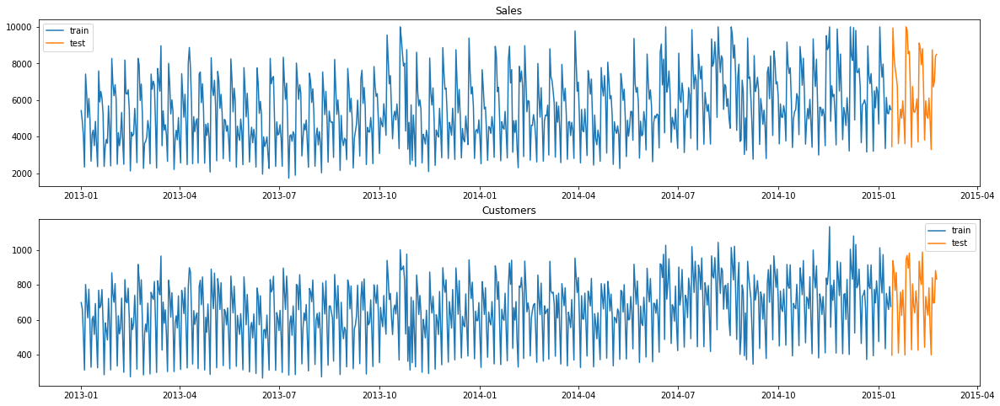

In [105]:
plt.figure(figsize = (20,8))
plt.subplot(211)
plt.plot(train['Sales'],label = 'train')
plt.plot(test['Sales'], label = 'test')
plt.title('Sales')
plt.legend(loc = 'best')

plt.subplot(212)
plt.plot(train['Customers'],label = 'train')
plt.plot(test['Customers'],label = 'test')
plt.title('Customers')
plt.legend(loc = 'best')
plt.show()

### Standardize the data using box cox transformation: Now we will standardize the training data using boxcox transformation

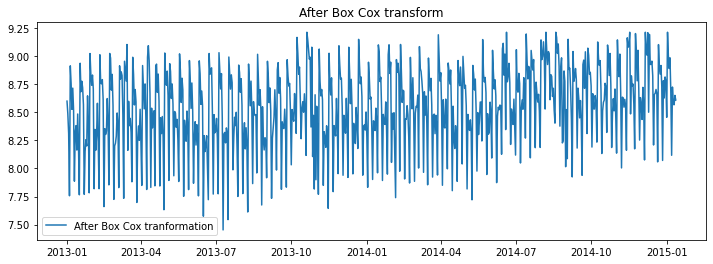

In [106]:
train_boxcox = pd.DataFrame(boxcox(train['Sales'], lmbda=0), index = train.index, columns=['Sales'])
train_boxcox['Customers'] =  pd.Series(boxcox(train['Customers'], lmbda=0), index = train.index)

# plotting Sales after boxcox transformation
plt.figure(figsize=(12,4))
plt.plot(train_boxcox['Sales'], label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

### Check for Stationarity using AD Fuller Test and KPSS test: 
Now we will check the stationarity of the data using Augmented Dicky Fuller test(AD Fuller Test) and Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [107]:
adf_test = adfuller(train['Sales'])

#Sales
print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Test for SALES
ADF Statistics: -3.178
Critical value @ 0.05: -2.87
p-value: 0.021270


ADF Test for CUSTOMERS
ADF Statistics: -2.915
Critical value @ 0.05: -2.87
p-value: 0.043600


In [108]:
kpss_test = kpss(train['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 2.143698
Critical Values @ 0.05: 0.46
p-value: 0.010000


KPSS test for Customers
KPSS Statistic: 2.369524
Critical Values @ 0.05: 0.46
p-value: 0.010000


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1709: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1709: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


* From the ADF Test and KPSS Test results we could see that the training data set is stationary



### Modeling for Store 8

>  AutoCorrelation function

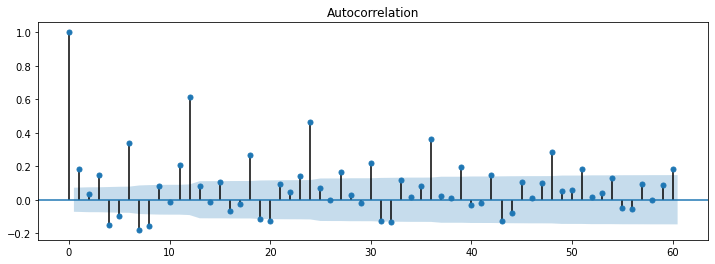

In [109]:
plt.figure(figsize=(12,4))
plot_acf(train_boxcox['Sales'], ax=plt.gca(), lags = 60)
plt.show()

>  Partial AutoCorrelation function

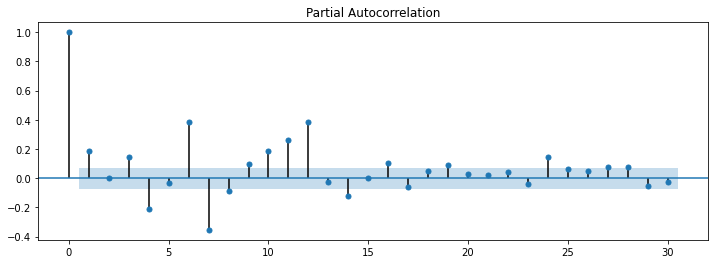

In [110]:
plt.figure(figsize=(12,4))
plot_pacf(train_boxcox['Sales'], ax=plt.gca(), lags = 30)
plt.show()

> **1. ARIMA MODEL**

In [111]:
model = ARIMA(train_boxcox['Sales'], order=(12, 1, 4))
model_fit = model.fit()
print(model_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                             ARIMA Model Results                              
Dep. Variable:                D.Sales   No. Observations:                  741
Model:                ARIMA(12, 1, 4)   Log Likelihood                 -44.039
Method:                       css-mle   S.D. of innovations              0.255
Date:                Mon, 19 Jul 2021   AIC                            124.078
Time:                        06:50:13   BIC                            207.022
Sample:                    01-02-2013   HQIC                           156.056
                         - 01-12-2015                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0004      0.000      2.350      0.019    6.96e-05       0.001
ar.L1.D.Sales      0.2154      0.103      2.090      0.037       0.013       0.417
ar.L2.D.Sales     -0.3656      0.088

###### Recover the original time series

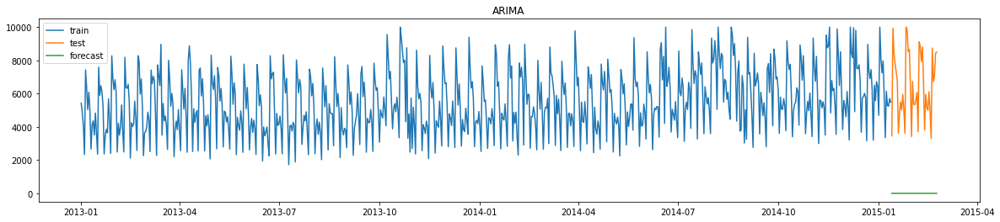

In [112]:
y_hat_ar = df_time_series_store_8['Sales'].copy()
y_hat_ar['ar_forecast_boxcox'] = model_fit.predict(start = test.index.min(), end = test.index.max())
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

train_test_plot(y_hat_ar['ar_forecast'],"ARIMA")

> Calculate RMSE and MAPE for ARIMA

In [113]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_ar['ar_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_ar['ar_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_8_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34




> Check for Granger Casuality Test



In [114]:
grangers_causality_matrix(train,variables = train.columns)

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints d

,Sales_x,Customers_x,DayOfWeek_x,Promo_x,SchoolHoliday_x,StateHoliday_x
Sales_y,1.0000,0.0,0.0,0.000,0.0,1.0
Customers_y,0.0000,1.0,0.0,0.000,0.0,1.0
DayOfWeek_y,0.0000,0.0,1.0,0.000,0.0,1.0
Promo_y,0.0000,0.0,0.0,1.000,0.0,1.0
SchoolHoliday_y,0.0004,0.0,0.0,0.001,1.0,1.0
StateHoliday_y,NaN,NaN,NaN,NaN,NaN,NaN


> **2. VAR MODEL**

In [115]:
mod = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']], order=(3,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                             VAR(3)   Log Likelihood                 616.133
Date:                    Mon, 19 Jul 2021   AIC                          -1202.265
Time:                            06:50:32   BIC                          -1133.125
Sample:                        01-01-2013   HQIC                         -1175.611
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              777.43, 253.98   Jarque-Bera (JB):           7.11, 1.18
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.03, 0.55
Heteroskedasticity (H):         0.64, 0.81   Skew:                      -0.22, 0.09
Prob(H) (two-sided):            0.00, 0.09   Kurtosis:                   3.18, 2.93


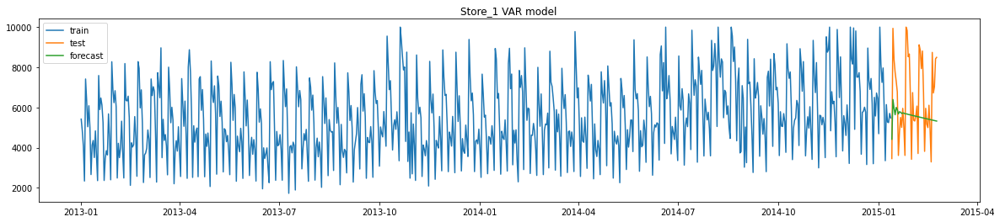

In [116]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_var = mod.fit().predict(start=start_index, end=end_index)
y_hat_var = np.exp(y_hat_var)
train_test_plot(y_hat_var['Sales'],"Store_1 VAR model")

> Calculate RMSE and MAPE for VAR

In [117]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'])).round(2)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_var['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_8_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57


#### Johansen Cointegration Test: Now we will perform Johansen Cointegration Test to check the Cointegration between the variables

In [118]:
coint=coint_johansen(np.asarray(train_boxcox[['Sales','Customers']]),0,1)
traces = coint.lr1
maxeig=coint.lr2
cvts = coint.cvt  ## 0: 90%  1:95% 2: 99%
cvms = coint.cvm   ## 0: 90%  1:95% 2: 99%

N, l = np.asarray(train[['Sales','Customers']]).shape

for i in range(l):
    if traces[i] > cvts[i, 1]:
        rank= i + 1
print(rank)

2


Since the rank is 2 we could say that there is no cointegration between the variables and the series are stationary

> **3. VARMAX MODEL**

#### While modeling using the VARMAX Model we would be using School Holiday as the exegenous variable

In [119]:
exog = train['SchoolHoliday']
mod_varmax = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']],exog= exog, order=(5,4), trend='c')
resmax = mod_varmax.fit(maxiter=1000, disp=False)
print(resmax.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                        VARMAX(5,4)   Log Likelihood                 910.874
                              + intercept   AIC                          -1735.747
Date:                    Mon, 19 Jul 2021   BIC                          -1537.545
Time:                            06:51:48   HQIC                         -1659.338
Sample:                        01-01-2013                                         
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              408.01, 124.54   Jarque-Bera (JB):         14.43, 12.04
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.86, 0.83   Skew:                     -0.31, -0.02
P

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


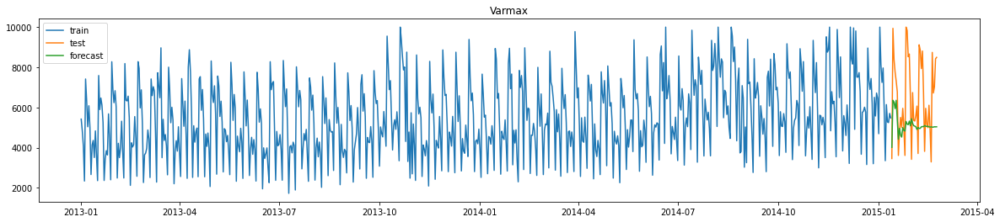

In [120]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)
train_test_plot(y_hat_varmax['Sales'],"Varmax")

> Calculate RMSE and MAPE for VARMAX

In [121]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'])).round(2)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_varmax['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_8_VARMAX_SchoolHoliday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98


#### Now we will plot the Inverse Response Function

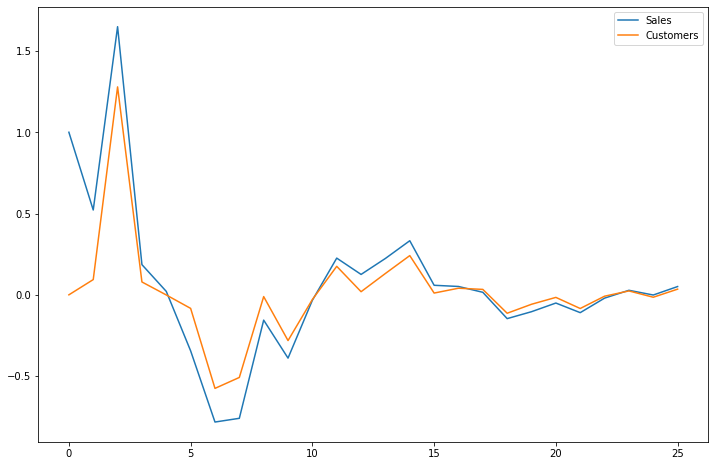

In [122]:
irf = resmax.impulse_responses(steps = 25, orthogonalized= False)
irf.plot()

## Forecasting of Store 9

### EDA: Store 9

In [123]:
df_store_9 = store_df_dictionary.get('Store 4')
df_time_series_store_9 = store_time_df_dictionary.get('Store 4')

<Figure size 1440x288 with 0 Axes>

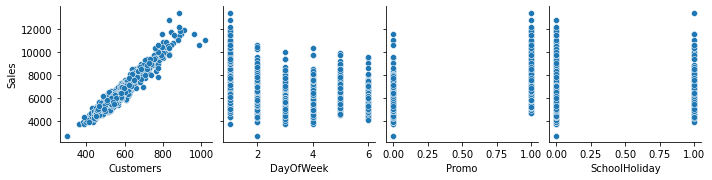

In [124]:
### Analysing the relations between sales and other numerical variables
plt.figure(figsize= (20,4))
sns.pairplot(data = df_store_9, x_vars= ['Customers','DayOfWeek', 'Promo', 'SchoolHoliday'],y_vars = ["Sales"])
plt.show()

We could observe the following from the above plots:<br>
a) Customers and Sales are highly correlated <br>
b) Sales are higher when promo is applied
c) Sales are higher on weekend as compared to weekdays

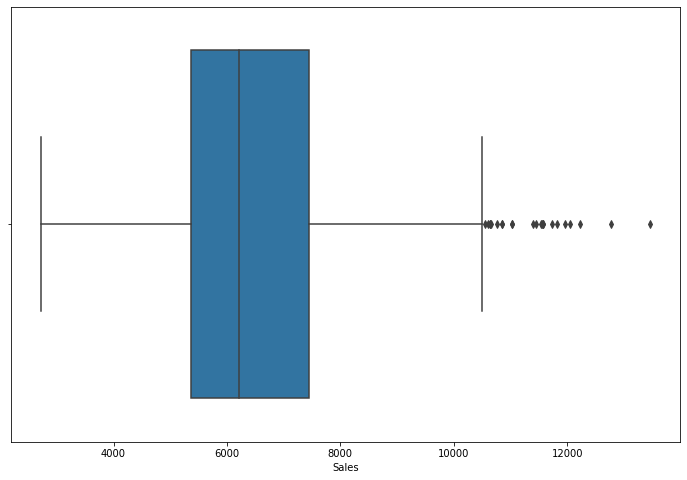

In [125]:
## Spread of Sales using box plot
sns.boxplot(df_store_9['Sales'])
plt.show()

#### From the above boxplot we could see that there are outliers for Sales greater than 10000. And the IQR lies between 5500-7600

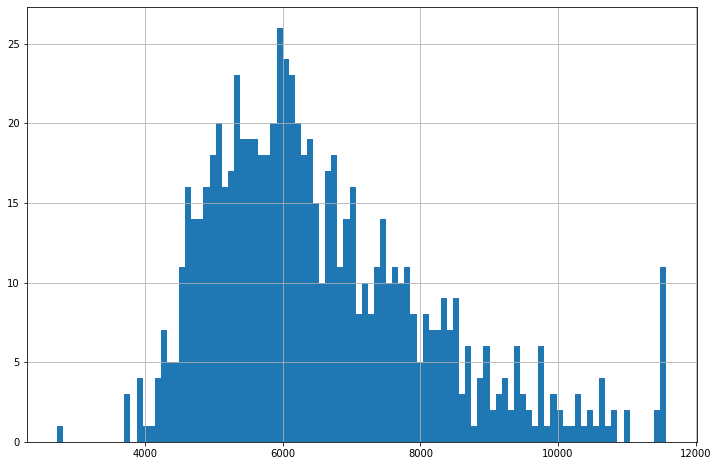

In [126]:
## Dstribution of the Sales
df_time_series_store_9['Sales'].hist(bins= 100)
plt.show()

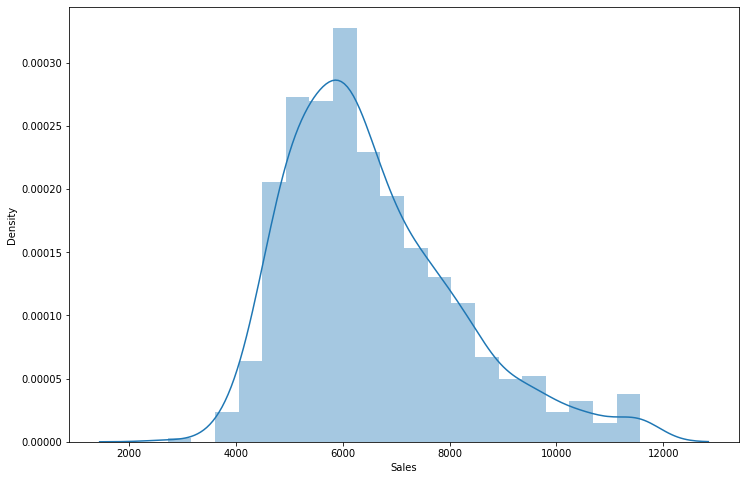

In [127]:
sns.distplot(df_time_series_store_9['Sales'])
plt.show()

#### From the above distribution plot we could see that most of the Sales value for Store 1 lies between 4000-10000 and are peaked at around 6000.<br>Also we could observe a almost Gaussian Distribution of the Sales

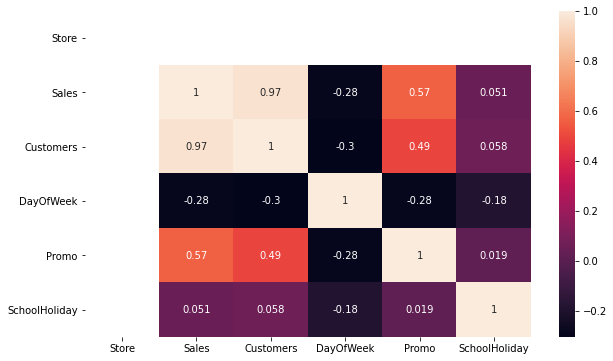

In [128]:
## Analyse correlation using heatmap
plt.figure(figsize=(10,6))
sns.heatmap(df_time_series_store_9.corr(),annot=True)
plt.show()

Using the heatmap to find out the correlation between the features we were able to find out that:<br>
a) Customers and Sales have a very high correlation.<br>
b) Promo and Sales also have a very high correlation

#### Decomposition of Time Series: Now our next step in the analysis is decomposition of time series for Store 3

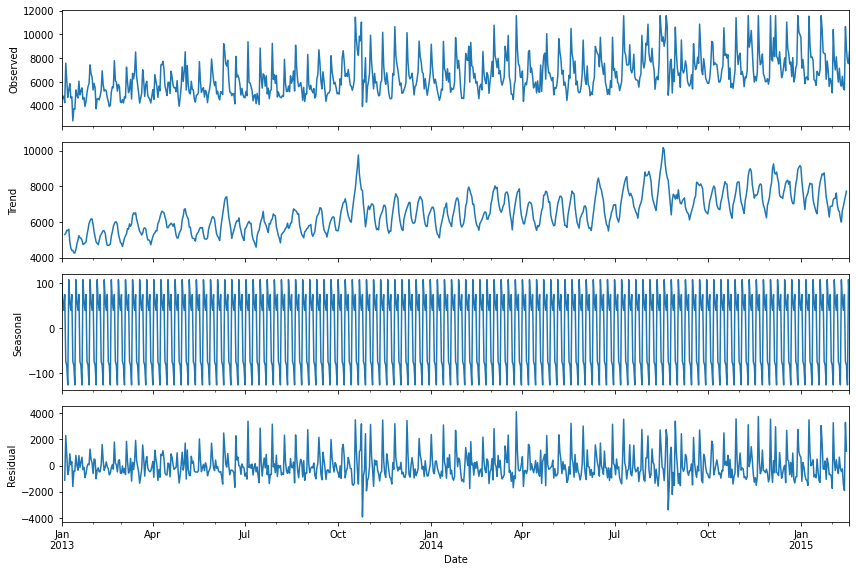

In [129]:
rcParams['figure.figsize']  =12,8
decomposition = sm.tsa.seasonal_decompose(df_time_series_store_9['Sales'],model = 'additive')
fig = decomposition.plot()
plt.show()

### Data Preparation and Train Test Split

In [130]:
print('The data available is for',round(len(df_time_series_store_9)/7,3),'weeks')

The data available is for 111.286 weeks


### Since the data is available for around 111.286 weeks. We would be taking around 6 weeks data that is last 42 days of data as test data and the rest as train data

In [131]:
train = df_time_series_store_9[['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42]
test = df_time_series_store_9[['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:]

In [132]:
print('The length of the train data for Store 9 is',len(train),'and the lenght of the test data for Store 9 is', len(test))

The length of the train data for Store 9 is 737 and the lenght of the test data for Store 9 is 42


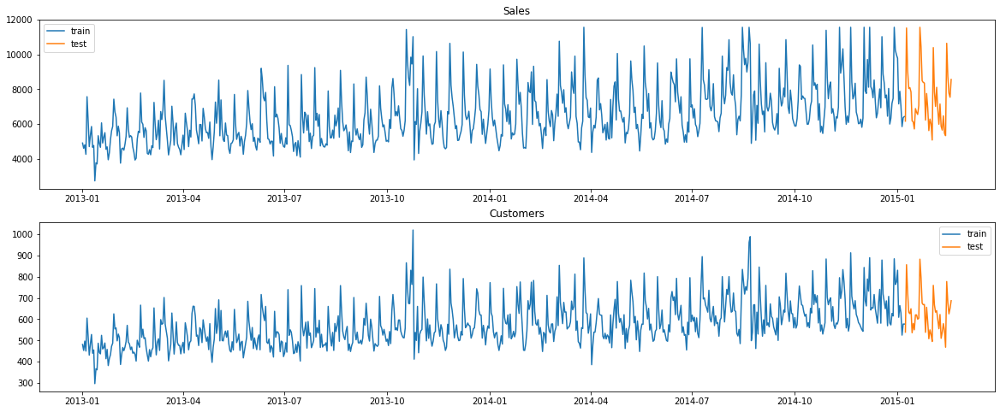

In [133]:
plt.figure(figsize = (20,8))
plt.subplot(211)
plt.plot(train['Sales'],label = 'train')
plt.plot(test['Sales'], label = 'test')
plt.title('Sales')
plt.legend(loc = 'best')

plt.subplot(212)
plt.plot(train['Customers'],label = 'train')
plt.plot(test['Customers'],label = 'test')
plt.title('Customers')
plt.legend(loc = 'best')
plt.show()

### Standardize the data using box cox transformation: Now we will standardize the training data using boxcox transformation

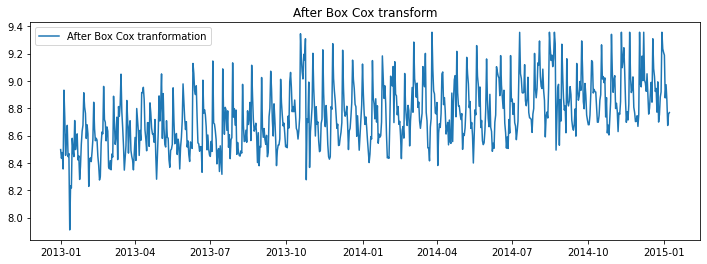

In [134]:
train_boxcox = pd.DataFrame(boxcox(train['Sales'], lmbda=0), index = train.index, columns=['Sales'])
train_boxcox['Customers'] =  pd.Series(boxcox(train['Customers'], lmbda=0), index = train.index)

# plotting Sales after boxcox transformation
plt.figure(figsize=(12,4))
plt.plot(train_boxcox['Sales'], label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

### Check for Stationarity using AD Fuller Test and KPSS test: 
Now we will check the stationarity of the data using Augmented Dicky Fuller test(AD Fuller Test) and Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [135]:
adf_test = adfuller(train['Sales'])

#Sales
print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Test for SALES
ADF Statistics: -2.579
Critical value @ 0.05: -2.87
p-value: 0.097471


ADF Test for CUSTOMERS
ADF Statistics: -3.159
Critical value @ 0.05: -2.87
p-value: 0.022482


In [136]:
kpss_test = kpss(train['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 2.918529
Critical Values @ 0.05: 0.46
p-value: 0.010000


KPSS test for Customers
KPSS Statistic: 3.020005
Critical Values @ 0.05: 0.46
p-value: 0.010000


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1709: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1709: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


* From the ADF Test and KPSS Test results we could see that the Sales Datset is not stationary



####  Now we will be Differencing to remove trend 

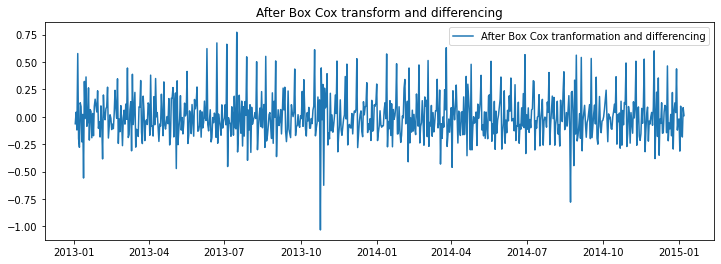

In [137]:
train_boxcox_diff = pd.DataFrame(pd.Series(train_boxcox['Sales'] - train_boxcox['Sales'].shift(), train.index))
train_boxcox_diff['Sales'] = train_boxcox_diff
train_boxcox_diff['Customers'] = train_boxcox['Customers'] - train_boxcox['Customers'].shift()
train_boxcox_diff.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(train_boxcox_diff['Sales'], label='After Box Cox tranformation and differencing')
plt.legend(loc='best')
plt.title('After Box Cox transform and differencing')
plt.show()

#### Check for stationarity after differencing

In [138]:
# Augmented Dickey Fuller test(ADF)
from statsmodels.tsa.stattools import adfuller

# Sales
adf_test = adfuller(train_boxcox_diff['Sales'])

print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train_boxcox_diff['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Test for SALES
ADF Statistics: -10.308
Critical value @ 0.05: -2.87
p-value: 0.000000


ADF Test for CUSTOMERS
ADF Statistics: -10.074
Critical value @ 0.05: -2.87
p-value: 0.000000


Observation:
- Now the training dataset is  stationary.

### Modeling for Store 9

>  AutoCorrelation function

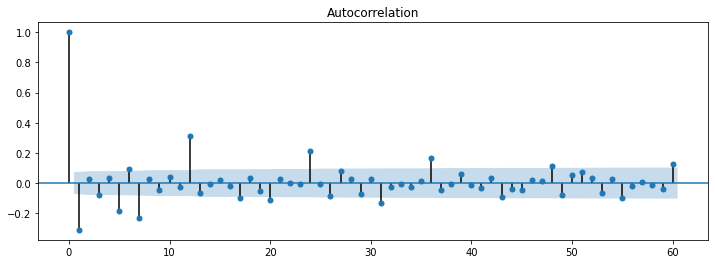

In [139]:
plt.figure(figsize=(12,4))
plot_acf(train_boxcox_diff['Sales'], ax=plt.gca(), lags = 60)
plt.show()

>  Partial AutoCorrelation function

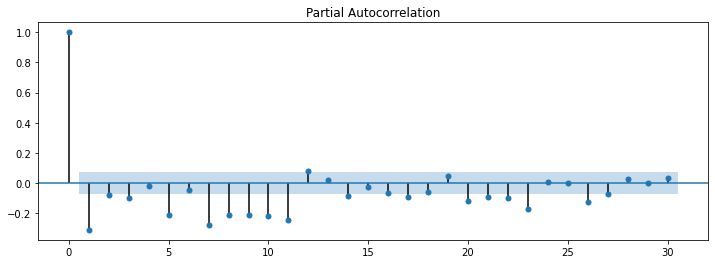

In [140]:
plt.figure(figsize=(12,4))
plot_pacf(train_boxcox_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

> **1. ARIMA MODEL**

In [141]:
model = ARIMA(train_boxcox_diff['Sales'], order=(2, 0, 2))
model_fit = model.fit()
print(model_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  736
Model:                     ARMA(2, 2)   Log Likelihood                 243.300
Method:                       css-mle   S.D. of innovations              0.173
Date:                Mon, 19 Jul 2021   AIC                           -474.600
Time:                        06:51:55   BIC                           -446.992
Sample:                    01-02-2013   HQIC                          -463.953
                         - 01-07-2015                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.0006   6.09e-05      9.090      0.000       0.000       0.001
ar.L1.Sales    -0.4205      0.048     -8.705      0.000      -0.515      -0.326
ar.L2.Sales     0.4968      0.033     15.152    

###### Recover the original time series

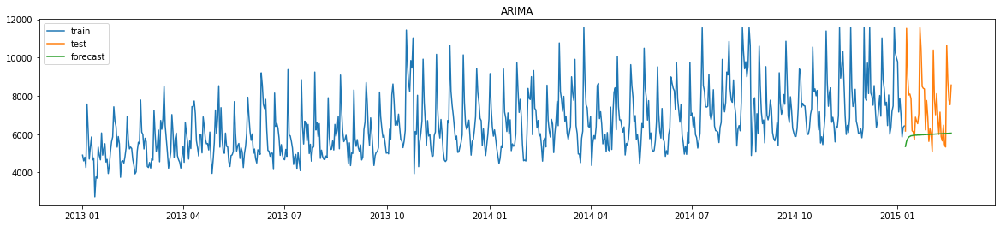

In [142]:
y_hat_ar = df_time_series_store_9['Sales'].copy()
y_hat_ar['ar_forecast_boxcox_diff'] = model_fit.predict(start = test.index.min(), end = test.index.max())
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox_diff'].cumsum()
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox'].add(train_boxcox['Sales'][0])
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

train_test_plot(y_hat_ar['ar_forecast'],"ARIMA")

> Calculate RMSE and MAPE for ARIMA

In [143]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_ar['ar_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_ar['ar_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_9_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56




> Check for Granger Casuality Test



In [144]:
grangers_causality_matrix(train,variables = train.columns)

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints d

,Sales_x,Customers_x,DayOfWeek_x,Promo_x,SchoolHoliday_x,StateHoliday_x
Sales_y,1.0,0.0000,0.0,0.0,0.0,1.0
Customers_y,0.0,1.0000,0.0,0.0,0.0,1.0
DayOfWeek_y,0.0,0.0000,1.0,0.0,0.0,1.0
Promo_y,0.0,0.0000,0.0,1.0,0.0,1.0
SchoolHoliday_y,0.0,0.0003,0.0,0.0,1.0,1.0
StateHoliday_y,NaN,NaN,NaN,NaN,NaN,NaN


> **2. VAR MODEL**

In [145]:
mod = sm.tsa.VARMAX(train_boxcox_diff[['Sales', 'Customers']], order=(12,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  736
Model:                            VAR(12)   Log Likelihood                1603.084
Date:                    Mon, 19 Jul 2021   AIC                          -3104.169
Time:                            06:52:25   BIC                          -2869.506
Sample:                        01-02-2013   HQIC                         -3013.669
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                73.58, 34.15   Jarque-Bera (JB):         80.85, 12.35
Prob(Q):                        0.00, 0.73   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.03, 1.17   Skew:                       0.45, 0.06
Prob(H) (two-sided):            0.82, 0.22   Kurtosis:                   4.36, 3.62


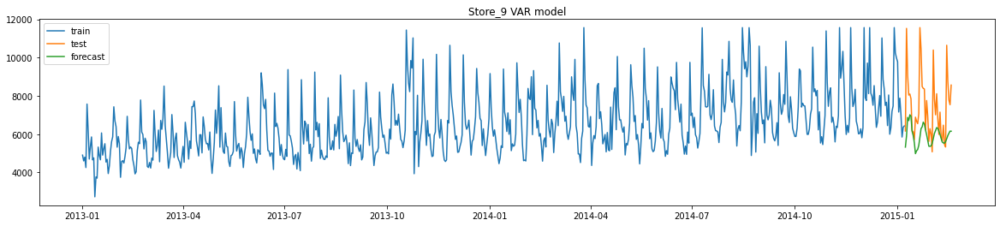

In [146]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_var = mod.fit().predict(start=start_index, end=end_index)
y_hat_var['Sales'] = y_hat_var['Sales'].cumsum()
y_hat_var['Sales'] = y_hat_var['Sales'].add(train_boxcox['Sales'][0])
y_hat_var = np.exp(y_hat_var)

train_test_plot(y_hat_var['Sales'],"Store_9 VAR model")

> Calculate RMSE and MAPE for VAR

In [147]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'])).round(2)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_var['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_9_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Johansen Cointegration Test: Now we will perform Johansen Cointegration Test to check the Cointegration between the variables

In [148]:
coint=coint_johansen(np.asarray(train_boxcox_diff[['Sales','Customers']]),0,1)
traces = coint.lr1
maxeig=coint.lr2
cvts = coint.cvt  ## 0: 90%  1:95% 2: 99%
cvms = coint.cvm   ## 0: 90%  1:95% 2: 99%

N, l = np.asarray(train[['Sales','Customers']]).shape

for i in range(l):
    if traces[i] > cvts[i, 1]:
        rank= i + 1
print(rank)

2


Since the rank is 2 we could say that there is no cointegration between the variables and the series are stationary

> **3. VARMAX MODEL**

#### While modeling using the VARMAX Model we would be using School Holiday as the exegenous variable

In [149]:
exog = train['SchoolHoliday']
mod_varmax = sm.tsa.VARMAX(train_boxcox_diff[['Sales', 'Customers']],exog= exog[1:], order=(1,1), trend='c')
resmax = mod_varmax.fit(maxiter=1000, disp=False)
print(resmax.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  736
Model:                        VARMAX(1,1)   Log Likelihood                1492.979
                              + intercept   AIC                          -2955.958
Date:                    Mon, 19 Jul 2021   BIC                          -2886.939
Time:                            06:53:15   HQIC                         -2929.340
Sample:                        01-02-2013                                         
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               283.86, 58.75   Jarque-Bera (JB):        159.07, 21.74
Prob(Q):                        0.00, 0.03   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.96, 1.12   Skew:                       0.80, 0.09
P

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


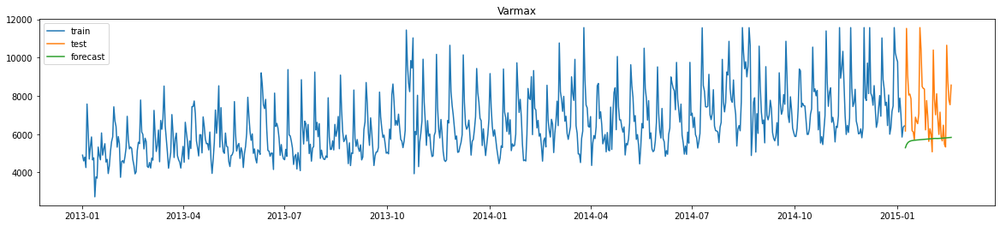

In [150]:
# forecast
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = np.array(exog[-42:]).reshape(42,1))
y_hat_varmax['Sales'] = y_hat_varmax['Sales'].cumsum()
y_hat_varmax['Sales'] = y_hat_varmax['Sales'].add(train_boxcox['Sales'][0])
y_hat_varmax = np.exp(y_hat_varmax)
train_test_plot(y_hat_varmax['Sales'],"Varmax")

> Calculate RMSE and MAPE for VARMAX

In [151]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'])).round(2)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_varmax['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_9_VARMAX_SchoolHoliday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Now we will plot the Inverse Response Function

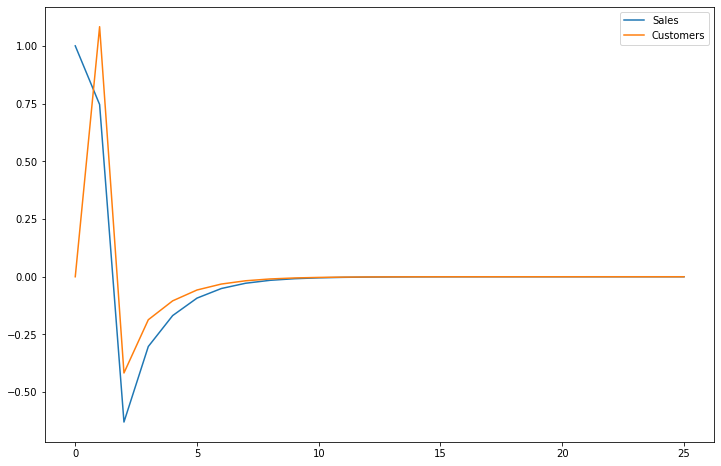

In [152]:
irf = resmax.impulse_responses(steps = 25, orthogonalized= False)
irf.plot()

## Forecasting of Store 13

### EDA: Store 13

In [153]:
df_store_13 = store_df_dictionary.get('Store 5')
df_time_series_store_13 = store_time_df_dictionary.get('Store 5')

<Figure size 1440x288 with 0 Axes>

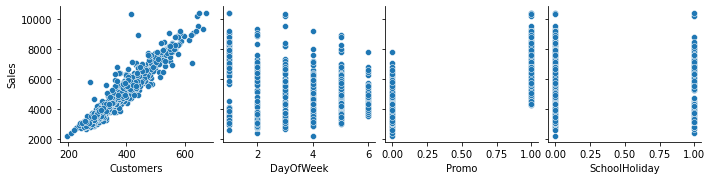

In [154]:
### Analysing the relations between sales and other numerical variables
plt.figure(figsize= [20,4])
sns.pairplot(data = df_store_13, x_vars= ['Customers','DayOfWeek', 'Promo', 'SchoolHoliday'],y_vars = ["Sales"])
plt.show()

We could observe the following from the above plots:<br>
a) Customers and Sales are highly correlated <br>
b) Sales are higher on weekend that that on wekdays<br>
c) Sales are higher when promo is applied

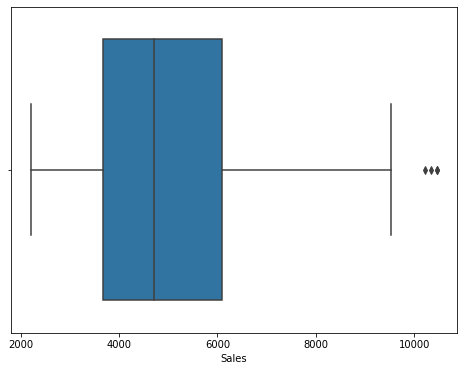

In [155]:
## Spread of Sales using box plot
plt.figure(figsize=(8,6))
sns.boxplot(df_store_13['Sales'])
plt.show()

#### From the above boxplot we could see that there are some outliers for Sales greater than 9300. And the IQR lies between 3800-6200

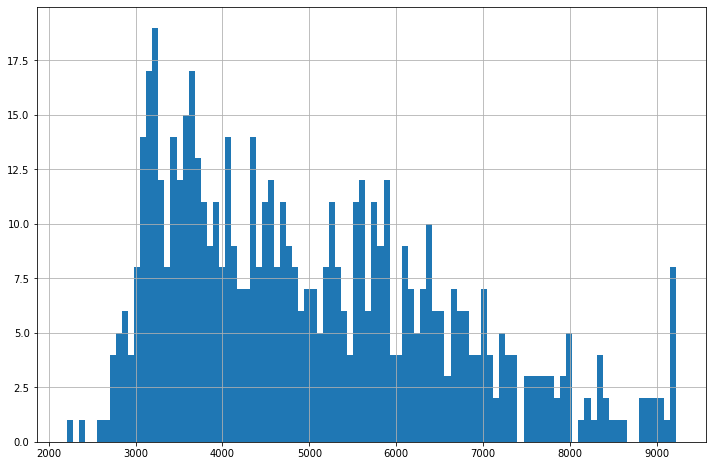

In [156]:
## Dstribution of the Sales
df_time_series_store_13['Sales'].hist(bins= 100)
plt.show()

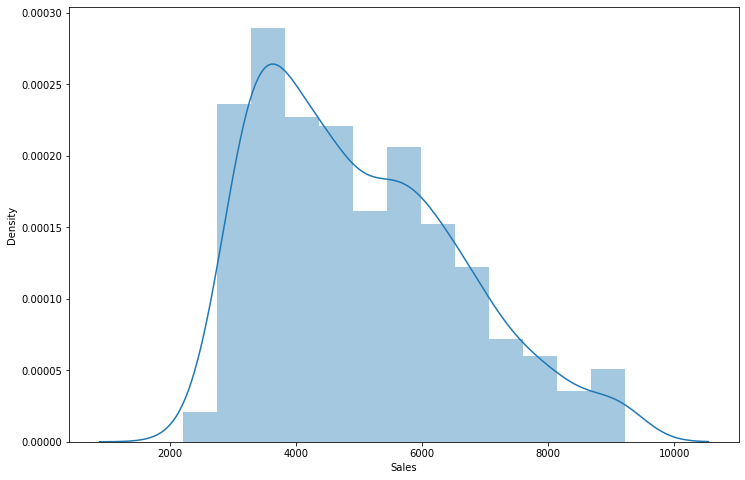

In [157]:
sns.distplot(df_time_series_store_13['Sales'])
plt.show()

#### From the above distribution plot we could see that most of the Sales value for Store 1 lies between 3000-6000 and are peaked at 3200-3500

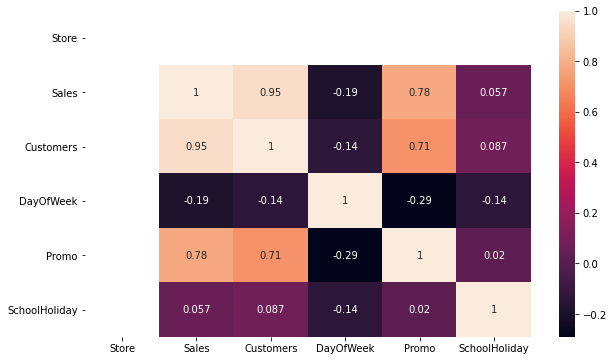

In [158]:
## Analyse correlation using heatmap
plt.figure(figsize=(10,6))
sns.heatmap(df_time_series_store_13.corr(),annot=True)
plt.show()

Using the heatmap to find out the correlation between the features we were able to find out that:<br>
a) Customers and Sales have a very high correlation.<br>
b) Higher correlation was found between Promo and Sales

#### Decomposition of Time Series: Now our next step in the analysis is decomposition of time series for Store 13

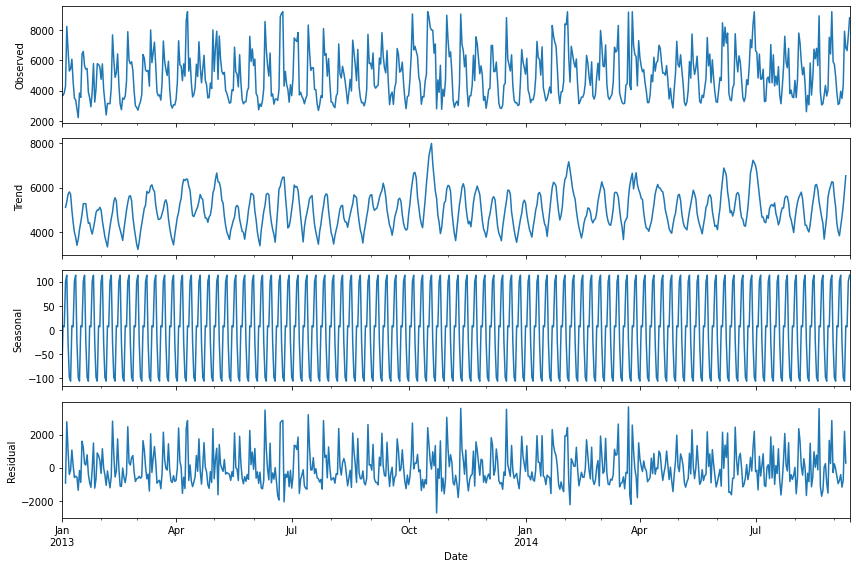

In [159]:
rcParams['figure.figsize']  =12,8
decomposition = sm.tsa.seasonal_decompose(df_time_series_store_13['Sales'],model = 'additive')
fig = decomposition.plot()
plt.show()

### Data Preparation and Train Test Split

In [160]:
print('The data available is for',round(len(df_time_series_store_13)/7,3),'weeks')

The data available is for 88.714 weeks


### Since the data is available for around 88.714 weeks. We would be taking around 6 weeks data that is last 42 days of data as test data and the rest as train data

In [161]:
train = df_time_series_store_13[['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42]
test = df_time_series_store_13[['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:]

In [162]:
print('The length of the train data for Store 13 is',len(train),'and the lenght of the test data for Store 13 is', len(test))

The length of the train data for Store 13 is 579 and the lenght of the test data for Store 13 is 42


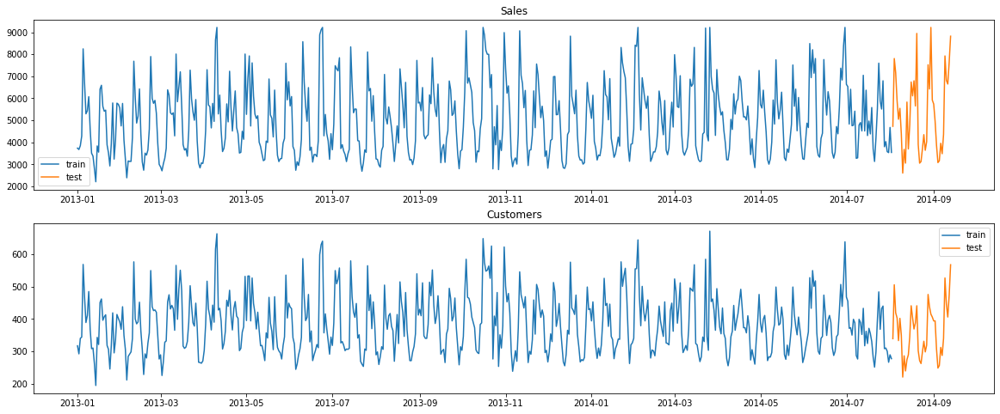

In [163]:
plt.figure(figsize = (20,8))
plt.subplot(211)
plt.plot(train['Sales'],label = 'train')
plt.plot(test['Sales'], label = 'test')
plt.title('Sales')
plt.legend(loc = 'best')

plt.subplot(212)
plt.plot(train['Customers'],label = 'train')
plt.plot(test['Customers'],label = 'test')
plt.title('Customers')
plt.legend(loc = 'best')
plt.show()

### Standardize the data using box cox transformation: Now we will standardize the training data using boxcox transformation

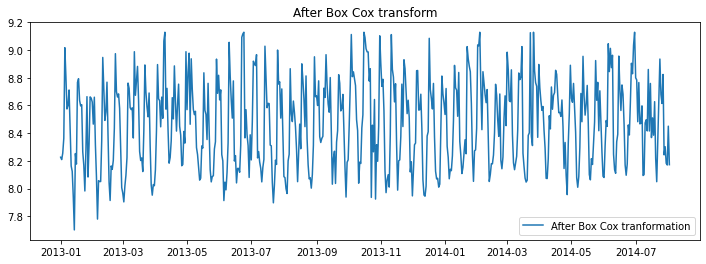

In [164]:
train_boxcox = pd.DataFrame(boxcox(train['Sales'], lmbda=0), index = train.index, columns=['Sales'])
train_boxcox['Customers'] =  pd.Series(boxcox(train['Customers'], lmbda=0), index = train.index)

# plotting Sales after boxcox transformation
plt.figure(figsize=(12,4))
plt.plot(train_boxcox['Sales'], label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

### Check for Stationarity using AD Fuller Test and KPSS test: 
Now we will check the stationarity of the data using Augmented Dicky Fuller test(AD Fuller Test) and Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [165]:
adf_test = adfuller(train['Sales'])

#Sales
print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])


ADF Test for SALES
ADF Statistics: -6.167
Critical value @ 0.05: -2.87
p-value: 0.000000


ADF Test for CUSTOMERS
ADF Statistics: -5.520
Critical value @ 0.05: -2.87
p-value: 0.000002


In [166]:
kpss_test = kpss(train['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 0.317391
Critical Values @ 0.05: 0.46
p-value: 0.100000


KPSS test for Customers
KPSS Statistic: 0.108303
Critical Values @ 0.05: 0.46
p-value: 0.100000


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1711: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1711: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)


* From the ADF Test and KPSS Test results we could see that the training data set is stationary



### Modeling for Store 13

>  AutoCorrelation function

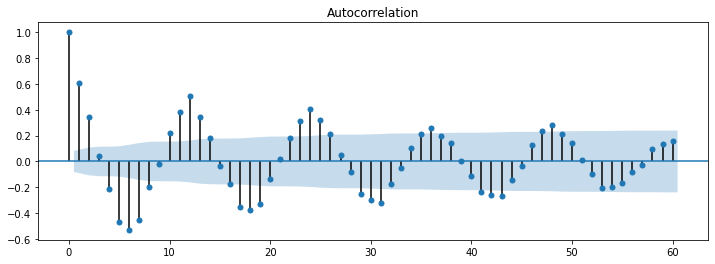

In [167]:
plt.figure(figsize=(12,4))
plot_acf(train_boxcox['Sales'], ax=plt.gca(), lags = 60)
plt.show()

>  Partial AutoCorrelation function

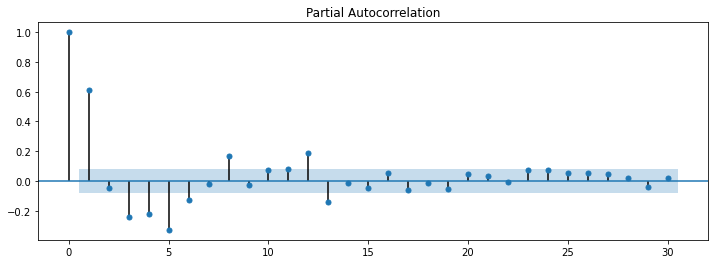

In [168]:
plt.figure(figsize=(12,4))
plot_pacf(train_boxcox['Sales'], ax=plt.gca(), lags = 30)
plt.show()

> **1. ARIMA MODEL**

In [169]:
model = ARIMA(train_boxcox['Sales'], order=(12, 1, 4))
model_fit = model.fit()
print(model_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


                             ARIMA Model Results                              
Dep. Variable:                D.Sales   No. Observations:                  578
Model:                ARIMA(12, 1, 4)   Log Likelihood                  90.663
Method:                       css-mle   S.D. of innovations              0.206
Date:                Mon, 19 Jul 2021   AIC                           -145.326
Time:                        06:54:21   BIC                            -66.854
Sample:                    01-02-2013   HQIC                          -114.728
                         - 08-02-2014                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0002      0.000      1.725      0.085   -2.42e-05       0.000
ar.L1.D.Sales     -0.2064      0.119     -1.730      0.084      -0.440       0.027
ar.L2.D.Sales     -0.1329      0.129

###### Recover the original time series

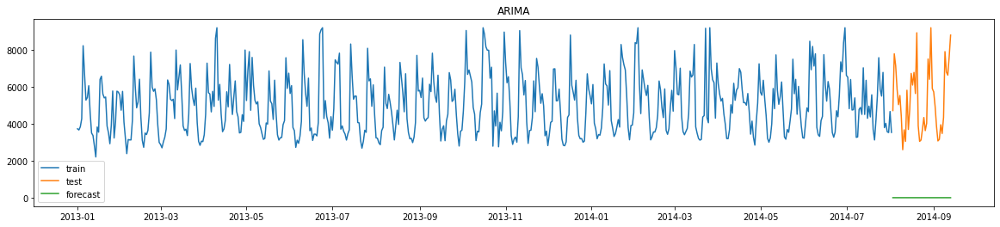

In [170]:
y_hat_ar = df_time_series_store_13['Sales'].copy()
y_hat_ar['ar_forecast_boxcox'] = model_fit.predict(start = test.index.min(), end = test.index.max())
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

train_test_plot(y_hat_ar['ar_forecast'],"ARIMA")

> Calculate RMSE and MAPE for ARIMA

In [171]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_ar['ar_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_ar['ar_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_13_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56




> Check for Granger Casuality Test



In [172]:
grangers_causality_matrix(train,variables = train.columns)

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints d

,Sales_x,Customers_x,DayOfWeek_x,Promo_x,SchoolHoliday_x,StateHoliday_x
Sales_y,1.000,0.0008,0.0,0.0000,0.0,1.0
Customers_y,0.000,1.0000,0.0,0.0000,0.0,1.0
DayOfWeek_y,0.000,0.0000,1.0,0.0000,0.0,1.0
Promo_y,0.000,0.0000,0.0,1.0000,0.0,1.0
SchoolHoliday_y,0.199,0.0852,0.0,0.0036,1.0,1.0
StateHoliday_y,NaN,NaN,NaN,NaN,NaN,NaN


> **2. VAR MODEL**

In [173]:
mod = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']], order=(3,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  579
Model:                             VAR(3)   Log Likelihood                 769.232
Date:                    Mon, 19 Jul 2021   AIC                          -1508.464
Time:                            06:54:38   BIC                          -1443.045
Sample:                        01-01-2013   HQIC                         -1482.957
                             - 08-02-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              429.96, 131.44   Jarque-Bera (JB):         32.72, 21.75
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.93, 1.41   Skew:                      0.49, -0.32
Prob(H) (two-sided):            0.60, 0.02   Kurtosis:                   3.62, 3.69


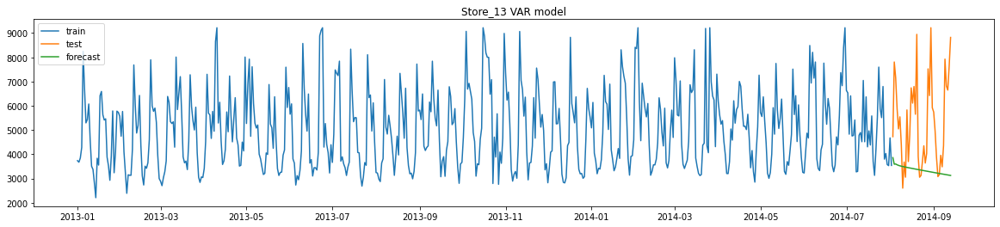

In [174]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_var = mod.fit().predict(start=start_index, end=end_index)
y_hat_var = np.exp(y_hat_var)
train_test_plot(y_hat_var['Sales'],"Store_13 VAR model")

> Calculate RMSE and MAPE for VAR

In [175]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'])).round(2)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_var['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_13_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Johansen Cointegration Test: Now we will perform Johansen Cointegration Test to check the Cointegration between the variables

In [176]:
coint=coint_johansen(np.asarray(train_boxcox[['Sales','Customers']]),0,1)
traces = coint.lr1
maxeig=coint.lr2
cvts = coint.cvt  ## 0: 90%  1:95% 2: 99%
cvms = coint.cvm   ## 0: 90%  1:95% 2: 99%

N, l = np.asarray(train[['Sales','Customers']]).shape

for i in range(l):
    if traces[i] > cvts[i, 1]:
        rank= i + 1
print(rank)

2


Since the rank is 2 we could say that there is no cointegration between the variables and the series are stationary

> **3. VARMAX MODEL**

#### While modeling using the VARMAX Model we would be using School Holiday as the exegenous variable

In [177]:
exog = train['SchoolHoliday']
mod_varmax = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']],exog= exog, order=(5,4), trend='c')
resmax = mod_varmax.fit(maxiter=1000, disp=False)
print(resmax.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  579
Model:                        VARMAX(5,4)   Log Likelihood                 907.491
                              + intercept   AIC                          -1728.982
Date:                    Mon, 19 Jul 2021   BIC                          -1541.446
Time:                            06:57:04   HQIC                         -1655.862
Sample:                        01-01-2013                                         
                             - 08-02-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               95.31, 102.47   Jarque-Bera (JB):         35.46, 31.14
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.00, 1.47   Skew:                      0.56, -0.39
P

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


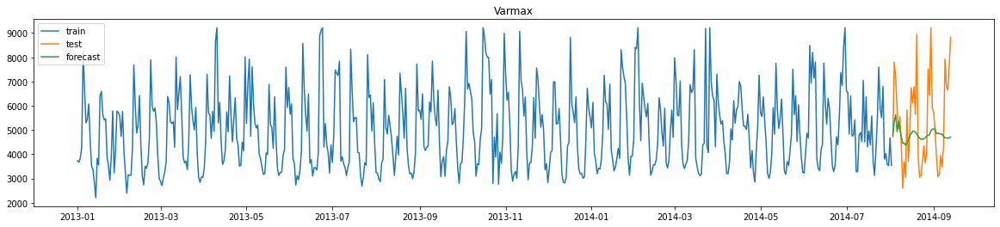

In [178]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)
train_test_plot(y_hat_varmax['Sales'],"Varmax")

> Calculate RMSE and MAPE for VARMAX

In [179]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'])).round(2)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_varmax['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_13_VARMAX_SchoolHoliday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Now we will plot the inverse function

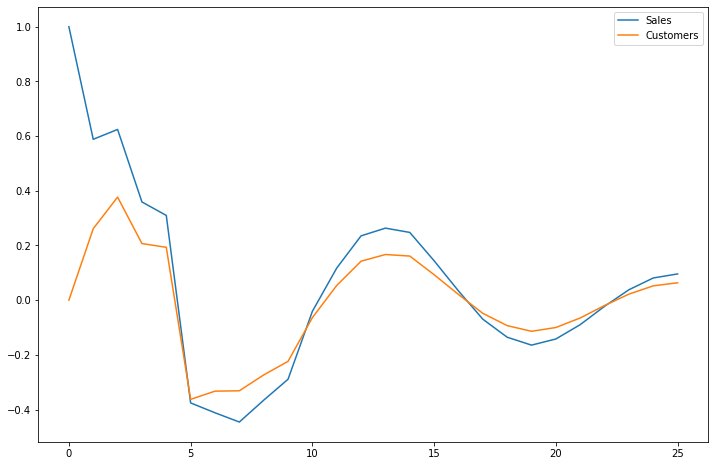

In [180]:
irf = resmax.impulse_responses(steps = 25, orthogonalized= False)
irf.plot()

## Forecasting of Store 25

### EDA: Store 25

In [181]:
df_store_25 = store_df_dictionary.get('Store 6')
df_time_series_store_25 = store_time_df_dictionary.get('Store 6')

<Figure size 1440x288 with 0 Axes>

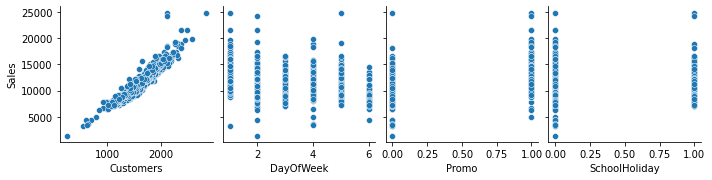

In [182]:
### Analysing the relations between sales and other numerical variables
plt.figure(figsize= [20,4])
sns.pairplot(data = df_store_25, x_vars= ['Customers','DayOfWeek', 'Promo', 'SchoolHoliday'],y_vars = ["Sales"])
plt.show()

We could observe the following from the above plots:<br>
a) Customers and Sales are highly correlated <br>
b) Sales are higher on weekend that that on wekdays<br>
c) Sales are higher when promo is applied

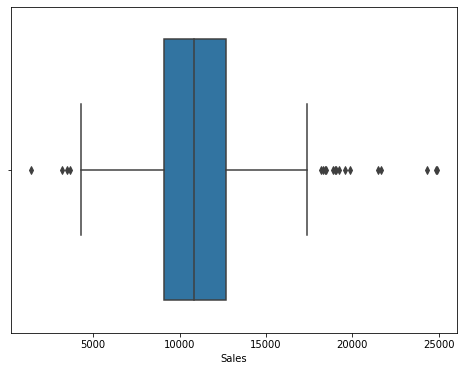

In [183]:
## Spread of Sales using box plot
plt.figure(figsize=(8,6))
sns.boxplot(df_store_25['Sales'])
plt.show()

#### From the above boxplot we could see that there are some outliers for Sales less than 5000 and greater than 17000. And the IQR lies between 9000-12000

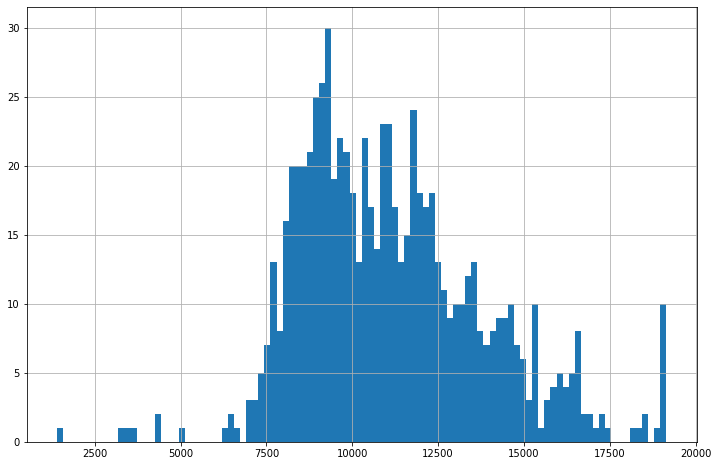

In [184]:
## Dstribution of the Sales
df_time_series_store_25['Sales'].hist(bins= 100)
plt.show()

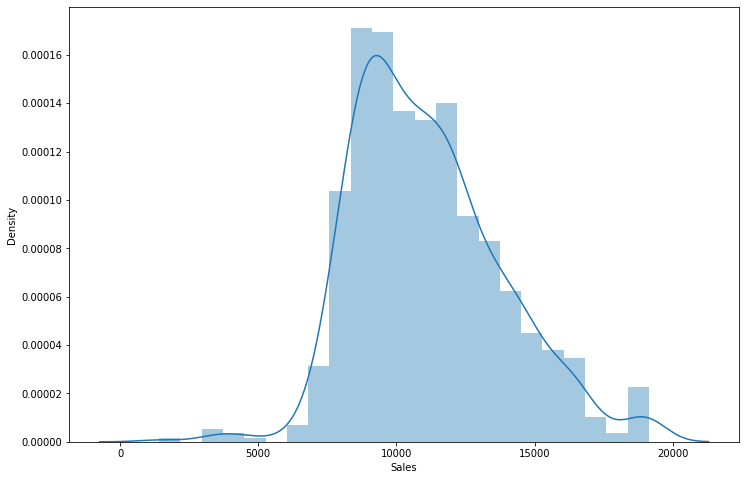

In [185]:
sns.distplot(df_time_series_store_25['Sales'])
plt.show()

#### From the above distribution plot we could see that most of the Sales value for Store 1 lies between 7500-15000 and are peaked at around 8000

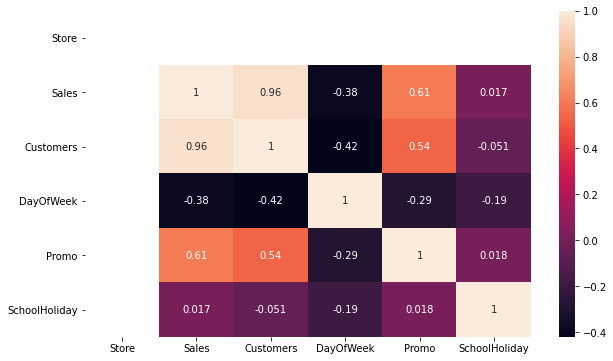

In [186]:
## Analyse correlation using heatmap
plt.figure(figsize=(10,6))
sns.heatmap(df_time_series_store_25.corr(),annot=True)
plt.show()

Using the heatmap to find out the correlation between the features we were able to find out that:<br>
a) Customers and Sales have a very high correlation.<br>
b) Higher correlation was found between Promo and Sales

#### Decomposition of Time Series: Now our next step in the analysis is decomposition of time series for Store 13

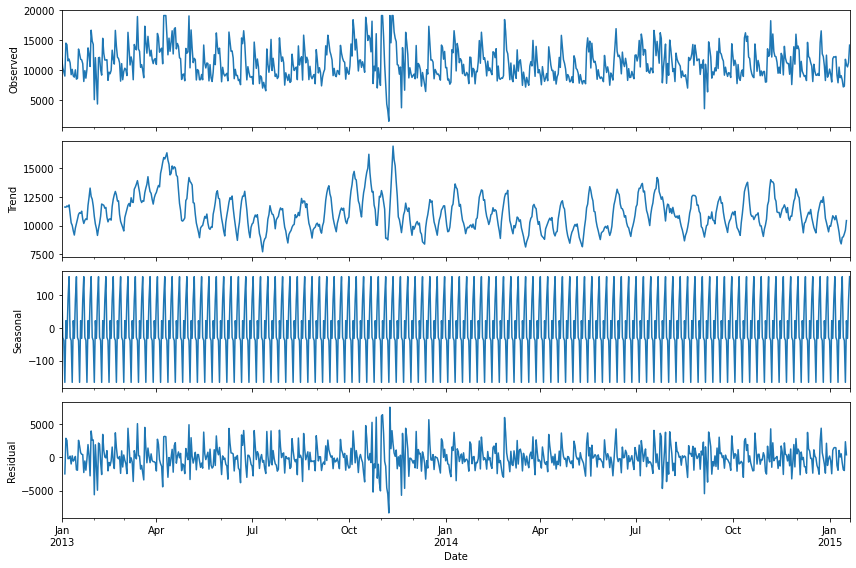

In [187]:
rcParams['figure.figsize']  =12,8
decomposition = sm.tsa.seasonal_decompose(df_time_series_store_25['Sales'],model = 'additive')
fig = decomposition.plot()
plt.show()

### Data Preparation and Train Test Split

In [188]:
print('The data available is for',round(len(df_time_series_store_25)/7,3),'weeks')

The data available is for 107.143 weeks


### Since the data is available for around 88.714 weeks. We would be taking around 6 weeks data that is last 42 days of data as test data and the rest as train data

In [189]:
train = df_time_series_store_25[['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42]
test = df_time_series_store_25[['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:]

In [190]:
print('The length of the train data for Store 25 is',len(train),'and the lenght of the test data for Store 25 is', len(test))

The length of the train data for Store 25 is 708 and the lenght of the test data for Store 25 is 42


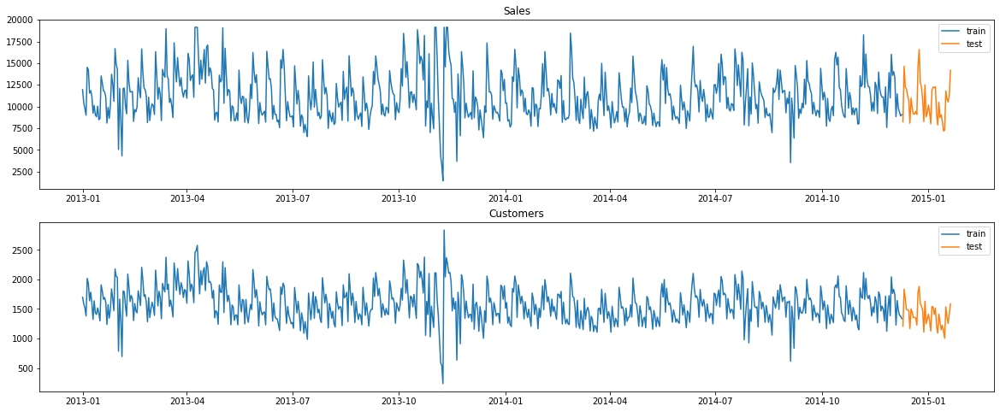

In [191]:
plt.figure(figsize = (20,8))
plt.subplot(211)
plt.plot(train['Sales'],label = 'train')
plt.plot(test['Sales'], label = 'test')
plt.title('Sales')
plt.legend(loc = 'best')

plt.subplot(212)
plt.plot(train['Customers'],label = 'train')
plt.plot(test['Customers'],label = 'test')
plt.title('Customers')
plt.legend(loc = 'best')
plt.show()

### Standardize the data using box cox transformation: Now we will standardize the training data using boxcox transformation

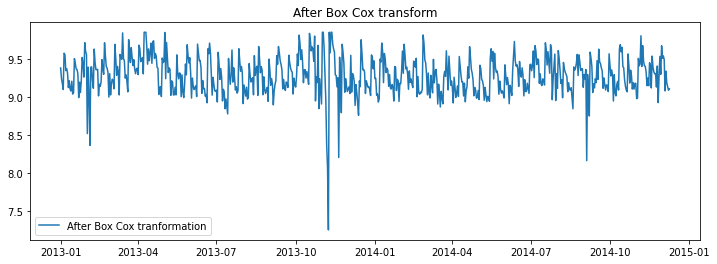

In [192]:
train_boxcox = pd.DataFrame(boxcox(train['Sales'], lmbda=0), index = train.index, columns=['Sales'])
train_boxcox['Customers'] =  pd.Series(boxcox(train['Customers'], lmbda=0), index = train.index)

# plotting Sales after boxcox transformation
plt.figure(figsize=(12,4))
plt.plot(train_boxcox['Sales'], label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

### Check for Stationarity using AD Fuller Test and KPSS test: 
Now we will check the stationarity of the data using Augmented Dicky Fuller test(AD Fuller Test) and Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [193]:
adf_test = adfuller(train['Sales'])

#Sales
print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])


ADF Test for SALES
ADF Statistics: -5.104
Critical value @ 0.05: -2.87
p-value: 0.000014


ADF Test for CUSTOMERS
ADF Statistics: -4.367
Critical value @ 0.05: -2.87
p-value: 0.000339


In [194]:
kpss_test = kpss(train['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 0.306807
Critical Values @ 0.05: 0.46
p-value: 0.100000


KPSS test for Customers
KPSS Statistic: 0.705135
Critical Values @ 0.05: 0.46
p-value: 0.013079


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1711: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)


* From the ADF Test and KPSS Test results we could see that the training data set is stationary



### Modeling for Store 25

>  AutoCorrelation function

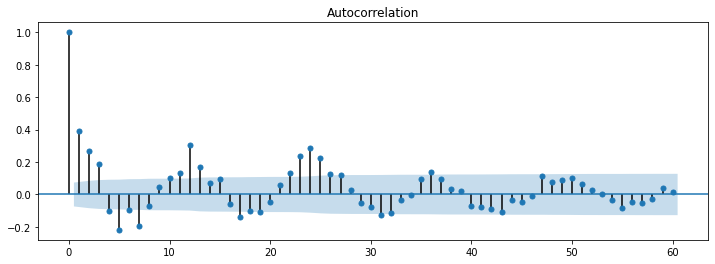

In [195]:
plt.figure(figsize=(12,4))
plot_acf(train_boxcox['Sales'], ax=plt.gca(), lags = 60)
plt.show()

>  Partial AutoCorrelation function

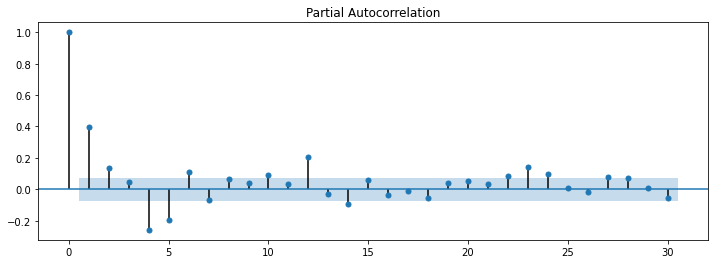

In [196]:
plt.figure(figsize=(12,4))
plot_pacf(train_boxcox['Sales'], ax=plt.gca(), lags = 30)
plt.show()

> **1. ARIMA MODEL**

In [197]:
model = ARIMA(train_boxcox['Sales'], order=(12, 1, 4))
model_fit = model.fit()
print(model_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                             ARIMA Model Results                              
Dep. Variable:                D.Sales   No. Observations:                  707
Model:                ARIMA(12, 1, 4)   Log Likelihood                  93.561
Method:                       css-mle   S.D. of innovations              0.211
Date:                Mon, 19 Jul 2021   AIC                           -151.121
Time:                        06:59:29   BIC                            -69.023
Sample:                    01-02-2013   HQIC                          -119.400
                         - 12-09-2014                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const          -7.454e-05   9.22e-05     -0.808      0.419      -0.000       0.000
ar.L1.D.Sales      0.0973      0.222      0.437      0.662      -0.339       0.533
ar.L2.D.Sales     -0.3265      0.202

###### Recover the original time series

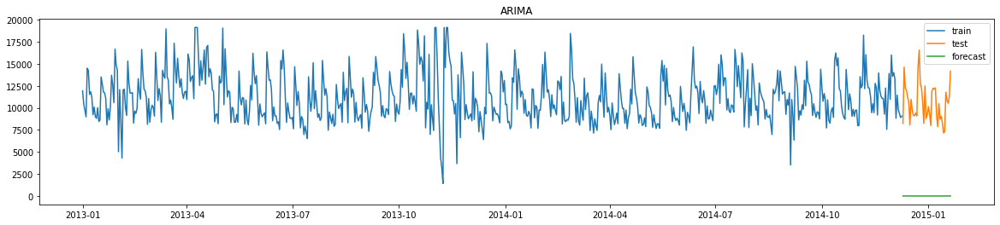

In [198]:
y_hat_ar = df_time_series_store_25['Sales'].copy()
y_hat_ar['ar_forecast_boxcox'] = model_fit.predict(start = test.index.min(), end = test.index.max())
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

train_test_plot(y_hat_ar['ar_forecast'],"ARIMA")

> Calculate RMSE and MAPE for ARIMA

In [199]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_ar['ar_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_ar['ar_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_25_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56




> Check for Granger Casuality Test



In [200]:
grangers_causality_matrix(train,variables = train.columns)

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints d

,Sales_x,Customers_x,DayOfWeek_x,Promo_x,SchoolHoliday_x,StateHoliday_x
Sales_y,1.0,0.0000,0.0,0.0,0.0,1.0
Customers_y,0.0,1.0000,0.0,0.0,0.0,1.0
DayOfWeek_y,0.0,0.0000,1.0,0.0,0.0,1.0
Promo_y,0.0,0.0000,0.0,1.0,0.0,1.0
SchoolHoliday_y,0.0,0.0001,0.0,0.0,1.0,1.0
StateHoliday_y,NaN,NaN,NaN,NaN,NaN,NaN


> **2. VAR MODEL**

In [201]:
mod = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']], order=(3,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  708
Model:                             VAR(3)   Log Likelihood                1220.359
Date:                    Mon, 19 Jul 2021   AIC                          -2410.719
Time:                            06:59:43   BIC                          -2342.282
Sample:                        01-01-2013   HQIC                         -2384.278
                             - 12-09-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               182.69, 79.20   Jarque-Bera (JB):      3941.58, 231.05
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.94, 1.25   Skew:                      0.96, -0.53
Prob(H) (two-sided):            0.64, 0.09   Kurtosis:                  14.40, 5.59


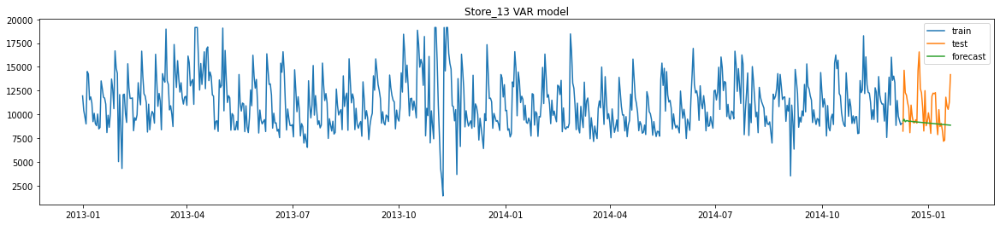

In [202]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_var = mod.fit().predict(start=start_index, end=end_index)
y_hat_var = np.exp(y_hat_var)
train_test_plot(y_hat_var['Sales'],"Store_13 VAR model")

> Calculate RMSE and MAPE for VAR

In [203]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'])).round(2)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_var['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_25_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Johansen Cointegration Test: Now we will perform Johansen Cointegration Test to check the Cointegration between the variables

In [204]:
coint=coint_johansen(np.asarray(train_boxcox[['Sales','Customers']]),0,1)
traces = coint.lr1
maxeig=coint.lr2
cvts = coint.cvt  ## 0: 90%  1:95% 2: 99%
cvms = coint.cvm   ## 0: 90%  1:95% 2: 99%

N, l = np.asarray(train[['Sales','Customers']]).shape

for i in range(l):
    if traces[i] > cvts[i, 1]:
        rank= i + 1
print(rank)

2


Since the rank is 2 we could say that there is no cointegration between the variables and the series are stationary

> **3. VARMAX MODEL**

#### While modeling using the VARMAX Model we would be using School Holiday as the exegenous variable

In [205]:
exog = train['SchoolHoliday']
mod_varmax = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']],exog= exog, order=(8,8), trend='c')
resmax = mod_varmax.fit(maxiter=1000, disp=False)
print(resmax.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  708
Model:                        VARMAX(8,8)   Log Likelihood                1353.959
                              + intercept   AIC                          -2565.918
Date:                    Mon, 19 Jul 2021   BIC                          -2241.984
Time:                            07:02:47   HQIC                         -2440.764
Sample:                        01-01-2013                                         
                             - 12-09-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                67.11, 52.66   Jarque-Bera (JB):      1621.03, 145.72
Prob(Q):                        0.00, 0.09   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.93, 1.30   Skew:                     -0.32, -0.47
P

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


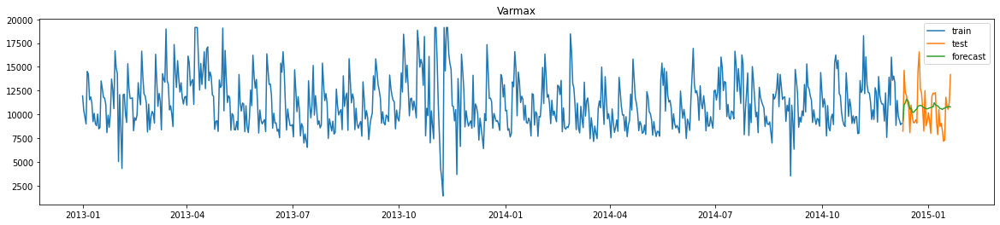

In [206]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)
train_test_plot(y_hat_varmax['Sales'],"Varmax")

> Calculate RMSE and MAPE for VARMAX

In [207]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'])).round(2)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_varmax['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_25_VARMAX_SchoolHoliday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Now we will plot the inverse function

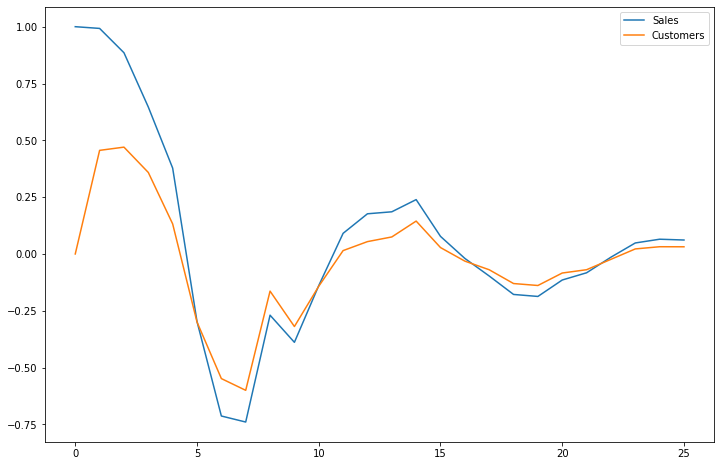

In [208]:
irf = resmax.impulse_responses(steps = 25, orthogonalized= False)
irf.plot()

## Forecasting of Store 29

### EDA: Store 29

In [209]:
df_store_29 = store_df_dictionary.get('Store 7')
df_time_series_store_29 = store_time_df_dictionary.get('Store 7')

<Figure size 1440x288 with 0 Axes>

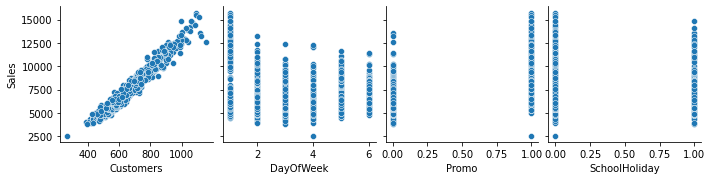

In [210]:
### Analysing the relations between sales and other numerical variables
plt.figure(figsize= (20,4))
sns.pairplot(data = df_store_29, x_vars= ['Customers','DayOfWeek', 'Promo', 'SchoolHoliday'],y_vars = ["Sales"])
plt.show()

We could observe the following from the above plots:<br>
a) Customers and Sales are highly correlated <br>
b) Sales are higher when promo is applied<br>
c) Sales are higher on weekend as compared to weekdays

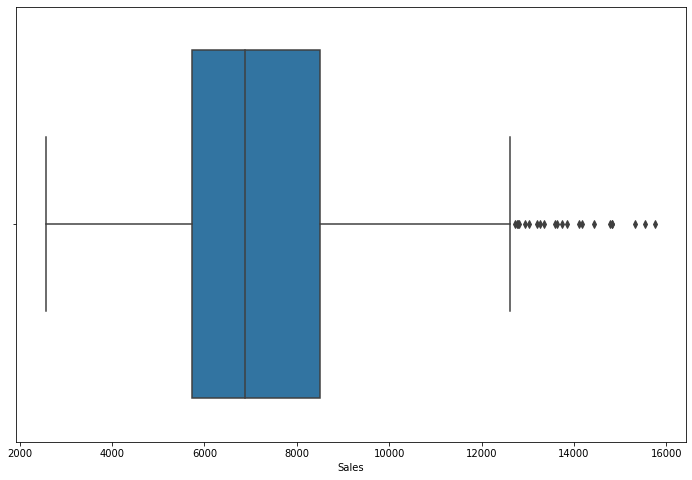

In [211]:
## Spread of Sales using box plot
sns.boxplot(df_store_29['Sales'])
plt.show()

#### From the above boxplot we could see that there are outliers for Sales greater than 12100. And the IQR lies between 5800-8300

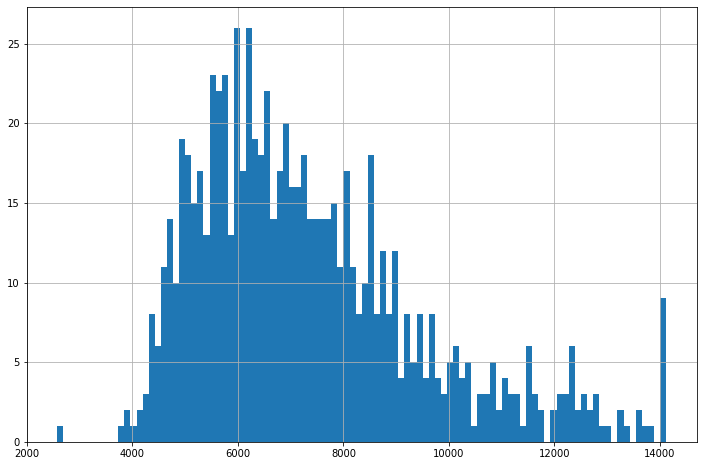

In [212]:
## Dstribution of the Sales
df_time_series_store_29['Sales'].hist(bins= 100)
plt.show()

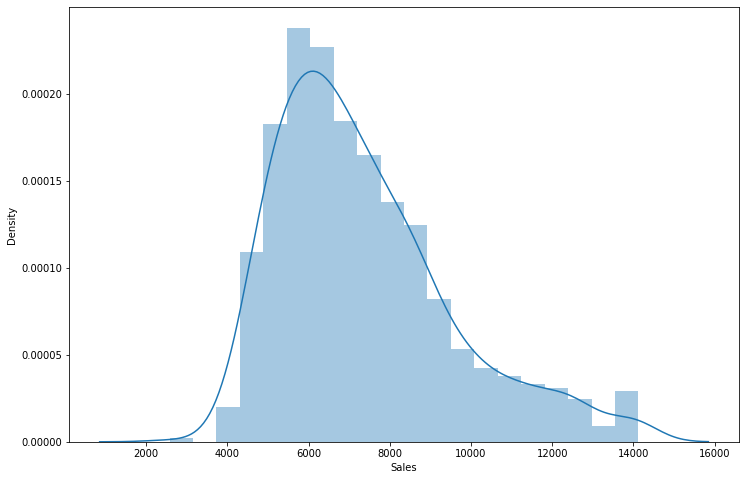

In [213]:
sns.distplot(df_time_series_store_29['Sales'])
plt.show()

#### From the above distribution plot we could see that most of the Sales value for Store 1 lies between 4000-12000 and are peaked at around 6000.<br>Also we could observe a almost Gaussian Distribution of the Sales with slighly right skewed.

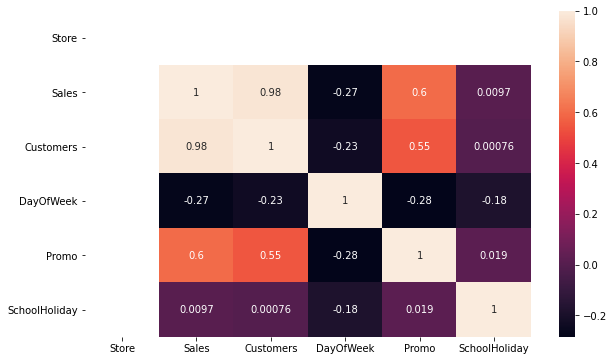

In [214]:
## Analyse correlation using heatmap
plt.figure(figsize=(10,6))
sns.heatmap(df_time_series_store_29.corr(),annot=True)
plt.show()

Using the heatmap to find out the correlation between the features we were able to find out that:<br>
a) Customers and Sales have a very high correlation.<br>
b) Promo and Sales also have a high correlation

#### Decomposition of Time Series: Now our next step in the analysis is decomposition of time series for Store 3

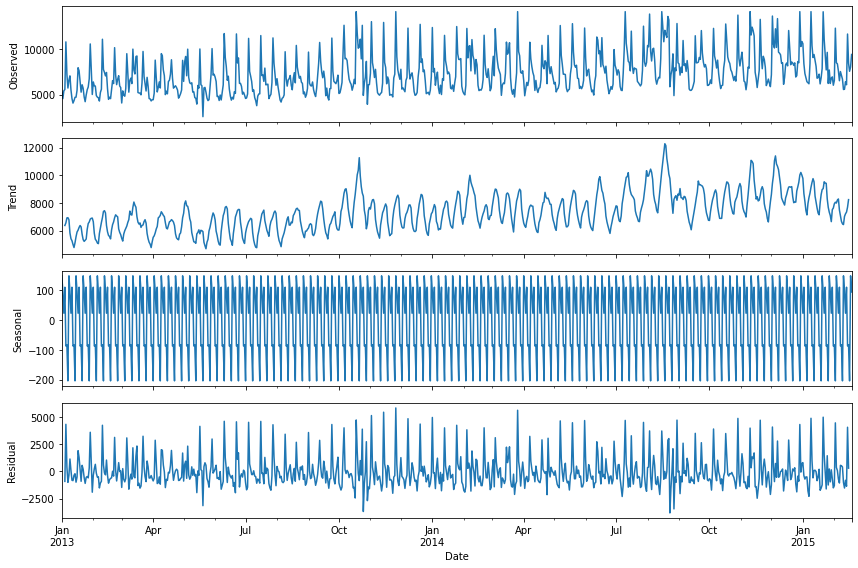

In [215]:
rcParams['figure.figsize']  =12,8
decomposition = sm.tsa.seasonal_decompose(df_time_series_store_29['Sales'],model = 'additive')
fig = decomposition.plot()
plt.show()

### Data Preparation and Train Test Split

In [216]:
print('The data available is for',round(len(df_time_series_store_29)/7,3),'weeks')

The data available is for 111.286 weeks


### Since the data is available for around 111.286 weeks. We would be taking around 6 weeks data that is last 42 days of data as test data and the rest as train data

In [217]:
train = df_time_series_store_29[['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42]
test = df_time_series_store_29[['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:]

In [218]:
print('The length of the train data for Store 29 is',len(train),'and the lenght of the test data for Store 29 is', len(test))

The length of the train data for Store 29 is 737 and the lenght of the test data for Store 29 is 42


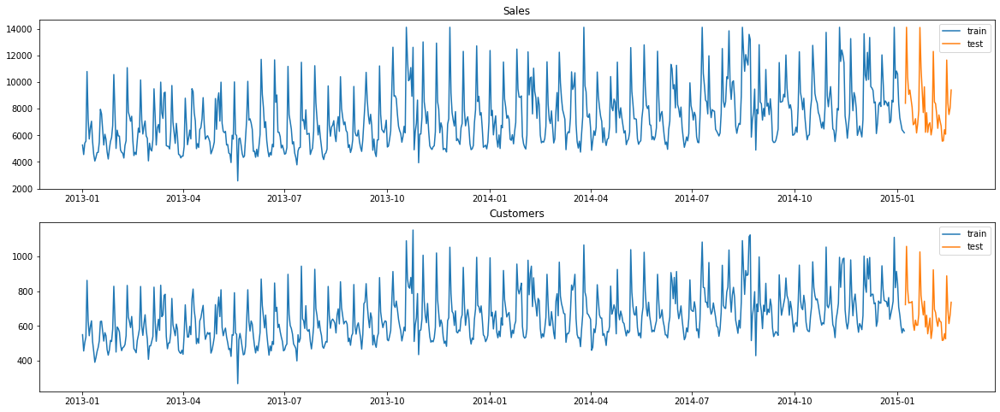

In [219]:
plt.figure(figsize = (20,8))
plt.subplot(211)
plt.plot(train['Sales'],label = 'train')
plt.plot(test['Sales'], label = 'test')
plt.title('Sales')
plt.legend(loc = 'best')

plt.subplot(212)
plt.plot(train['Customers'],label = 'train')
plt.plot(test['Customers'],label = 'test')
plt.title('Customers')
plt.legend(loc = 'best')
plt.show()

### Standardize the data using box cox transformation: Now we will standardize the training data using boxcox transformation

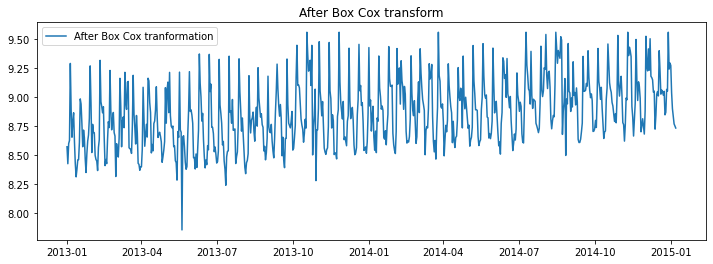

In [220]:
train_boxcox = pd.DataFrame(boxcox(train['Sales'], lmbda=0), index = train.index, columns=['Sales'])
train_boxcox['Customers'] =  pd.Series(boxcox(train['Customers'], lmbda=0), index = train.index)

# plotting Sales after boxcox transformation
plt.figure(figsize=(12,4))
plt.plot(train_boxcox['Sales'], label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

### Check for Stationarity using AD Fuller Test and KPSS test: 
Now we will check the stationarity of the data using Augmented Dicky Fuller test(AD Fuller Test) and Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [221]:
adf_test = adfuller(train['Sales'])

#Sales
print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Test for SALES
ADF Statistics: -3.209
Critical value @ 0.05: -2.87
p-value: 0.019483


ADF Test for CUSTOMERS
ADF Statistics: -3.790
Critical value @ 0.05: -2.87
p-value: 0.003007


In [222]:
kpss_test = kpss(train['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 2.671353
Critical Values @ 0.05: 0.46
p-value: 0.010000


KPSS test for Customers
KPSS Statistic: 2.750163
Critical Values @ 0.05: 0.46
p-value: 0.010000


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1709: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1709: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


* From the ADF Test and KPSS Test results we could see that the Sales Datset is not stationary



####  Now we will be Differencing to remove trend 

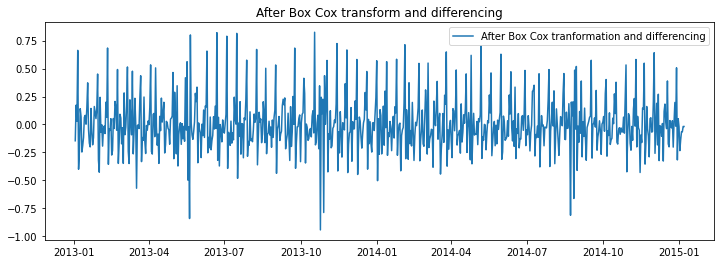

In [223]:
train_boxcox_diff = pd.DataFrame(pd.Series(train_boxcox['Sales'] - train_boxcox['Sales'].shift(), train.index))
train_boxcox_diff['Sales'] = train_boxcox_diff
train_boxcox_diff['Customers'] = train_boxcox['Customers'] - train_boxcox['Customers'].shift()
train_boxcox_diff.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(train_boxcox_diff['Sales'], label='After Box Cox tranformation and differencing')
plt.legend(loc='best')
plt.title('After Box Cox transform and differencing')
plt.show()

#### Check for stationarity after differencing

In [224]:
# Augmented Dickey Fuller test(ADF)
from statsmodels.tsa.stattools import adfuller

# Sales
adf_test = adfuller(train_boxcox_diff['Sales'])

print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train_boxcox_diff['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Test for SALES
ADF Statistics: -10.674
Critical value @ 0.05: -2.87
p-value: 0.000000


ADF Test for CUSTOMERS
ADF Statistics: -10.198
Critical value @ 0.05: -2.87
p-value: 0.000000


Observation:
- Now the training dataset is  stationary.

### Modeling for Store 29

>  AutoCorrelation function

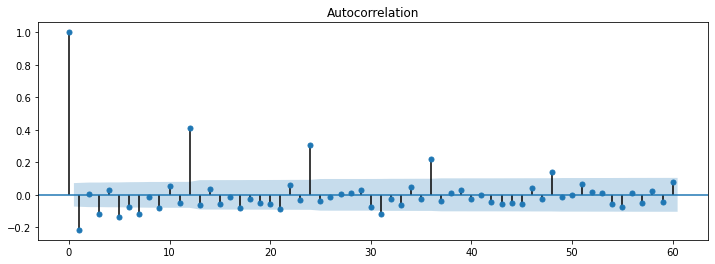

In [225]:
plt.figure(figsize=(12,4))
plot_acf(train_boxcox_diff['Sales'], ax=plt.gca(), lags = 60)
plt.show()

>  Partial AutoCorrelation function

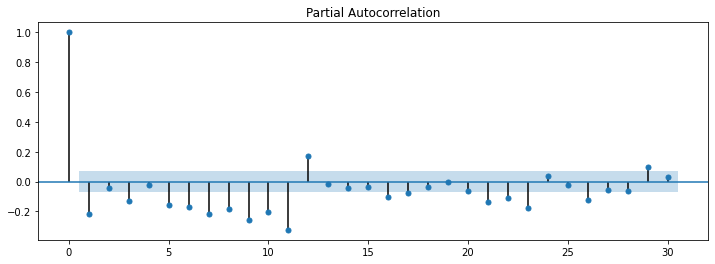

In [226]:
plt.figure(figsize=(12,4))
plot_pacf(train_boxcox_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

> **1. ARIMA MODEL**

In [227]:
model = ARIMA(train_boxcox_diff['Sales'], order=(1, 0, 1))
model_fit = model.fit()
print(model_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  736
Model:                     ARMA(1, 1)   Log Likelihood                  89.304
Method:                       css-mle   S.D. of innovations              0.214
Date:                Mon, 19 Jul 2021   AIC                           -170.607
Time:                        07:02:54   BIC                           -152.202
Sample:                    01-02-2013   HQIC                          -163.509
                         - 01-07-2015                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.0005   8.14e-05      6.724      0.000       0.000       0.001
ar.L1.Sales     0.5481      0.031     17.715      0.000       0.487       0.609
ma.L1.Sales    -1.0000      0.003   -285.959    

###### Recover the original time series

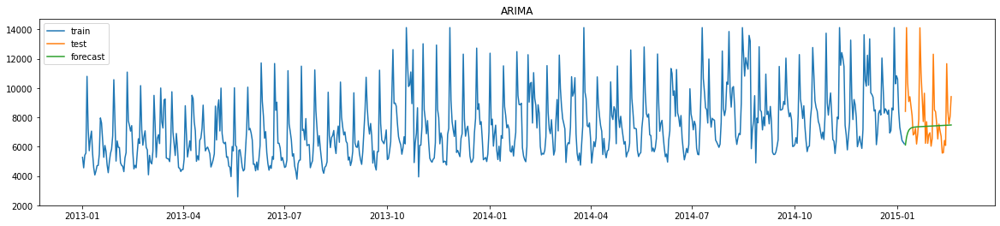

In [228]:
y_hat_ar = df_time_series_store_29['Sales'].copy()
y_hat_ar['ar_forecast_boxcox_diff'] = model_fit.predict(start = test.index.min(), end = test.index.max())
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox_diff'].cumsum()
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox'].add(train_boxcox['Sales'][0])
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

train_test_plot(y_hat_ar['ar_forecast'],"ARIMA")

> Calculate RMSE and MAPE for ARIMA

In [229]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_ar['ar_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_ar['ar_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_29_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56




> Check for Granger Casuality Test



In [230]:
grangers_causality_matrix(train,variables = train.columns)

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints d

,Sales_x,Customers_x,DayOfWeek_x,Promo_x,SchoolHoliday_x,StateHoliday_x
Sales_y,1.0,0.0,0.0,0.0,0.0,1.0
Customers_y,0.0,1.0,0.0,0.0,0.0,1.0
DayOfWeek_y,0.0,0.0,1.0,0.0,0.0,1.0
Promo_y,0.0,0.0,0.0,1.0,0.0,1.0
SchoolHoliday_y,0.0,0.0,0.0,0.0,1.0,1.0
StateHoliday_y,NaN,NaN,NaN,NaN,NaN,NaN


> **2. VAR MODEL**

In [231]:
mod = sm.tsa.VARMAX(train_boxcox_diff[['Sales', 'Customers']], order=(12,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  736
Model:                            VAR(12)   Log Likelihood                1529.298
Date:                    Mon, 19 Jul 2021   AIC                          -2956.596
Time:                            07:03:35   BIC                          -2721.934
Sample:                        01-02-2013   HQIC                         -2866.096
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                79.99, 20.27   Jarque-Bera (JB):         85.39, 16.94
Prob(Q):                        0.00, 1.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.94, 1.13   Skew:                      0.26, -0.02
Prob(H) (two-sided):            0.61, 0.36   Kurtosis:                   4.58, 3.74


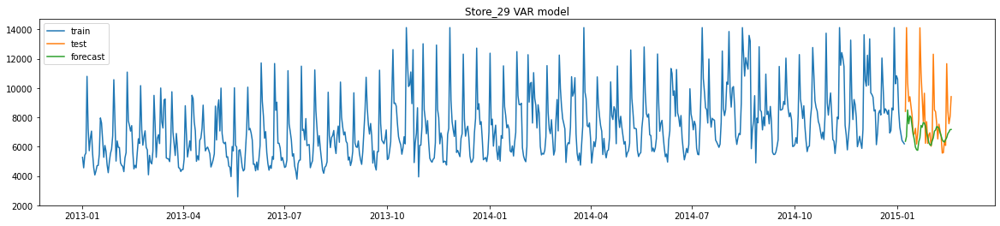

In [232]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_var = mod.fit().predict(start=start_index, end=end_index)
y_hat_var['Sales'] = y_hat_var['Sales'].cumsum()
y_hat_var['Sales'] = y_hat_var['Sales'].add(train_boxcox['Sales'][0])
y_hat_var = np.exp(y_hat_var)

train_test_plot(y_hat_var['Sales'],"Store_29 VAR model")

> Calculate RMSE and MAPE for VAR

In [233]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'])).round(2)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_var['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_29_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Johansen Cointegration Test: Now we will perform Johansen Cointegration Test to check the Cointegration between the variables

In [234]:
coint=coint_johansen(np.asarray(train_boxcox_diff[['Sales','Customers']]),0,1)
traces = coint.lr1
maxeig=coint.lr2
cvts = coint.cvt  ## 0: 90%  1:95% 2: 99%
cvms = coint.cvm   ## 0: 90%  1:95% 2: 99%

N, l = np.asarray(train[['Sales','Customers']]).shape

for i in range(l):
    if traces[i] > cvts[i, 1]:
        rank= i + 1
print(rank)

2


Since the rank is 2 we could say that there is no cointegration between the variables and the series are stationary

> **3. VARMAX MODEL**

#### While modeling using the VARMAX Model we would be using School Holiday as the exegenous variable

In [235]:
exog = train['SchoolHoliday']
mod_varmax = sm.tsa.VARMAX(train_boxcox_diff[['Sales', 'Customers']],exog= exog[1:], order=(12,1), trend='c')
resmax = mod_varmax.fit(maxiter=1000, disp=False)
print(resmax.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  736
Model:                       VARMAX(12,1)   Log Likelihood                1533.825
                              + intercept   AIC                          -2949.650
Date:                    Mon, 19 Jul 2021   BIC                          -2678.177
Time:                            07:11:15   HQIC                         -2844.954
Sample:                        01-02-2013                                         
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                78.92, 25.24   Jarque-Bera (JB):         84.38, 17.67
Prob(Q):                        0.00, 0.97   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.94, 1.12   Skew:                      0.28, -0.06
P

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


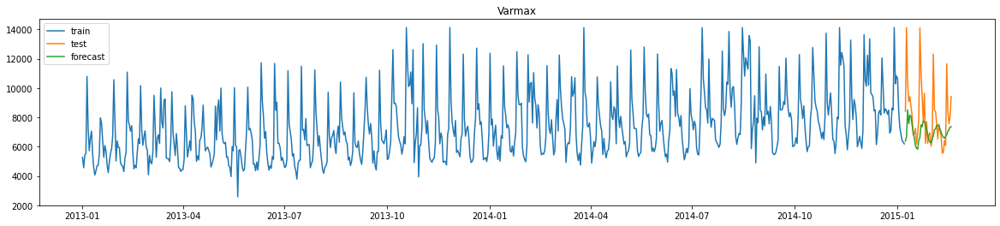

In [236]:
# forecast
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = np.array(exog[-42:]).reshape(42,1))
y_hat_varmax['Sales'] = y_hat_varmax['Sales'].cumsum()
y_hat_varmax['Sales'] = y_hat_varmax['Sales'].add(train_boxcox['Sales'][0])
y_hat_varmax = np.exp(y_hat_varmax)
train_test_plot(y_hat_varmax['Sales'],"Varmax")

> Calculate RMSE and MAPE for VARMAX

In [237]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'])).round(2)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_varmax['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_29_VARMAX_SchoolHoliday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Now we will plot the Inverse Response Function

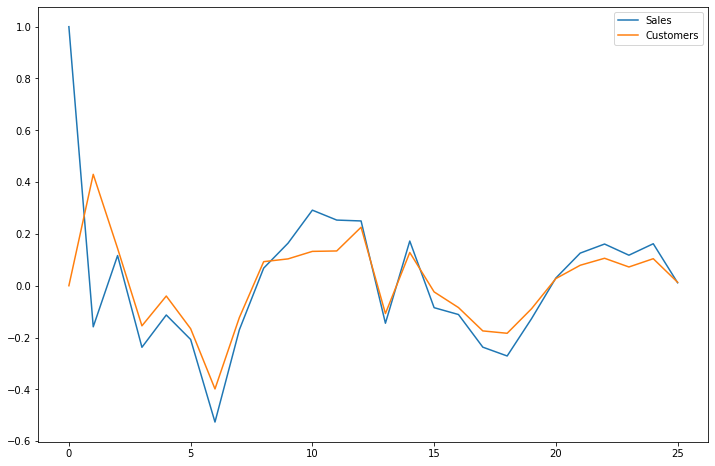

In [238]:
irf = resmax.impulse_responses(steps = 25, orthogonalized= False)
irf.plot()

## Forecasting of Store 31

### EDA: Store 31

In [239]:
df_store_31 = store_df_dictionary.get('Store 8')
df_time_series_store_31 = store_time_df_dictionary.get('Store 8')

<Figure size 1440x288 with 0 Axes>

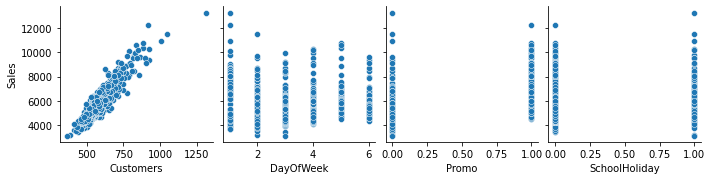

In [240]:
### Analysing the relations between sales and other numerical variables
plt.figure(figsize= [20,4])
sns.pairplot(data = df_store_31, x_vars= ['Customers','DayOfWeek', 'Promo', 'SchoolHoliday'],y_vars = ["Sales"])
plt.show()

We could observe the following from the above plots:<br>
a) Customers and Sales are highly correlated <br>
b) Sales are higher on weekend that that on wekdays<br>
c) Sales are higher when promo is applied

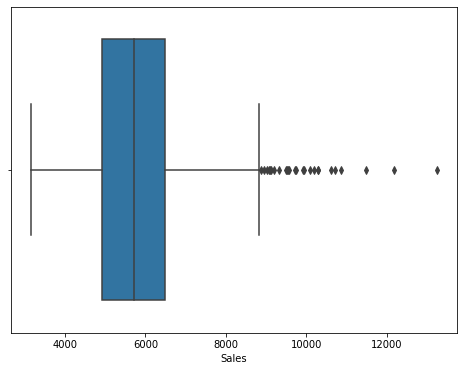

In [241]:
## Spread of Sales using box plot
plt.figure(figsize=(8,6))
sns.boxplot(df_store_31['Sales'])
plt.show()

#### From the above boxplot we could see that there are outliers for Sales less than 5000 and greater than 9000. And the IQR lies between 5000-6800

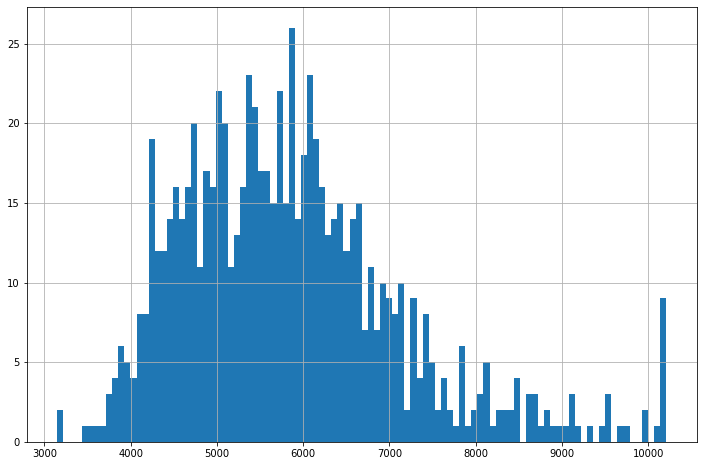

In [242]:
## Dstribution of the Sales
df_time_series_store_31['Sales'].hist(bins= 100)
plt.show()

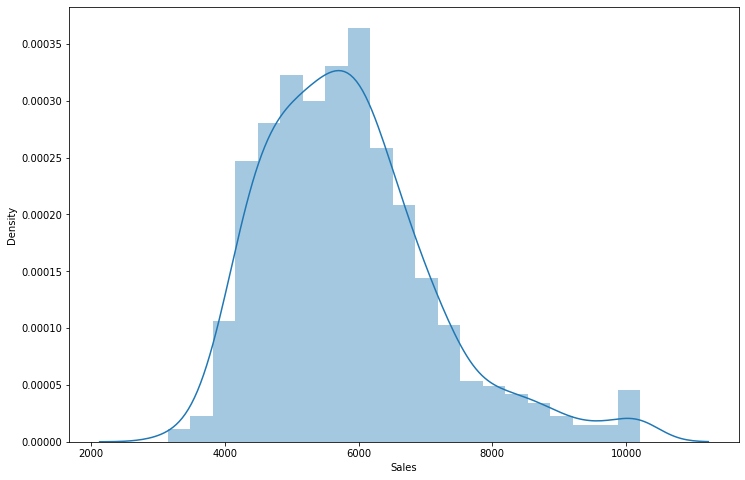

In [243]:
sns.distplot(df_time_series_store_31['Sales'])
plt.show()

#### From the above distribution plot we could see that most of the Sales value for Store 1 lies between 4000-8000 and are peaked at around 600

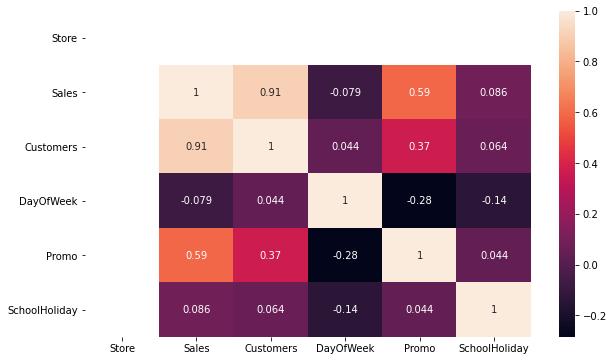

In [244]:
## Analyse correlation using heatmap
plt.figure(figsize=(10,6))
sns.heatmap(df_time_series_store_31.corr(),annot=True)
plt.show()

Using the heatmap to find out the correlation between the features we were able to find out that:<br>
a) Customers and Sales have a very high correlation.<br>
b) Higher correlation was found between Promo and Sales

#### Decomposition of Time Series: Now our next step in the analysis is decomposition of time series for Store 13

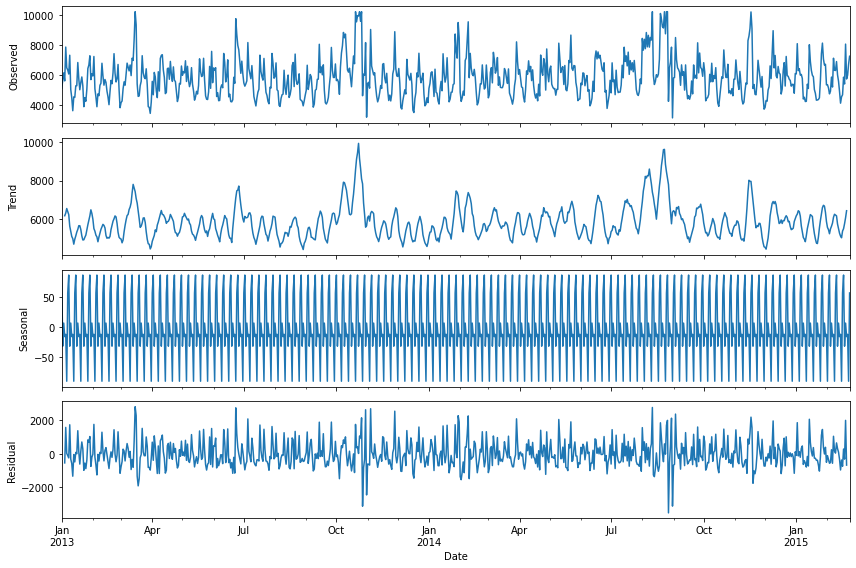

In [245]:
rcParams['figure.figsize']  =12,8
decomposition = sm.tsa.seasonal_decompose(df_time_series_store_31['Sales'],model = 'additive')
fig = decomposition.plot()
plt.show()

### Data Preparation and Train Test Split

In [246]:
print('The data available is for',round(len(df_time_series_store_31)/7,3),'weeks')

The data available is for 112.0 weeks


### Since the data is available for around 88.714 weeks. We would be taking around 6 weeks data that is last 42 days of data as test data and the rest as train data

In [247]:
train = df_time_series_store_31[['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42]
test = df_time_series_store_31[['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:]

In [248]:
print('The length of the train data for Store 31 is',len(train),'and the lenght of the test data for Store 31 is', len(test))

The length of the train data for Store 31 is 742 and the lenght of the test data for Store 31 is 42


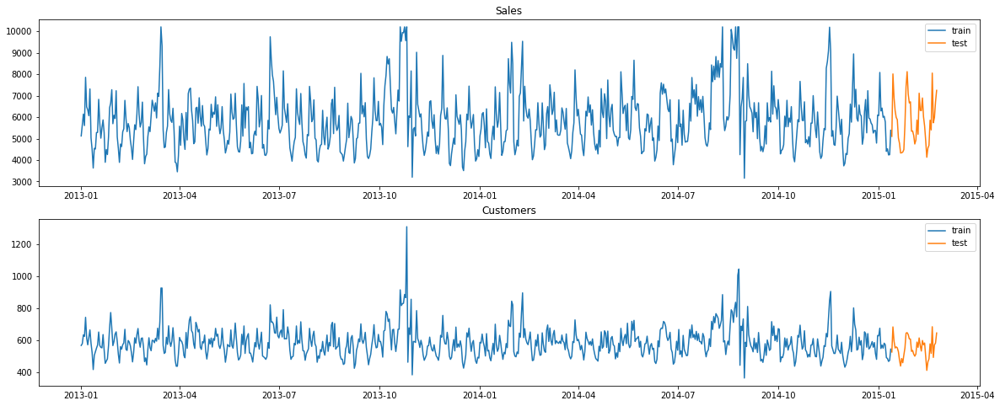

In [249]:
plt.figure(figsize = (20,8))
plt.subplot(211)
plt.plot(train['Sales'],label = 'train')
plt.plot(test['Sales'], label = 'test')
plt.title('Sales')
plt.legend(loc = 'best')

plt.subplot(212)
plt.plot(train['Customers'],label = 'train')
plt.plot(test['Customers'],label = 'test')
plt.title('Customers')
plt.legend(loc = 'best')
plt.show()

### Standardize the data using box cox transformation: Now we will standardize the training data using boxcox transformation

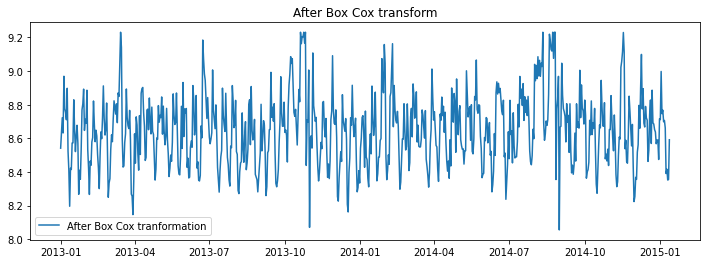

In [250]:
train_boxcox = pd.DataFrame(boxcox(train['Sales'], lmbda=0), index = train.index, columns=['Sales'])
train_boxcox['Customers'] =  pd.Series(boxcox(train['Customers'], lmbda=0), index = train.index)

# plotting Sales after boxcox transformation
plt.figure(figsize=(12,4))
plt.plot(train_boxcox['Sales'], label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

### Check for Stationarity using AD Fuller Test and KPSS test: 
Now we will check the stationarity of the data using Augmented Dicky Fuller test(AD Fuller Test) and Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [251]:
adf_test = adfuller(train['Sales'])

#Sales
print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])


ADF Test for SALES
ADF Statistics: -5.857
Critical value @ 0.05: -2.87
p-value: 0.000000


ADF Test for CUSTOMERS
ADF Statistics: -6.180
Critical value @ 0.05: -2.87
p-value: 0.000000


In [252]:
kpss_test = kpss(train['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 0.243076
Critical Values @ 0.05: 0.46
p-value: 0.100000


KPSS test for Customers
KPSS Statistic: 0.044261
Critical Values @ 0.05: 0.46
p-value: 0.100000


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1711: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1711: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)


* From the ADF Test and KPSS Test results we could see that the training data set is stationary



### Modeling for Store 31

>  AutoCorrelation function

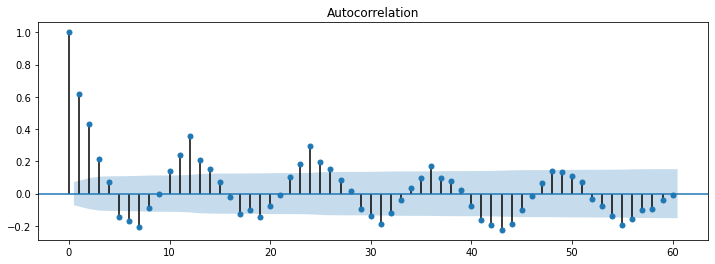

In [253]:
plt.figure(figsize=(12,4))
plot_acf(train_boxcox['Sales'], ax=plt.gca(), lags = 60)
plt.show()

>  Partial AutoCorrelation function

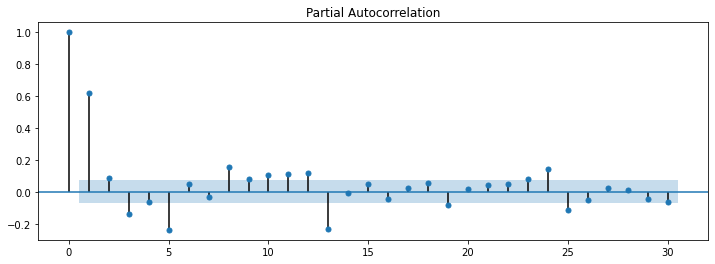

In [254]:
plt.figure(figsize=(12,4))
plot_pacf(train_boxcox['Sales'], ax=plt.gca(), lags = 30)
plt.show()

> **1. ARIMA MODEL**

In [255]:
model = ARIMA(train_boxcox['Sales'], order=(8, 0, 7))
model_fit = model.fit()
print(model_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  742
Model:                     ARMA(8, 7)   Log Likelihood                 356.227
Method:                       css-mle   S.D. of innovations              0.149
Date:                Mon, 19 Jul 2021   AIC                           -678.454
Time:                        07:11:38   BIC                           -600.096
Sample:                    01-01-2013   HQIC                          -648.246
                         - 01-12-2015                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           8.6515      0.014    616.091      0.000       8.624       8.679
ar.L1.Sales     0.4285      0.066      6.489      0.000       0.299       0.558
ar.L2.Sales    -0.3319      0.052     -6.408    

###### Recover the original time series

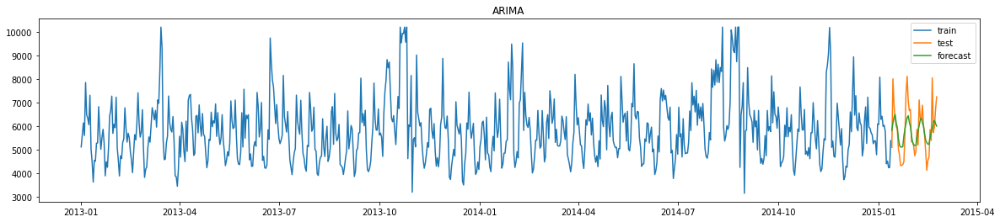

In [256]:
y_hat_ar = df_time_series_store_31['Sales'].copy()
y_hat_ar['ar_forecast_boxcox'] = model_fit.predict(start = test.index.min(), end = test.index.max())
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

train_test_plot(y_hat_ar['ar_forecast'],"ARIMA")

> Calculate RMSE and MAPE for ARIMA

In [257]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_ar['ar_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_ar['ar_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_31_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56




> Check for Granger Casuality Test



In [258]:
grangers_causality_matrix(train,variables = train.columns)

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints d

,Sales_x,Customers_x,DayOfWeek_x,Promo_x,SchoolHoliday_x,StateHoliday_x
Sales_y,1.0000,0.0,0.0,0.000,0.0,1.0
Customers_y,0.0000,1.0,0.0,0.000,0.0,1.0
DayOfWeek_y,0.0000,0.0,1.0,0.000,0.0,1.0
Promo_y,0.0000,0.0,0.0,1.000,0.0,1.0
SchoolHoliday_y,0.0075,0.0,0.0,0.001,1.0,1.0
StateHoliday_y,NaN,NaN,NaN,NaN,NaN,NaN


> **2. VAR MODEL**

In [259]:
mod = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']], order=(8,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                             VAR(8)   Log Likelihood                1507.426
Date:                    Mon, 19 Jul 2021   AIC                          -2944.852
Time:                            07:12:25   BIC                          -2783.525
Sample:                        01-01-2013   HQIC                         -2882.658
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               119.34, 48.86   Jarque-Bera (JB):       347.23, 771.00
Prob(Q):                        0.00, 0.16   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.16, 1.01   Skew:                      -0.39, 0.51
Prob(H) (two-sided):            0.25, 0.94   Kurtosis:                   6.26, 7.89


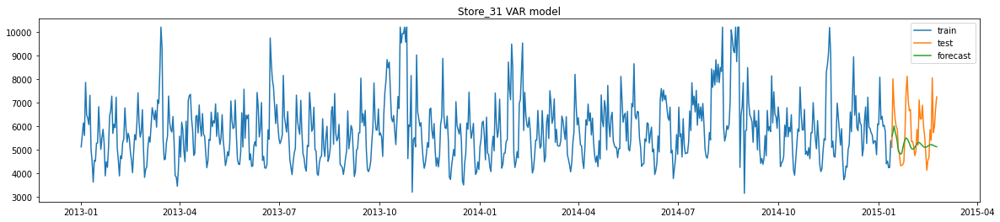

In [260]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_var = mod.fit().predict(start=start_index, end=end_index)
y_hat_var = np.exp(y_hat_var)
train_test_plot(y_hat_var['Sales'],"Store_31 VAR model")

> Calculate RMSE and MAPE for VAR

In [261]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'])).round(2)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_var['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_31_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Johansen Cointegration Test: Now we will perform Johansen Cointegration Test to check the Cointegration between the variables

In [262]:
coint=coint_johansen(np.asarray(train_boxcox[['Sales','Customers']]),0,1)
traces = coint.lr1
maxeig=coint.lr2
cvts = coint.cvt  ## 0: 90%  1:95% 2: 99%
cvms = coint.cvm   ## 0: 90%  1:95% 2: 99%

N, l = np.asarray(train[['Sales','Customers']]).shape

for i in range(l):
    if traces[i] > cvts[i, 1]:
        rank= i + 1
print(rank)

2


Since the rank is 2 we could say that there is no cointegration between the variables and the series are stationary

> **3. VARMAX MODEL**

#### While modeling using the VARMAX Model we would be using School Holiday as the exegenous variable

In [263]:
exog = train['SchoolHoliday']
mod_varmax = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']],exog= exog, order=(8,7), trend='c')
resmax = mod_varmax.fit(maxiter=1000, disp=False)
print(resmax.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                        VARMAX(8,7)   Log Likelihood                1571.518
                              + intercept   AIC                          -3009.037
Date:                    Mon, 19 Jul 2021   BIC                          -2700.210
Time:                            07:22:05   HQIC                         -2889.980
Sample:                        01-01-2013                                         
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                77.82, 40.56   Jarque-Bera (JB):       109.51, 703.05
Prob(Q):                        0.00, 0.45   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.27, 1.10   Skew:                      -0.15, 0.55
P

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


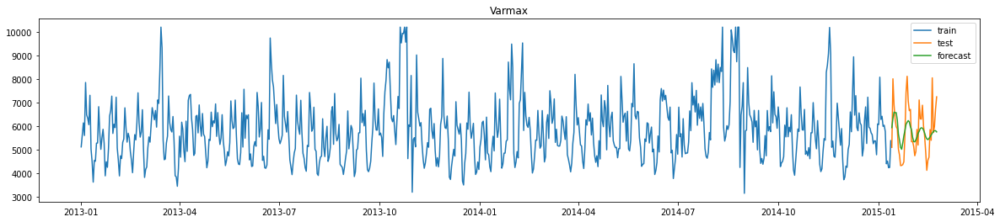

In [264]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)
train_test_plot(y_hat_varmax['Sales'],"Varmax")

> Calculate RMSE and MAPE for VARMAX

In [265]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'])).round(2)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_varmax['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_31_VARMAX_SchoolHoliday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Now we will plot the inverse function

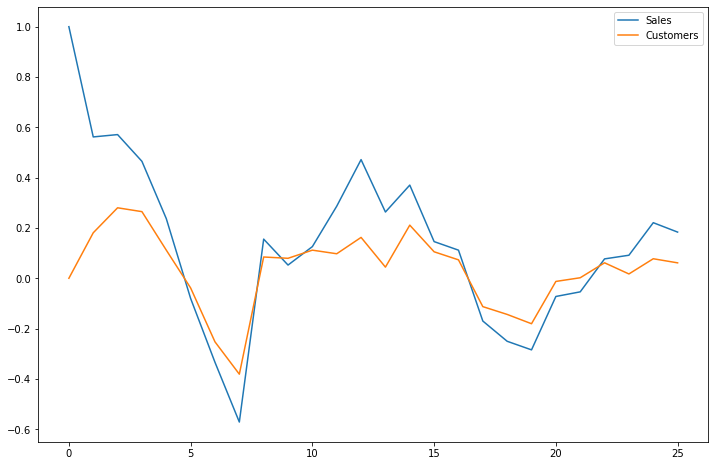

In [266]:
irf = resmax.impulse_responses(steps = 25, orthogonalized= False)
irf.plot()

## Forecasting of Store 46

### EDA: Store 46

In [267]:
df_store_46 = store_df_dictionary.get('Store 9')
df_time_series_store_46 = store_time_df_dictionary.get('Store 9')

<Figure size 1440x288 with 0 Axes>

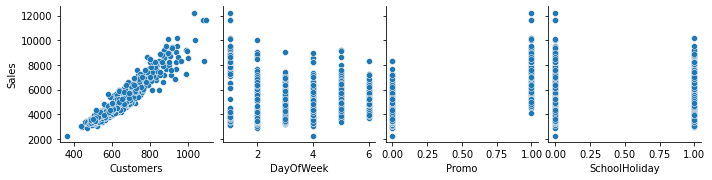

In [268]:
### Analysing the relations between sales and other numerical variables
plt.figure(figsize= (20,4))
sns.pairplot(data = df_store_46, x_vars= ['Customers','DayOfWeek', 'Promo', 'SchoolHoliday'],y_vars = ["Sales"])
plt.show()

We could observe the following from the above plots:<br>
a) Customers and Sales are highly correlated <br>
b) Sales are higher when promo is applied<br>
c) Sales are higher on weekend as compared to weekdays

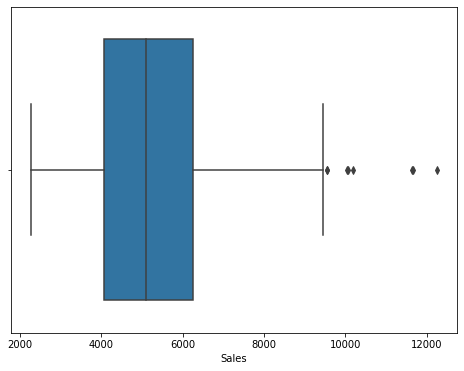

In [269]:
## Spread of Sales using box plot
plt.figure(figsize=(8,6))
sns.boxplot(df_store_46['Sales'])
plt.show()

#### From the above boxplot we could see that there are outliers for Sales greater than 9500. And the IQR lies between 4000-6000

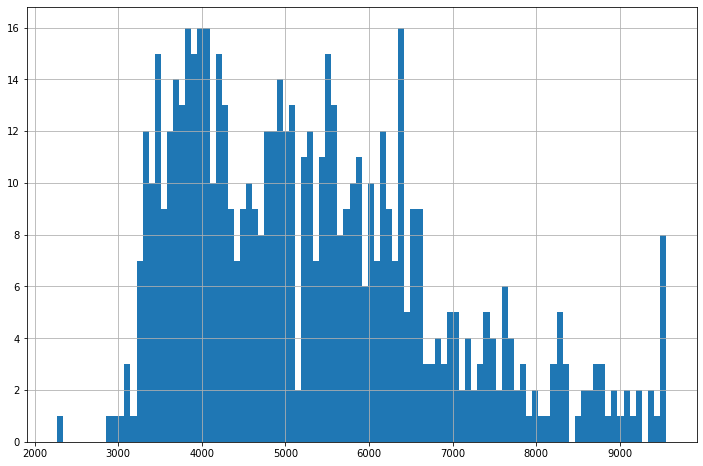

In [270]:
## Dstribution of the Sales
df_time_series_store_46['Sales'].hist(bins= 100)
plt.show()

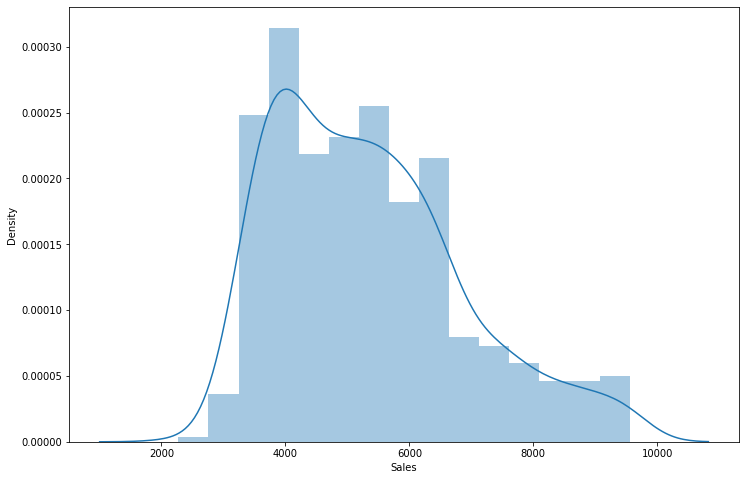

In [271]:
sns.distplot(df_time_series_store_46['Sales'])
plt.show()

#### From the above distribution plot we could see that most of the Sales value for Store 1 lies between 3000-9000 and are peaked at around 4000.<br>Also we could observe a almost Gaussian Distribution of the Sales with slightly right skewed.

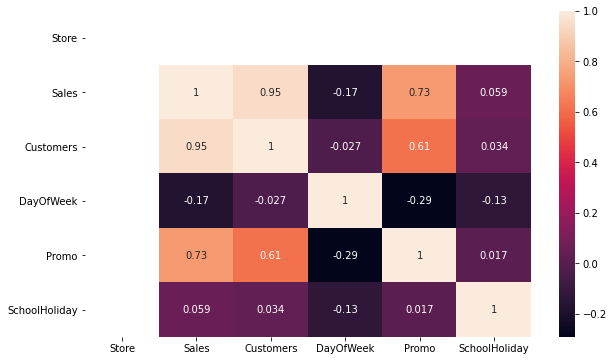

In [272]:
## Analyse correlation using heatmap
plt.figure(figsize=(10,6))
sns.heatmap(df_time_series_store_46.corr(),annot=True)
plt.show()

Using the heatmap to find out the correlation between the features we were able to find out that:<br>
a) Customers and Sales have a very high correlation.<br>
b) Promo and Sales also have a very high correlation

#### Decomposition of Time Series: Now our next step in the analysis is decomposition of time series for Store 3

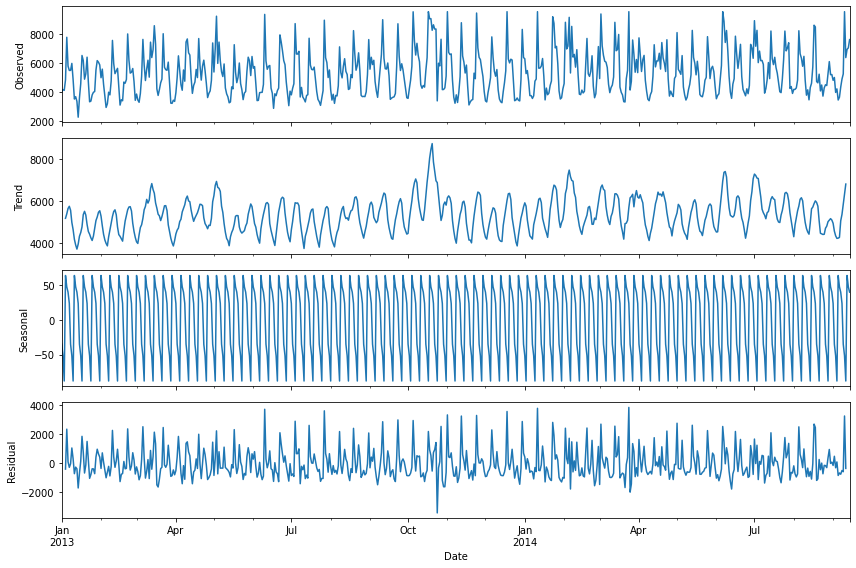

In [273]:
rcParams['figure.figsize']  =12,8
decomposition = sm.tsa.seasonal_decompose(df_time_series_store_46['Sales'],model = 'additive')
fig = decomposition.plot()
plt.show()

### Data Preparation and Train Test Split

In [274]:
print('The data available is for',round(len(df_time_series_store_46)/7,3),'weeks')

The data available is for 88.857 weeks


### Since the data is available for around 111.286 weeks. We would be taking around 6 weeks data that is last 42 days of data as test data and the rest as train data

In [275]:
train = df_time_series_store_46[['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42]
test = df_time_series_store_46[['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:]

In [276]:
print('The length of the train data for Store 46 is',len(train),'and the lenght of the test data for Store 46 is', len(test))

The length of the train data for Store 46 is 580 and the lenght of the test data for Store 46 is 42


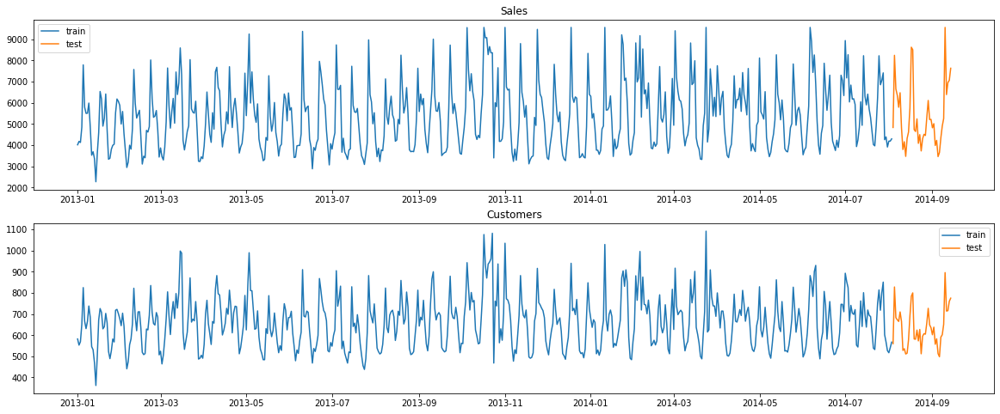

In [277]:
plt.figure(figsize = (20,8))
plt.subplot(211)
plt.plot(train['Sales'],label = 'train')
plt.plot(test['Sales'], label = 'test')
plt.title('Sales')
plt.legend(loc = 'best')

plt.subplot(212)
plt.plot(train['Customers'],label = 'train')
plt.plot(test['Customers'],label = 'test')
plt.title('Customers')
plt.legend(loc = 'best')
plt.show()

### Standardize the data using box cox transformation: Now we will standardize the training data using boxcox transformation

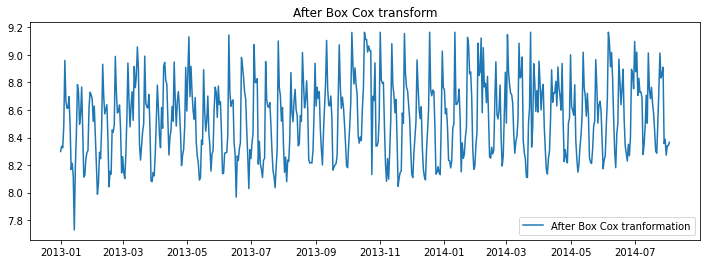

In [278]:
train_boxcox = pd.DataFrame(boxcox(train['Sales'], lmbda=0), index = train.index, columns=['Sales'])
train_boxcox['Customers'] =  pd.Series(boxcox(train['Customers'], lmbda=0), index = train.index)

# plotting Sales after boxcox transformation
plt.figure(figsize=(12,4))
plt.plot(train_boxcox['Sales'], label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

### Check for Stationarity using AD Fuller Test and KPSS test: 
Now we will check the stationarity of the data using Augmented Dicky Fuller test(AD Fuller Test) and Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

In [279]:
adf_test = adfuller(train['Sales'])

#Sales
print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Test for SALES
ADF Statistics: -5.200
Critical value @ 0.05: -2.87
p-value: 0.000009


ADF Test for CUSTOMERS
ADF Statistics: -5.417
Critical value @ 0.05: -2.87
p-value: 0.000003


In [280]:
kpss_test = kpss(train['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 0.592354
Critical Values @ 0.05: 0.46
p-value: 0.023331


KPSS test for Customers
KPSS Statistic: 0.242382
Critical Values @ 0.05: 0.46
p-value: 0.100000


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1711: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)


* From the ADF Test and KPSS Test results we could see that the Sales Datset is not stationary



####  Now we will be Differencing to remove trend 

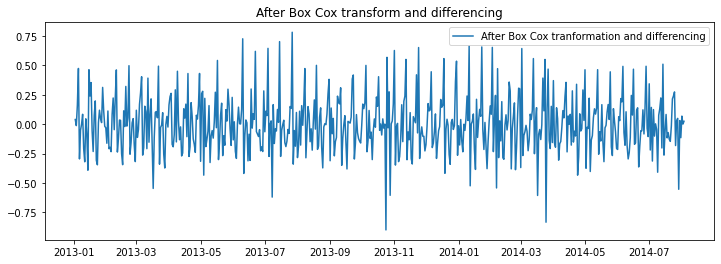

In [281]:
train_boxcox_diff = pd.DataFrame(pd.Series(train_boxcox['Sales'] - train_boxcox['Sales'].shift(), train.index))
train_boxcox_diff['Sales'] = train_boxcox_diff
train_boxcox_diff['Customers'] = train_boxcox['Customers'] - train_boxcox['Customers'].shift()
train_boxcox_diff.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(train_boxcox_diff['Sales'], label='After Box Cox tranformation and differencing')
plt.legend(loc='best')
plt.title('After Box Cox transform and differencing')
plt.show()

#### Check for stationarity after differencing

In [282]:
# Augmented Dickey Fuller test(ADF)
from statsmodels.tsa.stattools import adfuller

# Sales
adf_test = adfuller(train_boxcox_diff['Sales'])

print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train_boxcox_diff['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Test for SALES
ADF Statistics: -10.885
Critical value @ 0.05: -2.87
p-value: 0.000000


ADF Test for CUSTOMERS
ADF Statistics: -10.430
Critical value @ 0.05: -2.87
p-value: 0.000000


Observation:
- Now the training dataset is  stationary.

### Modeling for Store 46

>  AutoCorrelation function

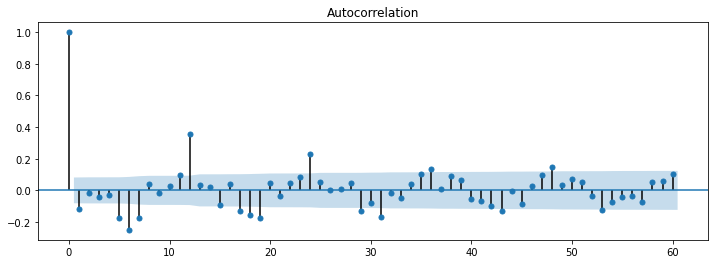

In [283]:
plt.figure(figsize=(12,4))
plot_acf(train_boxcox_diff['Sales'], ax=plt.gca(), lags = 60)
plt.show()

>  Partial AutoCorrelation function

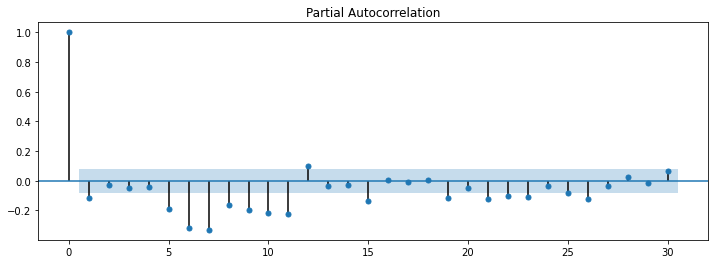

In [284]:
plt.figure(figsize=(12,4))
plot_pacf(train_boxcox_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

> **1. ARIMA MODEL**

In [285]:
model = ARIMA(train_boxcox_diff['Sales'], order=(11, 0, 1))
model_fit = model.fit()
print(model_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  579
Model:                    ARMA(11, 1)   Log Likelihood                 130.159
Method:                       css-mle   S.D. of innovations              0.193
Date:                Mon, 19 Jul 2021   AIC                           -232.319
Time:                        07:22:25   BIC                           -171.261
Sample:                    01-02-2013   HQIC                          -208.512
                         - 08-03-2014                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0001      0.002      0.082      0.934      -0.003       0.003
ar.L1.Sales     -0.9482      0.175     -5.426      0.000      -1.291      -0.606
ar.L2.Sales     -0.5862      0.085     -6.88

###### Recover the original time series

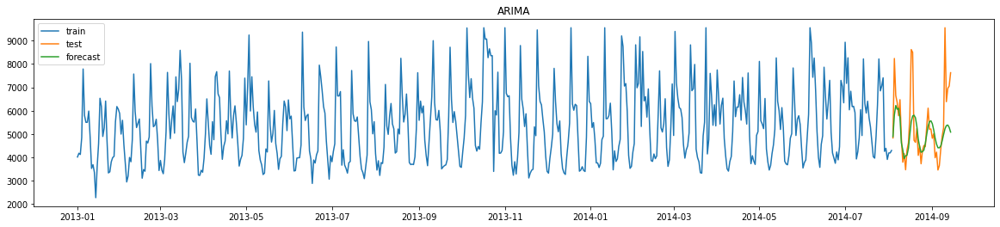

In [286]:
y_hat_ar = df_time_series_store_46['Sales'].copy()
y_hat_ar['ar_forecast_boxcox_diff'] = model_fit.predict(start = test.index.min(), end = test.index.max())
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox_diff'].cumsum()
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox'].add(train_boxcox['Sales'][0])
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

train_test_plot(y_hat_ar['ar_forecast'],"ARIMA")

> Calculate RMSE and MAPE for ARIMA

In [287]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_ar['ar_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_ar['ar_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_46_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56




> Check for Granger Casuality Test



In [288]:
grangers_causality_matrix(train,variables = train.columns)

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 1, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 3, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 4, but rank is 0
  'rank is %d' % (J, J_), ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints d

,Sales_x,Customers_x,DayOfWeek_x,Promo_x,SchoolHoliday_x,StateHoliday_x
Sales_y,1.0000,0.0000,0.0,0.0000,0.0,1.0
Customers_y,0.0000,1.0000,0.0,0.0000,0.0,1.0
DayOfWeek_y,0.0000,0.0000,1.0,0.0000,0.0,1.0
Promo_y,0.0000,0.0000,0.0,1.0000,0.0,1.0
SchoolHoliday_y,0.0826,0.0175,0.0,0.0011,1.0,1.0
StateHoliday_y,NaN,NaN,NaN,NaN,NaN,NaN


> **2. VAR MODEL**

In [289]:
mod = sm.tsa.VARMAX(train_boxcox_diff[['Sales', 'Customers']], order=(11,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  579
Model:                            VAR(11)   Log Likelihood                1144.234
Date:                    Mon, 19 Jul 2021   AIC                          -2194.468
Time:                            07:23:00   BIC                          -1989.487
Sample:                        01-02-2013   HQIC                         -2114.546
                             - 08-03-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                56.77, 37.36   Jarque-Bera (JB):          81.75, 8.70
Prob(Q):                        0.04, 0.59   Prob(JB):                   0.00, 0.01
Heteroskedasticity (H):         1.12, 1.35   Skew:                       0.12, 0.27
Prob(H) (two-sided):            0.42, 0.04   Kurtosis:                   4.83, 3.26


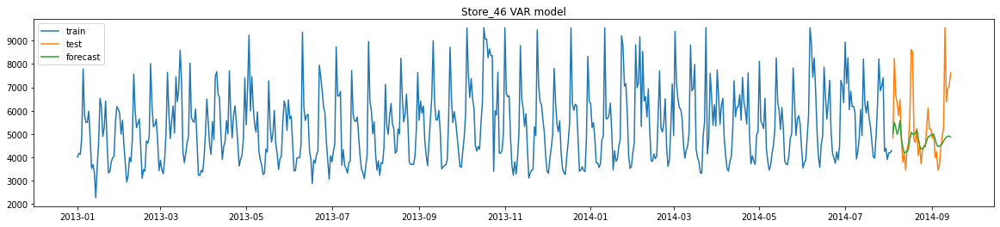

In [290]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_var = mod.fit().predict(start=start_index, end=end_index)
y_hat_var['Sales'] = y_hat_var['Sales'].cumsum()
y_hat_var['Sales'] = y_hat_var['Sales'].add(train_boxcox['Sales'][0])
y_hat_var = np.exp(y_hat_var)

train_test_plot(y_hat_var['Sales'],"Store_46 VAR model")

> Calculate RMSE and MAPE for VAR

In [291]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'])).round(2)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_var['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_46_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Johansen Cointegration Test: Now we will perform Johansen Cointegration Test to check the Cointegration between the variables

In [292]:
coint=coint_johansen(np.asarray(train_boxcox_diff[['Sales','Customers']]),0,1)
traces = coint.lr1
maxeig=coint.lr2
cvts = coint.cvt  ## 0: 90%  1:95% 2: 99%
cvms = coint.cvm   ## 0: 90%  1:95% 2: 99%

N, l = np.asarray(train[['Sales','Customers']]).shape

for i in range(l):
    if traces[i] > cvts[i, 1]:
        rank= i + 1
print(rank)

2


Since the rank is 2 we could say that there is no cointegration between the variables and the series are stationary

> **3. VARMAX MODEL**

#### While modeling using the VARMAX Model we would be using School Holiday as the exegenous variable

In [293]:
exog = train['SchoolHoliday']
mod_varmax = sm.tsa.VARMAX(train_boxcox_diff[['Sales', 'Customers']],exog= exog[1:], order=(11,1), trend='c')
resmax = mod_varmax.fit(maxiter=1000, disp=False)
print(resmax.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  579
Model:                       VARMAX(11,1)   Log Likelihood                1154.142
                              + intercept   AIC                          -2198.285
Date:                    Mon, 19 Jul 2021   BIC                          -1958.413
Time:                            07:28:08   HQIC                         -2104.759
Sample:                        01-02-2013                                         
                             - 08-03-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                44.71, 37.72   Jarque-Bera (JB):         137.93, 5.38
Prob(Q):                        0.28, 0.57   Prob(JB):                   0.00, 0.07
Heteroskedasticity (H):         1.15, 1.38   Skew:                      -0.16, 0.21
P

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


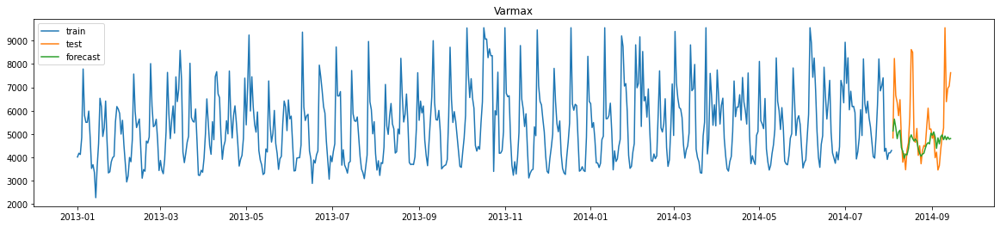

In [294]:
# forecast
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = np.array(exog[-42:]).reshape(42,1))
y_hat_varmax['Sales'] = y_hat_varmax['Sales'].cumsum()
y_hat_varmax['Sales'] = y_hat_varmax['Sales'].add(train_boxcox['Sales'][0])
y_hat_varmax = np.exp(y_hat_varmax)
train_test_plot(y_hat_varmax['Sales'],"Varmax")

> Calculate RMSE and MAPE for VARMAX

In [295]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'])).round(2)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_varmax['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_46_VARMAX_SchoolHoliday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,22.88,1969.32
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,99.98,6766.34
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Now we will plot the Inverse Response Function

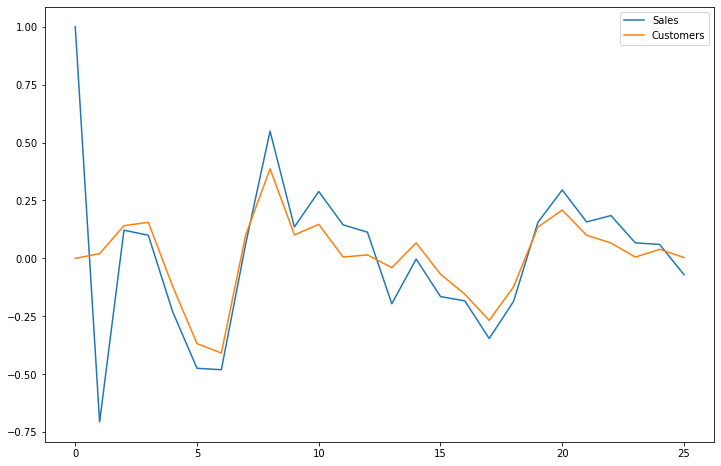

In [296]:
irf = resmax.impulse_responses(steps = 25, orthogonalized= False)
irf.plot()

# Summary and Conclusions

> For different stores we tried forecasting using **ARIMA** **VAR** and **VARMAX** models and found that in most of the stores VARMAX yielded better MSE and RMSE forecating results. However in some cases STore1, Store 9, Store 31 and Store 46 ARIMA also outperformed.

> We experimented the forecasting using 'PROMO', 'School Holiday' and 'Day of Week' as different exogenous variables in which we found out that 'School Holiday' provided us better results when we tried to forecast